In [1]:
# Import library yang dibutuhkan
import math
import numpy as np
import open3d as o3d
import time
import matplotlib.pyplot as plt
from skspatial.objects import Plane
import shapefile as sf
import rasterio
import geopandas as gpd
from shapely.geometry import Polygon, LineString, MultiPoint, Point, MultiPolygon, MultiLineString
from shapely.geometry import MultiPoint
from rdp import rdp
import pandas as pd
from geopandas import GeoSeries, GeoDataFrame
import os
from scipy import spatial
import alphashape
import copy
from scipy.spatial import Delaunay
from sklearn.neighbors import KDTree
import random
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
from shapely.ops import unary_union
import matplotlib.cm as cm
from scipy.spatial import ConvexHull
import re
from collections import defaultdict

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


## 1. Persiapan data

a. Pengambilan data roof

In [2]:
# Input directory file point cloud atap bangunan
pcd_dir = "D:/PENELITIAN/2025/MATCHMAKING/DATA/atap_result_GMM_test.ply"
# Membaca data point cloud
pcd = o3d.io.read_point_cloud(pcd_dir)
pcd_roof = np.asarray(pcd.points)

# Transformasi koordinat menjadi lokal dan visualisasi point cloud
[x0, y0, z0] = np.mean(pcd_roof, axis=0)
pcdroof_transform = pcd_roof - np.array([x0, y0, z0])
print(pcdroof_transform)

[[-46.13454711 -18.50339602  -4.10521947]
 [-46.16854711 -18.80639602  -4.07122247]
 [-46.10054611 -18.87339602  -4.07122247]
 ...
 [ 12.73345689  47.23060198   3.26379953]
 [ 13.10345189  47.02860698   3.26379953]
 [ 12.32944989  47.02860698   3.46478853]]


In [3]:
x0, y0, z0

(np.float64(781871.0105461122),
 np.float64(9240025.008396022),
 np.float64(788.8091984667387))

b. Pengambilan data fasad

In [4]:
pcdfasad_dir = 'D:/PENELITIAN/2025/MATCHMAKING/DATA/fasad_tes_ascii.ply'

# Membaca data point cloud
pcd_fasadread = o3d.io.read_point_cloud(pcdfasad_dir)
pcd_fasad = np.asarray(pcd_fasadread.points)
pcdfasad_transform = pcd_fasad - np.array([x0, y0, z0])
print(pcdfasad_transform)

[[-90.84370611 -35.36004202  -0.20678147]
 [-85.41195111 -44.61203402   4.86383653]
 [-85.44554411 -44.55374502   4.54919953]
 ...
 [ 42.11645289  73.78660198  -0.57122247]
 [ 42.11645289  73.75359698  -2.92620247]
 [ 40.23145789  68.36761098  -3.56517947]]


In [5]:
buffer_radius = 0.25        # sesuaikan skala (meter kalau koordinat meter)
quad_segs = 16
clean_buffer = 0.0          # contoh 0.001 untuk heal
simplify_tol = 0.0          # contoh 0.01 untuk rapihin area
keep_interior_rings = False

densify_step = 1.0          # 1 meter antar vertex (approx)


# ----------------------------
# GEOM HELPERS
# ----------------------------
def dissolve_from_xy(xy: np.ndarray,
                     buffer_radius: float,
                     quad_segs: int = 16,
                     clean_buffer: float = 0.0,
                     simplify_tol: float = 0.0):
    if xy.size == 0:
        raise ValueError("xy kosong")

    buffers = [Point(float(x), float(y)).buffer(buffer_radius, quad_segs=quad_segs)
               for x, y in xy]

    area = unary_union(buffers)

    if clean_buffer and clean_buffer != 0.0:
        area = area.buffer(clean_buffer).buffer(-clean_buffer)

    if simplify_tol and simplify_tol != 0.0:
        area = area.simplify(simplify_tol, preserve_topology=True)

    if isinstance(area, (Polygon, MultiPolygon)):
        return area

    if isinstance(area, GeometryCollection):
        polys = []
        for g in area.geoms:
            if isinstance(g, Polygon):
                polys.append(g)
            elif isinstance(g, MultiPolygon):
                polys.extend(list(g.geoms))
        if not polys:
            raise ValueError("Hasil dissolve tidak menghasilkan polygon (buffer_radius mungkin terlalu kecil).")
        return unary_union(polys)

    raise ValueError(f"Tipe hasil dissolve tidak didukung: {type(area)}")


def area_to_multilinestring(area, keep_interior_rings: bool = False) -> MultiLineString:
    """
    Polygon/MultiPolygon -> MultiLineString.
    keep_interior_rings=False => hanya exterior boundary
    True => termasuk holes
    """
    lines = []

    def add_boundary(poly: Polygon):
        if keep_interior_rings:
            b = poly.boundary
            if isinstance(b, LineString):
                lines.append(b)
            elif isinstance(b, MultiLineString):
                lines.extend(list(b.geoms))
        else:
            lines.append(LineString(poly.exterior.coords))

    if isinstance(area, Polygon):
        add_boundary(area)
        return MultiLineString(lines)

    if isinstance(area, MultiPolygon):
        for p in area.geoms:
            add_boundary(p)
        return MultiLineString(lines)

    raise ValueError(f"Tipe area tidak didukung: {type(area)}")


def densify_linestring(ls: LineString, step: float) -> LineString:
    """
    Tambah vertex pada LineString setiap 'step' satuan jarak.
    Menggunakan interpolasi sepanjang length garis.
    """
    if ls.is_empty:
        return ls
    if step <= 0:
        raise ValueError("step harus > 0")

    length = ls.length
    if length == 0:
        return ls

    # titik awal + titik tiap step + titik akhir
    n = int(np.floor(length / step))
    distances = [0.0] + [i * step for i in range(1, n + 1)] + [length]

    coords = []
    for d in distances:
        p = ls.interpolate(d)
        coords.append((p.x, p.y))

    # hilangkan duplikat berurutan (kadang terjadi kalau length pas kelipatan step)
    cleaned = [coords[0]]
    for c in coords[1:]:
        if c != cleaned[-1]:
            cleaned.append(c)

    # butuh minimal 2 titik untuk LineString
    if len(cleaned) < 2:
        return ls
    return LineString(cleaned)


def densify_multilinestring(mls: MultiLineString, step: float) -> MultiLineString:
    densified = []
    for g in mls.geoms:
        if isinstance(g, LineString):
            d = densify_linestring(g, step)
            if not d.is_empty and len(d.coords) >= 2:
                densified.append(d)
        elif isinstance(g, MultiLineString):
            for gg in g.geoms:
                d = densify_linestring(gg, step)
                if not d.is_empty and len(d.coords) >= 2:
                    densified.append(d)
    return MultiLineString(densified)


# XY only
xy = pcdfasad_transform [:, :2]

# Buffer + dissolve -> area
area_xy = dissolve_from_xy(
    xy,
    buffer_radius=buffer_radius,
    quad_segs=quad_segs,
    clean_buffer=clean_buffer,
    simplify_tol=simplify_tol
)

# Boundary -> MultiLineString
fasad_multilinestrings = area_to_multilinestring(area_xy, keep_interior_rings=keep_interior_rings)

# Densify vertex ~ tiap 1 meter
mls_dens = densify_multilinestring(fasad_multilinestrings, step=densify_step)

points_fasad = np.array([
    [x, y]
    for ls in mls_dens.geoms
    for (x, y) in ls.coords
])

In [6]:
fasad_multilinestrings

c. pengambilan data tif

In [7]:
# Reading elevation data (GeoTiff format)
# Input directory file DTM untuk ekstrusi bangunan
elevation_dir = "D:/PENELITIAN/2025/MATCHMAKING/DATA/DTM_frompcd.tif"
dataset = rasterio.open(elevation_dir)

# Extracting elevation band (assuming raster data only have one band)
ground_elevation = dataset.read(1)

In [8]:
# get the persil file from folder and export to geoseries because need to translate into local 
# Read the shapefile of persil in folder

gdf_persil = gpd.read_file("D:/PENELITIAN/2025/MATCHMAKING/DATA/persil_UTMtest_icp.shp")
#translate persil to local coordinates
gdf_persil_trans = gdf_persil.translate(-x0, -y0, -z0)

d. Pengolahan data persil, adjustment

In [11]:
def nn_icp(nn_persil, nn_control, rdt):
    import scipy.spatial as spatial
    import numpy as np
    
    control_tree = spatial.cKDTree(nn_control)
    titik_persil= []
    titik_kontrol = []
    persil_idx = []
    kontrol_idx = []
    dist_nn = []
    for i, xyz in enumerate(nn_persil):
            dd, idx = control_tree.query(xyz, k=1)
            if dd < rdt:
                titik_persil.append(xyz)
                titik_kontrol.append(nn_control[idx])
                persil_idx.append(i)
                kontrol_idx.append(idx)
                dist_nn.append(dd)
            else:
                continue

    cekdup = []
    l_duplicate = []
    for i in kontrol_idx:
        if i not in cekdup:
            cekdup.append(i)
        else:
            l_duplicate.append(i)

    n_dup = len(l_duplicate)
    list_dupfix = []
    
    if n_dup>0:
        for list_idx_dup in l_duplicate:
            list_dup = np.array([[1]])
            list_dist = np.array([[0.02]])
            idx_dup = [i for i ,e in enumerate(kontrol_idx) if e == list_idx_dup]
            for idx in idx_dup:
                dist_d = dist_nn[idx]
                list_dup = np.vstack([list_dup,idx])
                list_dist = np.vstack([list_dist,dist_d])
            list_dup = np.delete(list_dup,0, axis=0)
            list_dist = np.delete(list_dist,0, axis=0)
            min_idx = list_dist.argmin()
            list_dup = np.delete(list_dup, min_idx, axis=0)
            list_dupfix.extend(list_dup)
    
    n_listdup = len(list_dupfix)

    if n_listdup > 0:
        persil_idx = np.delete(persil_idx, list_dupfix, axis=0)
        kontrol_idx = np.delete(kontrol_idx, list_dupfix, axis=0)

    return titik_persil, titik_kontrol, persil_idx, kontrol_idx
	
def apply_transform(transform, coord):
    import numpy as np
    x_h = np.ones((coord.shape[0] + 1, coord.shape[1]), dtype=coord.dtype)
    x_h[:-1, :] = coord
    
    x_t = np.dot(transform, x_h)
    
    return x_t[:2] / x_t[-1]

def icp(attr1, attr2, attr3, tss, rad_t):
		import numpy as np
		import math

		# fungsi ICP
		#transform_m = np.asarray([[0.862, 0.011, 0.5], [-0.139, 0.967, 0.7], [0.487, 0.255, -1.4], [0.0, 0.0, 1.0]])

		# While loop variables
		curr_iteration = 0
		cost_change_threshold = tss
		prev_cost = np.mean(attr1, axis=0) - np.mean(attr2, axis=0)
		prev_cost = math.sqrt((prev_cost[0]**2)+(prev_cost[1]**2))

		while (True):
			# 1. Find nearest neighbors, default radius = 4 m
			
			new_source_points, new_target_points, source_idx, target_idx = nn_icp(attr1,attr2,rad_t)
			new_source_points = np.asarray(new_source_points)
			new_target_points = np.asarray(new_target_points)

			# 2. Find point cloud centroids and their repositions
			source_centroid = np.mean(new_source_points, axis=0)
			target_centroid = np.mean(new_target_points, axis=0)
			source_repos = np.zeros_like(new_source_points)
			target_repos = np.zeros_like(new_target_points)
			source_repos = np.asarray([new_source_points[ind] - source_centroid for ind in range(len(new_source_points))])
			target_repos = np.asarray([new_target_points[ind] - target_centroid for ind in range(len(new_target_points))])

			# 3. Find correspondence between source and target point clouds
			cov_mat = target_repos.transpose() @ source_repos

			U, X, Vt = np.linalg.svd(cov_mat, full_matrices=True)
			R = U @ Vt
			t = target_centroid - R @ source_centroid
			t = np.reshape(t, (1,2))
			curr_cost = np.linalg.norm(target_repos - (R @ source_repos.T).T)
			tress = abs(prev_cost - curr_cost)
			if (tress > cost_change_threshold):
				prev_cost = curr_cost
				transform_m = np.hstack((R, t.T))
				transform_m = np.vstack((transform_m, np.array([0, 0, 1])))
				# If cost_change is acceptable, update source with new transformation matrix
				pose_attr1 = apply_transform(transform_m, attr1.T)
				attr1 = pose_attr1.T
				curr_iteration += 1
				for k, coordattr3 in enumerate(attr3):
					pose_attr3 = apply_transform(transform_m, coordattr3.T)
					attr3_ = pose_attr3.T
					attr3[k] = attr3_
			else:
				break
		return source_idx, target_idx, attr3

In [12]:
dense_persil = gdf_persil_trans.segmentize(max_segment_length=0.5)
vtx_coordpersil = dense_persil.extract_unique_points()
coord_persil = vtx_coordpersil.get_coordinates()
coord_persil = np.asarray(coord_persil)

list_oripersil = []
for polipersil in gdf_persil_trans:
    coord_oripersil = polipersil.exterior.coords[:]
    coord_oripersil = np.array(coord_oripersil)
    list_oripersil.append(coord_oripersil)

idx_p, idx_c, vtx_transformpersil = icp(coord_persil,points_fasad, list_oripersil, 0.01,4)

shape_polygonpersil = []
for coord in vtx_transformpersil:
    poly = Polygon(coord)
    shape_polygonpersil.append(poly)

## 2. Pengolahan atap

a. Clipping per persil

In [13]:
pcdmultipoint = MultiPoint(pcdroof_transform)

pcdroof_persil = []
for pppp in shape_polygonpersil:
    gdf_eachpersilicp = gpd.GeoSeries(pppp)
    gdf_shapepoint = gpd.GeoSeries(pcdmultipoint)
    gdf_clipoint = gdf_shapepoint.clip(gdf_eachpersilicp)
    coordxyz = gdf_clipoint.get_coordinates(include_z=True)
    coordxyz2 = np.array(coordxyz)
    pcdroof_persil.append(coordxyz2)

In [14]:
pcdroof_persil

[array([[-29.20454611,  27.54060398,  -2.35521947],
        [-29.10354511,  27.43960598,  -2.35521947],
        [-29.10354511,  27.50760298,  -2.25420547],
        ...,
        [-14.52954711,  24.54560498,   1.21082153],
        [-14.46254611,  24.71360398,   1.17682453],
        [-14.42854511,  24.61260198,   1.17682453]]),
 array([[-14.12554811, -17.76239602,   1.27777653],
        [-14.05854611, -17.89739602,   1.27777653],
        [-13.95754511, -17.76239602,   1.27777653],
        ...,
        [  4.58745389, -23.88839602,  -0.87517747],
        [  4.65545389, -23.95539602,  -0.90917447],
        [  4.82345389, -24.02339602,  -1.01018747]]),
 array([[-48.49054611,   7.11060298,  -3.02819247],
        [-48.49054611,   7.21160498,  -2.99419647],
        [-48.42354611,   7.27860298,  -2.96117647],
        ...,
        [-31.99854511,   2.80260498,   3.22882653],
        [-31.93054411,   2.56660498,   3.16180953],
        [-31.86354711,   2.73460398,   3.22882653]]),
 array([[-35.599547

b. Region growing untuk memperoleh kumpulan atap per persil

In [ ]:
# Define a function to calculate normals and curves of point cloud
def normalsEstimation(pointcloud, nn_global, VP):
    ViewPoint = np.array(VP)
    normals = np.empty((np.shape(pointcloud)))
    curv = np.empty((len(pointcloud),1))
    for index in range(len(pointcloud)):
        nnglob_idx = nn_global[index]
        ceknngblob = len(nnglob_idx)
        if ceknngblob>10:
            nn_loc = pointcloud[nn_global[index]]
            COV = np.cov(nn_loc,rowvar=False)
            eigval, eigvec = np.linalg.eig(COV)
            idx = np.argsort(eigval)
            nor = eigvec[:,idx][:,0]
            if nor.dot((ViewPoint-pointcloud[index,:])) > 0:
                normals[index] = nor
            else:
                normals[index] = - nor
            curv[index] = eigval[idx][0] / np.sum(eigval)
        else:
            continue
    return normals, curv

# Define a region growing function
def regionGrowing(pointcloud, nn_glob, VPin, theta, curv_val):
    print('Starting region growing')
    start = time.time()
    normals, curvature = normalsEstimation(pointcloud,nn_global=nn_glob, VP=VPin)
    order = curvature[:,0].argsort().tolist() 
    region = []
    
    theta_th = theta / 180.0 * math.pi 
    cur_th = np.percentile(curvature, curv_val)
    
    while len(order) > 0:
        region_cur = []
        seed_cur = [] 
        poi_min = order[0] 
        region_cur.append(poi_min)
        seedval = 0
        seed_cur.append(poi_min)
        order.remove(poi_min)
        while seedval < len(seed_cur):
            nn_loc = nn_glob[seed_cur[seedval]] 
            for j in range(len(nn_loc)):
                nn_cur = nn_loc[j]
                if all([nn_cur in order, np.arccos(np.abs(np.dot(normals[seed_cur[seedval]],normals[nn_cur])))<theta_th]):
                    region_cur.append(nn_cur)
                    order.remove(nn_cur)
                    if curvature[nn_cur] < cur_th:
                        seed_cur.append(nn_cur)
            seedval+=1
        if len(region_cur) > 300:
            region.append(region_cur)
            print('Region {}, point cloud count {}'.format((len(region)-1), len(region_cur)))
    end = time.time()
    MinutesTook = (end-start)/60
    print('Region growing finished, took: {} minutes'.format(MinutesTook))
    return region

In [ ]:
pcdRG1 = []
for i, pcds in enumerate(pcdroof_persil):
    tree = spatial.KDTree(pcds)
    nnInd = tree.query_ball_point(pcds[:len(pcds)], 1)
    vaverage = np.average(pcds)
    regionGrew1 = regionGrowing(pcds, nnInd, vaverage, 60 , 95)
    pcdbdg = []
    for j, region in enumerate(regionGrew1):
        coord = np.zeros((len(region), 3))
        for n, indices in enumerate(region):
            coord[n] = pcds[indices]
        pcdbdg.append(coord)
        coordtrans = coord + [x0,y0,z0]
        pcdply = o3d.geometry.PointCloud()
        pcdply.points = o3d.utility.Vector3dVector(np.asarray(coordtrans))
        filenamereg = ("D:/PENELITIAN/2025/MATCHMAKING/HASIL/RG1/pcdroof_persil_"+str(i)+"_roof_"+str(j)+".ply")
        o3d.io.write_point_cloud(filenamereg, pcdply)
    pcdRG1.append(pcdbdg)

In [ ]:
pcdRG1

JIKA SUDAH ADA HASIL REGION GROWING ATAPNYA

In [15]:
# ===============================
# parameter
# ===============================
folder_rg1 = r"D:/PENELITIAN/2025/MATCHMAKING/HASIL/RG1_300"
offset = np.array([x0, y0, z0], dtype=float)

# ===============================
# regex untuk ambil i dan j
# ===============================
pattern = re.compile(r"pcdroof_persil_(\d+)_roof_(\d+)\.ply")

# ===============================
# penampung sementara
# ===============================
tmp = defaultdict(dict)   # tmp[i][j] = np.ndarray(N,3)

# ===============================
# load semua ply
# ===============================
for fname in os.listdir(folder_rg1):
    match = pattern.match(fname)
    if not match:
        continue

    i = int(match.group(1))   # persil index
    j = int(match.group(2))   # roof index

    fpath = os.path.join(folder_rg1, fname)

    pcd = o3d.io.read_point_cloud(fpath)
    pts = np.asarray(pcd.points)

    # kembalikan ke koordinat asli (undo translasi)
    pts_local = pts - offset

    tmp[i][j] = pts_local

# ===============================
# susun jadi list-of-lists seperti pcdRG1
# ===============================
pcdRG1 = []

for i in sorted(tmp.keys()):
    roofs = []
    for j in sorted(tmp[i].keys()):
        roofs.append(tmp[i][j])
    pcdRG1.append(roofs)

print(f"Jumlah persil: {len(pcdRG1)}")
print(f"Contoh shape pcdRG1[0][0]: {pcdRG1[0][0].shape}")

Jumlah persil: 44
Contoh shape pcdRG1[0][0]: (5776, 3)


In [16]:
pcdRG1

[[array([[-26.51254511,  32.45460498,  -2.82622747],
         [-27.48854711,  32.32060298,  -2.92717947],
         [-27.45454611,  32.15160398,  -2.89318247],
         ...,
         [-18.16454511,  18.92460298,  -2.45617147],
         [-18.06354711,  18.95760398,  -2.45617147],
         [-18.26554711,  18.75560398,  -2.38921547]])],
 [array([[ -5.40854911, -19.41239602,  -1.31322647],
         [ -6.28354911, -19.44539602,  -0.90917447],
         [ -6.24954411, -19.78239602,  -1.07720347],
         ...,
         [-12.67854511, -15.03639602,  -3.56719447],
         [-13.08254511, -15.23839602,  -3.43218447],
         [-12.88054511, -14.93539602,  -3.56719447]])],
 [array([[-39.03254511,   0.37860298,   1.74878453],
         [-39.87454611,   0.07560398,   1.34479353],
         [-39.87454611,   0.17660298,   1.27777653],
         ...,
         [-43.20654511,  11.21660198,   0.80682953],
         [-43.23954611,  11.28360398,   0.87482253],
         [-43.17254711,  11.28360398,   0.70581653]

c. Membuat boundary per atap dalam satu persil

In [17]:
# membuat ceiling dan persamaan bidang ceiling (dipaksa horizontal: normal [0,0,1])
l_zmax = []
pcdplanar_persil = []

for pcds in pcdRG1:
    lpcd = []
    z_max = []

    for roof in pcds:
        # z ceiling: pakai z_max (ceiling di atas)
        z_const = float(np.max(roof[:, 2]))
        z_max.append(z_const)

        # PROYEKSI CEPAT ke bidang horizontal: cukup set Z konstan
        P = np.asarray(roof, dtype=float)   # (N,3)
        pcd_ceiling = P.copy()
        pcd_ceiling[:, 2] = z_const

        lpcd.append(pcd_ceiling)

    pcdplanar_persil.append(lpcd)
    l_zmax.append(z_max)

In [18]:
# ========= 1. Boundary =========

def getBoundaryPlanar(pcdxx, alphaval):
    pointshull = pcdxx[:, :2]
    hull = alphashape.alphashape(pointshull, alphaval)

    if isinstance(hull, Polygon):
        # hull sudah Polygon; tidak perlu bikin Polygon(boundary_points) lagi
        if not hull.is_valid:
            # optional: coba perbaiki sederhana (buffer(0) sering memperbaiki self-intersection)
            hull = hull.buffer(0)
            if not hull.is_valid:
                return False

        boundary_points = np.asarray(hull.exterior.coords, dtype=float)
        return hull, boundary_points

    elif isinstance(hull, MultiPolygon):
        polys = []
        bpoints_list = []

        for poli in hull.geoms:
            poly = poli
            if not poly.is_valid:
                poly = poly.buffer(0)
                if not poly.is_valid:
                    continue

            polys.append(poly)
            bpoints_list.append(np.asarray(poly.exterior.coords, dtype=float))

        if len(polys) == 0:
            return False

        return polys, bpoints_list  # boundary_points jadi list

    else:
        return False


# ========= 2. Parallel check TANPA shapely LineString =========
# lebih stabil daripada slope: pakai beda sudut (atan2)
# tol_angle dalam radian (misal 5 derajat = np.deg2rad(5))

def are_parallel_pts(p1, p2, p3, tol_angle):
    dx1 = p2[0] - p1[0]
    dy1 = p2[1] - p1[1]
    dx2 = p3[0] - p2[0]
    dy2 = p3[1] - p2[1]

    # kalau ada segmen sangat pendek (noise), anggap tidak menentukan
    if (dx1*dx1 + dy1*dy1) == 0 or (dx2*dx2 + dy2*dy2) == 0:
        return True  # atau False, tergantung preferensi; True biasanya lebih "menghaluskan"

    a1 = math.atan2(dy1, dx1)
    a2 = math.atan2(dy2, dx2)

    d = abs(a1 - a2)
    # normalisasi selisih sudut ke [0, pi]
    if d > math.pi:
        d = 2*math.pi - d

    return d <= tol_angle


# ========= 3. Simplify boundary =========

def simplify_boundary_with_parallel(coords, tol_angle):
    pts = np.asarray(coords, dtype=float)
    if len(pts) <= 2:
        return pts

    closed = np.allclose(pts[0], pts[-1])
    if closed:
        pts = pts[:-1]

    if len(pts) <= 2:
        return pts

    simplified = [pts[0]]

    for i in range(1, len(pts) - 1):
        p_prev = simplified[-1]
        p_mid  = pts[i]
        p_next = pts[i + 1]

        if are_parallel_pts(p_prev, p_mid, p_next, tol_angle):
            continue
        simplified.append(p_mid)

    simplified.append(pts[-1])

    if closed and not np.allclose(simplified[0], simplified[-1]):
        simplified.append(simplified[0])

    return np.asarray(simplified, dtype=float)


# ========= 4. Build segments =========

def build_clean_segments_from_boundary(polyboundary, boundary_points, tol_angle):
    clean_segments = []

    if isinstance(polyboundary, Polygon):
        coords = np.asarray(polyboundary.exterior.coords, dtype=float)
        simp = simplify_boundary_with_parallel(coords, tol_angle)
        for i in range(len(simp) - 1):
            clean_segments.append(LineString([simp[i], simp[i+1]]))

    elif isinstance(polyboundary, list):
        # boundary_points untuk MultiPolygon sekarang list (opsional dipakai)
        for idx, poly in enumerate(polyboundary):
            if isinstance(poly, Polygon):
                coords = np.asarray(poly.exterior.coords, dtype=float)
                simp = simplify_boundary_with_parallel(coords, tol_angle)
                for i in range(len(simp) - 1):
                    clean_segments.append(LineString([simp[i], simp[i+1]]))

    elif boundary_points is not None:
        # kalau boundary_points list, gabung / iter
        if isinstance(boundary_points, list):
            for coords in boundary_points:
                simp = simplify_boundary_with_parallel(coords, tol_angle)
                for i in range(len(simp) - 1):
                    clean_segments.append(LineString([simp[i], simp[i+1]]))
        else:
            coords = np.asarray(boundary_points, dtype=float)
            if len(coords) > 1:
                simp = simplify_boundary_with_parallel(coords, tol_angle)
                for i in range(len(simp) - 1):
                    clean_segments.append(LineString([simp[i], simp[i+1]]))

    return clean_segments

In [19]:
tol_angle = 40 / 60   
alp = 0.7

boundaryroof = []
for pcdpersil in pcdplanar_persil:
    lboundary = []

    for pcds in pcdpersil:
        result = getBoundaryPlanar(pcds, alphaval=alp)

        if not result:
            print("Boundary tidak terbentuk.")
            continue

        # ===== NORMALISASI RETURN (KONSEP AWAL) =====
        if isinstance(result, tuple):
            if len(result) == 2:
                polyboundary, boundary_points = result
            elif len(result) == 3:
                polyboundary, boundary_points, _ = result
            else:
                raise ValueError(
                    f"Format return getBoundaryPlanar tidak dikenali: len={len(result)}"
                )
        else:
            polyboundary = result
            boundary_points = None

        # ===== BUILD CLEAN SEGMENTS (KONSEP AWAL) =====
        # fungsi aslinya pakai tol_slope, tapi variabelnya tetap tol_angle
        clean_segments = build_clean_segments_from_boundary(
            polyboundary,
            boundary_points,
            tol_angle   # positional → aman walau param namanya tol_slope
        )

        lboundary.append(clean_segments)

    boundaryroof.append(lboundary)

C:\Users\asus\AppData\Local\Temp\ipykernel_2180\1228493877.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("tab10")


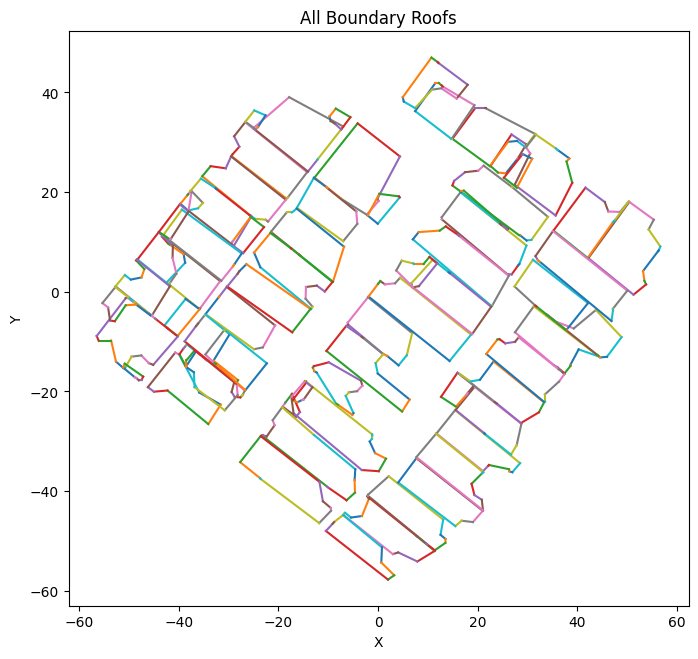

In [20]:
fig, ax = plt.subplots(figsize=(8, 8))
cmap = cm.get_cmap("tab10")
color_i = 0

for i, persil in enumerate(boundaryroof):
    for j, seg_list in enumerate(persil):
        if seg_list is None:
            continue

        for seg in seg_list:
            if not isinstance(seg, LineString):
                continue

            x, y = seg.xy
            color = cmap((color_i % 10) / 10)
            ax.plot(x, y, linewidth=1.5, color=color)
            color_i += 1

ax.set_aspect("equal", adjustable="box")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_title("All Boundary Roofs")
plt.show()

In [21]:
boundaryroof

[[[<LINESTRING (-18.266 18.756, -18.468 18.756)>,
   <LINESTRING (-18.468 18.756, -29.407 27.205)>,
   <LINESTRING (-29.407 27.205, -29.205 27.541)>,
   <LINESTRING (-29.205 27.541, -27.825 29.089)>,
   <LINESTRING (-27.825 29.089, -28.869 31.176)>,
   <LINESTRING (-28.869 31.176, -26.647 34.004)>,
   <LINESTRING (-26.647 34.004, -14.227 23.973)>,
   <LINESTRING (-14.227 23.973, -18.064 18.958)>,
   <LINESTRING (-18.064 18.958, -18.266 18.756)>]],
 [[<LINESTRING (-8.371 -22.508, -12.309 -16.214)>,
   <LINESTRING (-12.309 -16.214, -12.78 -15.945)>,
   <LINESTRING (-12.78 -15.945, -13.083 -15.238)>,
   <LINESTRING (-13.083 -15.238, -12.881 -14.935)>,
   <LINESTRING (-12.881 -14.935, -9.886 -14.161)>,
   <LINESTRING (-9.886 -14.161, -3.423 -17.863)>,
   <LINESTRING (-3.423 -17.863, -3.154 -18.839)>,
   <LINESTRING (-3.154 -18.839, -4.197 -19.95)>,
   <LINESTRING (-4.197 -19.95, -5.847 -20.186)>,
   <LINESTRING (-5.847 -20.186, -6.486 -20.893)>,
   <LINESTRING (-6.486 -20.893, -4.938 -24.3

selesaikan overlap gap dan poligon dalam poligon

In [22]:
from __future__ import annotations

import math
from shapely.geometry import LineString, MultiLineString, Polygon
from shapely.ops import unary_union, polygonize_full, snap, nearest_points
from shapely.validation import make_valid


def clean_boundaryroof_polygon_first_topology(
    boundaryroof_i,
    l_zmax_i,
    *,
    gap_tol=0.5,
    snap_tol=0.5,
    min_area=0.0,
    skip_if_single_polygon=True,
    nested_eps=0.02,
    include_holes=False,
    dissolve_area_tol=3,   # keep untuk kompatibilitas (belum dipakai)
    eps=1e-6,
    remove_collinear=True,
    debug=False,
    spike_angle_deg=1.0,   # <<< NEW: buang vertex jika sudut dalam < ini (derajat)
    spike_max_iter=20,     # <<< tetap: batas iterasi pembersihan spike
    z_eps=1e-9,            # <<< pembeda atap "tertinggi"
):
    """
    INPUT:
      boundaryroof_i[j][k] = LineString segmen pembentuk atap j (dalam 1 persil i)
      l_zmax_i[j]          = tinggi atap j (dalam 1 persil i)

    OUTPUT:
      out[j][k] = LineString segmen-segmen hasil modifikasi yang membentuk polygon atap j
                 (struktur nested sama seperti boundaryroof_i)
    """

    def _is_collinear(a, b, c, tol=1e-12):
        return abs((b[0]-a[0])*(c[1]-a[1]) - (b[1]-a[1])*(c[0]-a[0])) <= tol

    def _filter_zero_length_segments(segs, tol=1e-9):
        out = []
        for ls in segs:
            if ls is None or ls.is_empty:
                continue
            if ls.length <= tol:
                continue
            coords = list(ls.coords)
            if len(coords) < 2:
                continue
            out.append(ls)
        return out

    def _clean_ring_coords(coords):
        """Hapus duplikat beruntun + (opsional) hapus collinear; pastikan closed."""
        if not coords:
            return coords

        pts = [tuple(p) for p in coords]

        dedup = [pts[0]]
        for p in pts[1:]:
            if (abs(p[0]-dedup[-1][0]) > eps) or (abs(p[1]-dedup[-1][1]) > eps):
                dedup.append(p)

        if (abs(dedup[0][0]-dedup[-1][0]) > eps) or (abs(dedup[0][1]-dedup[-1][1]) > eps):
            dedup.append(dedup[0])

        if len(dedup) < 4:
            return dedup

        if not remove_collinear:
            return dedup

        cleaned = [dedup[0]]
        for i in range(1, len(dedup) - 1):
            a = cleaned[-1]
            b = dedup[i]
            c = dedup[i + 1]
            if _is_collinear(a, b, c):
                continue
            cleaned.append(b)
        cleaned.append(dedup[-1])

        if len(cleaned) < 4:
            return dedup
        if cleaned[0] != cleaned[-1]:
            cleaned.append(cleaned[0])

        return cleaned

    def _extract_polygons(geom):
        """Ambil semua Polygon dari Polygon/MultiPolygon/GeometryCollection."""
        if geom is None or geom.is_empty:
            return []
        gt = geom.geom_type
        if gt == "Polygon":
            return [geom]
        if gt == "MultiPolygon":
            return list(geom.geoms)
        if hasattr(geom, "geoms"):
            return [g for g in geom.geoms if g.geom_type == "Polygon"]
        return []

    # -----------------------------
    # NEW: spike remover by angle
    # -----------------------------
    def _interior_angle_deg(A, B, C):
        """
        Sudut dalam di vertex B untuk polyline A-B-C dalam derajat (0..180).
        Untuk spike, yang kita buang adalah sudut yang sangat kecil (mendekati 0).
        """
        bax = A[0] - B[0]
        bay = A[1] - B[1]
        bcx = C[0] - B[0]
        bcy = C[1] - B[1]

        norm_ba = math.hypot(bax, bay)
        norm_bc = math.hypot(bcx, bcy)
        if norm_ba <= 1e-15 or norm_bc <= 1e-15:
            return 0.0  # degenerate -> dianggap spike

        dot = bax * bcx + bay * bcy
        cosang = dot / (norm_ba * norm_bc)

        # clamp untuk stabilitas numerik
        cosang = max(-1.0, min(1.0, cosang))
        ang = math.degrees(math.acos(cosang))
        return ang

    def _remove_spike_vertices_ring_by_angle(ring, angle_deg=1.0, max_iter=20):
        """
        Hapus vertex B jika sudut dalam di B < angle_deg.
        Iteratif sampai stabil atau max_iter tercapai.
        """
        if not ring or len(ring) < 5:
            return ring

        pts = [tuple(p) for p in ring]
        if pts[0] != pts[-1]:
            pts.append(pts[0])

        it = 0
        changed = True
        while changed and it < max_iter and len(pts) >= 5:
            it += 1
            changed = False

            new_pts = [pts[0]]
            for i in range(1, len(pts) - 1):
                A = new_pts[-1]
                B = pts[i]
                C = pts[i + 1]

                ang = _interior_angle_deg(A, B, C)

                if ang < angle_deg:
                    changed = True
                    continue  # buang B

                new_pts.append(B)

            new_pts.append(new_pts[0])  # close
            pts = new_pts

        if pts[0] != pts[-1]:
            pts.append(pts[0])
        return pts

    def _postprocess_polygon(poly: Polygon, *, do_spike_remove: bool):
        if poly is None or poly.is_empty:
            return Polygon()

        p = poly.buffer(0)
        if p.is_empty:
            return Polygon()

        if p.geom_type != "Polygon":
            cand = _extract_polygons(p)
            if not cand:
                return Polygon()
            p = max(cand, key=lambda g: g.area).buffer(0)

        if not include_holes:
            p = Polygon(p.exterior)

        ring = _clean_ring_coords(list(p.exterior.coords))
        if do_spike_remove:
            ring = _remove_spike_vertices_ring_by_angle(
                ring,
                angle_deg=float(spike_angle_deg),
                max_iter=int(spike_max_iter),
            )

        if len(ring) < 4:
            return Polygon()

        p2 = Polygon(ring).buffer(0)
        if p2.is_empty:
            return Polygon()

        if p2.geom_type != "Polygon":
            cand = _extract_polygons(p2)
            if not cand:
                return Polygon()
            p2 = max(cand, key=lambda g: g.area).buffer(0)

        if not include_holes and (not p2.is_empty):
            p2 = Polygon(p2.exterior)

        return p2

    def _polygon_to_segments(poly: Polygon, *, do_spike_remove: bool):
        if poly.is_empty:
            return []

        poly = _postprocess_polygon(poly, do_spike_remove=do_spike_remove)
        if poly.is_empty:
            return []

        ring = _clean_ring_coords(list(poly.exterior.coords))
        if do_spike_remove:
            ring = _remove_spike_vertices_ring_by_angle(
                ring,
                angle_deg=float(spike_angle_deg),
                max_iter=int(spike_max_iter),
            )

        if len(ring) < 4:
            return []

        segs = [LineString([ring[t], ring[t + 1]]) for t in range(len(ring) - 1)]
        segs = _filter_zero_length_segments(segs, tol=max(1e-9, eps))
        return segs

    def _roof_lines_to_polygon(roof_lines) -> Polygon:
        if not roof_lines:
            return Polygon()

        lines = [ls for ls in roof_lines if (ls is not None) and (not ls.is_empty)]
        if not lines:
            return Polygon()

        ml = MultiLineString(lines)

        base = unary_union(ml)
        snapped = snap(base, base, nested_eps)
        noded = unary_union(snapped)

        polys, dangles, cuts, invalids = polygonize_full(noded)
        poly_list = _extract_polygons(polys)

        if not poly_list:
            noded2 = unary_union(noded)
            polys2, *_ = polygonize_full(noded2)
            poly_list = _extract_polygons(polys2)

        if debug:
            try:
                print(
                    "poly_count=", len(poly_list),
                    "polys_type=", polys.geom_type,
                    "dangles_empty=", getattr(dangles, "is_empty", None),
                    "cuts_empty=", getattr(cuts, "is_empty", None),
                    "invalids_empty=", getattr(invalids, "is_empty", None),
                )
            except Exception:
                pass

        if not poly_list:
            return Polygon()

        p = max(poly_list, key=lambda g: g.area).buffer(0)

        if (not p.is_empty) and (not p.is_valid):
            try:
                p2 = make_valid(p)
                cand = _extract_polygons(p2)
                if cand:
                    p = max(cand, key=lambda g: g.area).buffer(0)
            except Exception:
                pass

        if p.is_empty:
            return Polygon()

        if not include_holes:
            p = Polygon(p.exterior)

        if (min_area is not None) and (p.area < float(min_area)):
            return Polygon()

        ring = _clean_ring_coords(list(p.exterior.coords))
        if len(ring) < 4:
            return Polygon()

        return Polygon(ring).buffer(0)

    def _fix_topology_one_parcel(roof_polys, zvals):
        out = [p.buffer(0) for p in roof_polys]
        order = sorted(range(len(out)), key=lambda j: zvals[j], reverse=True)

        for a, j_hi in enumerate(order):
            H = out[j_hi]
            if H.is_empty:
                continue

            for j_lo in order[a + 1 :]:
                L = out[j_lo]
                if L.is_empty:
                    continue

                # 1) OVERLAP
                inter = L.intersection(H)
                if (not inter.is_empty) and (inter.area > eps):
                    tiny = max(1e-9, eps)
                    L2 = L.difference(H.buffer(tiny)).buffer(0)

                    cand = _extract_polygons(L2) if hasattr(L2, "geom_type") else []
                    if cand:
                        L2 = max(cand, key=lambda g: g.area).buffer(0)

                    if not include_holes and (not L2.is_empty):
                        L2 = Polygon(L2.exterior)

                    out[j_lo] = L2
                    L = L2

                if L.is_empty:
                    continue

                # 2) GAP kecil
                d = L.distance(H)
                if eps < d <= gap_tol:
                    Ls = snap(L, H, snap_tol).buffer(0)

                    d2 = Ls.distance(H)
                    if eps < d2 <= gap_tol:
                        pL, pH = nearest_points(Ls.boundary, H.boundary)
                        Ls = Ls.union(LineString([pL, pH]).buffer(max(1e-9, eps))).buffer(0)

                    cand = _extract_polygons(Ls) if hasattr(Ls, "geom_type") else []
                    if cand:
                        Ls = max(cand, key=lambda g: g.area).buffer(0)

                    if not include_holes and (not Ls.is_empty):
                        Ls = Polygon(Ls.exterior)

                    out[j_lo] = Ls

        return out

    # validation
    if len(boundaryroof_i) != len(l_zmax_i):
        raise ValueError(
            f"Mismatch jumlah atap: len(boundaryroof_i)={len(boundaryroof_i)} "
            f"!= len(l_zmax_i)={len(l_zmax_i)}"
        )

    # 1) segmen -> polygon per atap
    roof_polys = [_roof_lines_to_polygon(boundaryroof_i[j]) for j in range(len(boundaryroof_i))]

    # skip jika cuma 1 polygon non-empty
    if skip_if_single_polygon:
        non_empty = [p for p in roof_polys if (not p.is_empty) and (p.area > eps)]
        if len(non_empty) <= 1:
            out = [_polygon_to_segments(p, do_spike_remove=False) for p in roof_polys]
            out = [[ls for ls in segs if (ls is not None and (not ls.is_empty) and ls.length > max(1e-9, eps))]
                   for segs in out]
            return out

    # 2) fix topologi antar atap pakai l_zmax
    if len(roof_polys) > 1:
        roof_polys = _fix_topology_one_parcel(roof_polys, l_zmax_i)

    # 3) postprocess: spike removal ONLY untuk atap rendah
    zmax = max(l_zmax_i) if l_zmax_i else 0.0
    do_spike = [(z < (zmax - z_eps)) for z in l_zmax_i]

    roof_polys = [_postprocess_polygon(p, do_spike_remove=do_spike[j]) for j, p in enumerate(roof_polys)]

    # 4) polygon -> segmen nested sama + filter segmen nol-panjang
    out = [_polygon_to_segments(p, do_spike_remove=do_spike[j]) for j, p in enumerate(roof_polys)]
    out = [[ls for ls in segs if (ls is not None and (not ls.is_empty) and ls.length > max(1e-9, eps))]
           for segs in out]
    return out

In [23]:
boundaryroof_clean_all = []

for i in range(len(boundaryroof)):
    cleaned_i = clean_boundaryroof_polygon_first_topology(
        boundaryroof_i=boundaryroof[i],
        l_zmax_i=l_zmax[i],
        gap_tol=1,
        min_area=0.0,
        spike_angle_deg=1.0,   # <<< sudut spike (derajat)
        spike_max_iter=5       # <<< batas iterasi (opsional, tapi disarankan)
    )
    boundaryroof_clean_all.append(cleaned_i)

In [24]:
boundaryroof_clean_all

[[[<LINESTRING (-18.266 18.756, -18.468 18.756)>,
   <LINESTRING (-18.468 18.756, -29.407 27.205)>,
   <LINESTRING (-29.407 27.205, -29.205 27.541)>,
   <LINESTRING (-29.205 27.541, -27.825 29.089)>,
   <LINESTRING (-27.825 29.089, -28.869 31.176)>,
   <LINESTRING (-28.869 31.176, -26.647 34.004)>,
   <LINESTRING (-26.647 34.004, -14.227 23.973)>,
   <LINESTRING (-14.227 23.973, -18.064 18.958)>,
   <LINESTRING (-18.064 18.958, -18.266 18.756)>]],
 [[<LINESTRING (-8.371 -22.508, -12.309 -16.214)>,
   <LINESTRING (-12.309 -16.214, -12.78 -15.945)>,
   <LINESTRING (-12.78 -15.945, -13.083 -15.238)>,
   <LINESTRING (-13.083 -15.238, -12.881 -14.935)>,
   <LINESTRING (-12.881 -14.935, -9.886 -14.161)>,
   <LINESTRING (-9.886 -14.161, -3.423 -17.863)>,
   <LINESTRING (-3.423 -17.863, -3.154 -18.839)>,
   <LINESTRING (-3.154 -18.839, -4.197 -19.95)>,
   <LINESTRING (-4.197 -19.95, -5.847 -20.186)>,
   <LINESTRING (-5.847 -20.186, -6.486 -20.893)>,
   <LINESTRING (-6.486 -20.893, -4.938 -24.3

In [25]:
import matplotlib.pyplot as plt
from shapely.geometry import LineString, MultiLineString, Polygon, Point
from shapely.ops import unary_union, polygonize, polygonize_full
from shapely.validation import make_valid


def _extract_polygons(geom):
    if geom is None or geom.is_empty:
        return []
    gt = geom.geom_type
    if gt == "Polygon":
        return [geom]
    if gt == "MultiPolygon":
        return list(geom.geoms)
    if hasattr(geom, "geoms"):
        return [g for g in geom.geoms if g.geom_type == "Polygon"]
    return []


def _poly_from_old_segments(roof_lines):
    """Polygon OLD dari boundaryroof[i][j] (segmen LineString)."""
    if not roof_lines:
        return Polygon()

    ml = MultiLineString([ls for ls in roof_lines if (ls is not None and (not ls.is_empty))])
    merged = unary_union(ml)

    polys = list(polygonize(merged))
    if not polys:
        pfull, *_ = polygonize_full(merged)
        polys = _extract_polygons(pfull)

    if not polys:
        return Polygon()

    p = max(polys, key=lambda g: g.area).buffer(0)
    if (not p.is_empty) and (not p.is_valid):
        try:
            mv = make_valid(p)
            cand = _extract_polygons(mv)
            if cand:
                p = max(cand, key=lambda g: g.area).buffer(0)
        except Exception:
            pass

    if p.geom_type != "Polygon":
        cand = _extract_polygons(p)
        p = max(cand, key=lambda g: g.area) if cand else Polygon()

    return p


def _poly_from_new_segments_chain(roof_segs, eps=1e-9):
    """
    Polygon NEW dari boundaryroof_clean_all[i][j] (segmen).
    Asumsi segmen-segmen sudah mewakili boundary ring (umumnya sudah).
    """
    if not roof_segs:
        return Polygon()

    segs = [ls for ls in roof_segs if (ls is not None and (not ls.is_empty) and ls.length > eps)]
    if not segs:
        return Polygon()

    coords = [segs[0].coords[0]]
    for ls in segs:
        coords.append(ls.coords[-1])

    # close
    if abs(coords[0][0]-coords[-1][0]) > eps or abs(coords[0][1]-coords[-1][1]) > eps:
        coords.append(coords[0])

    if len(coords) < 4:
        return Polygon()

    p = Polygon(coords).buffer(0)
    if p.geom_type != "Polygon":
        cand = _extract_polygons(p)
        p = max(cand, key=lambda g: g.area) if cand else Polygon()
    return p


def visualize_old_new_with_vertex_changes(
    boundaryroof,
    boundaryroof_clean_all,
    ipersil: int,
    iroof: int,
    *,
    match_tol=0.20,   # toleransi jarak untuk menganggap "vertex sama" (sesuaikan skala data)
    move_tol=1e-6,    # di atas ini dianggap "pindah"
    show_removed=True,
    figsize=(8, 8)
):
    """
    - match_tol: vertex OLD dianggap match ke vertex NEW jika jaraknya <= match_tol
    - moved: vertex OLD match, tapi jarak > move_tol
    - added: vertex NEW tidak match ke vertex OLD manapun
    - removed/merged: vertex OLD tidak match ke vertex NEW manapun
    """

    # --- build polygons ---
    poly_old = _poly_from_old_segments(boundaryroof[ipersil][iroof])
    poly_new = _poly_from_new_segments_chain(boundaryroof_clean_all[ipersil][iroof])

    fig, ax = plt.subplots(figsize=figsize)

    # --- plot polygons ---
    if not poly_old.is_empty:
        xo, yo = poly_old.exterior.xy
        ax.plot(xo, yo, linestyle="--", linewidth=2, label="OLD polygon")
    else:
        ax.text(0.02, 0.98, "OLD polygon EMPTY", transform=ax.transAxes, va="top")

    if not poly_new.is_empty:
        xn, yn = poly_new.exterior.xy
        ax.plot(xn, yn, linestyle="-", linewidth=2, label="NEW polygon")
    else:
        ax.text(0.02, 0.94, "NEW polygon EMPTY", transform=ax.transAxes, va="top")

    # --- get vertices (drop closing point) ---
    old_pts = []
    if not poly_old.is_empty:
        c = list(poly_old.exterior.coords)
        old_pts = c[:-1] if len(c) >= 2 else []

    new_pts = []
    if not poly_new.is_empty:
        c = list(poly_new.exterior.coords)
        new_pts = c[:-1] if len(c) >= 2 else []

    # --- match OLD -> NEW by nearest NEW vertex ---
    # greedy nearest neighbor matching
    new_unused = set(range(len(new_pts)))
    old_to_new = {}   # old_idx -> new_idx

    for oi, (ox, oy) in enumerate(old_pts):
        best_j = None
        best_d2 = float("inf")
        for nj in list(new_unused):
            nx, ny = new_pts[nj]
            d2 = (nx-ox)*(nx-ox) + (ny-oy)*(ny-oy)
            if d2 < best_d2:
                best_d2 = d2
                best_j = nj
        if best_j is not None and (best_d2 ** 0.5) <= match_tol:
            old_to_new[oi] = best_j
            new_unused.remove(best_j)

    moved = []      # (old_idx, new_idx, dist)
    unchanged = []  # (old_idx, new_idx)
    removed = []    # old_idx (no match)

    for oi, (ox, oy) in enumerate(old_pts):
        if oi not in old_to_new:
            removed.append(oi)
            continue
        nj = old_to_new[oi]
        nx, ny = new_pts[nj]
        dist = ((nx-ox)**2 + (ny-oy)**2) ** 0.5
        if dist > move_tol:
            moved.append((oi, nj, dist))
        else:
            unchanged.append((oi, nj))

    added = list(new_unused)  # new vertex yang tidak match ke old vertex

    # --- plot OLD vertices (semua) ---
    if old_pts:
        oxs = [p[0] for p in old_pts]
        oys = [p[1] for p in old_pts]
        ax.scatter(oxs, oys, s=30, label="OLD vertices")
        for oi, (x, y) in enumerate(old_pts):
            ax.text(x, y, f"O{oi}", fontsize=8, va="bottom", ha="left")

    # --- plot moved vertices (posisi NEW untuk vertex lama yang pindah) + garis penghubung ---
    if moved:
        mxs, mys = [], []
        for k, (oi, nj, dist) in enumerate(moved):
            ox, oy = old_pts[oi]
            nx, ny = new_pts[nj]
            mxs.append(nx); mys.append(ny)

            # garis dari OLD -> NEW
            ax.plot([ox, nx], [oy, ny], linewidth=1)

            ax.text(nx, ny, f"M{k}", fontsize=9, va="top", ha="right")
        ax.scatter(mxs, mys, s=50, marker="x", label="MOVED (new pos of old vertex)")

    # --- plot added vertices (vertex baru) ---
    if added:
        axs, ays = [], []
        for k, nj in enumerate(added):
            x, y = new_pts[nj]
            axs.append(x); ays.append(y)
            ax.text(x, y, f"A{k}", fontsize=9, va="bottom", ha="right")
        ax.scatter(axs, ays, s=45, marker="^", label="ADDED vertices")

    # --- plot removed vertices (opsional) ---
    if show_removed and removed:
        rxs, rys = [], []
        for k, oi in enumerate(removed):
            x, y = old_pts[oi]
            rxs.append(x); rys.append(y)
            ax.text(x, y, f"R{k}", fontsize=9, va="top", ha="left")
        ax.scatter(rxs, rys, s=45, marker="s", label="REMOVED/MERGED old vertices")

    ax.set_aspect("equal", adjustable="box")
    ax.grid(True, linewidth=0.5, alpha=0.5)
    ax.legend(loc="best")
    ax.set_title(f"Persil {ipersil}, Roof {iroof} — OLD vs NEW + vertex changes\n"
                 f"(match_tol={match_tol})")
    plt.show()

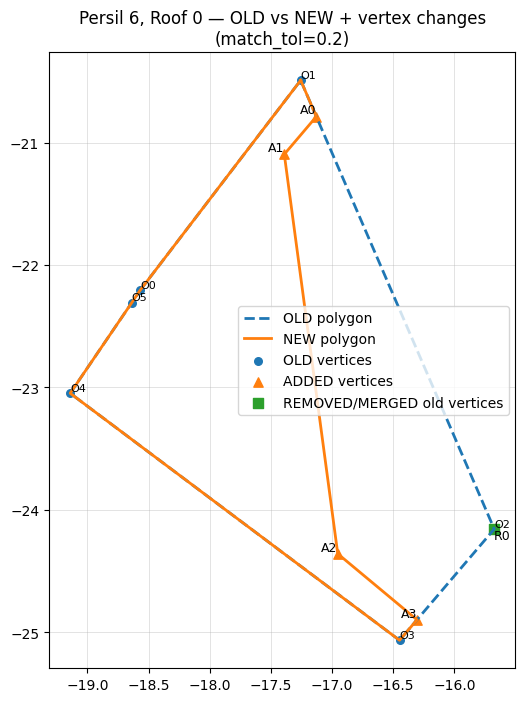

In [26]:
# ====== PEMANGGILAN (ubah i & j di sini) ======
ipersil = 6
iroof = 0
visualize_old_new_with_vertex_changes(boundaryroof, boundaryroof_clean_all, ipersil, iroof, match_tol=0.20)

C:\Users\asus\AppData\Local\Temp\ipykernel_2180\854012144.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("tab10")


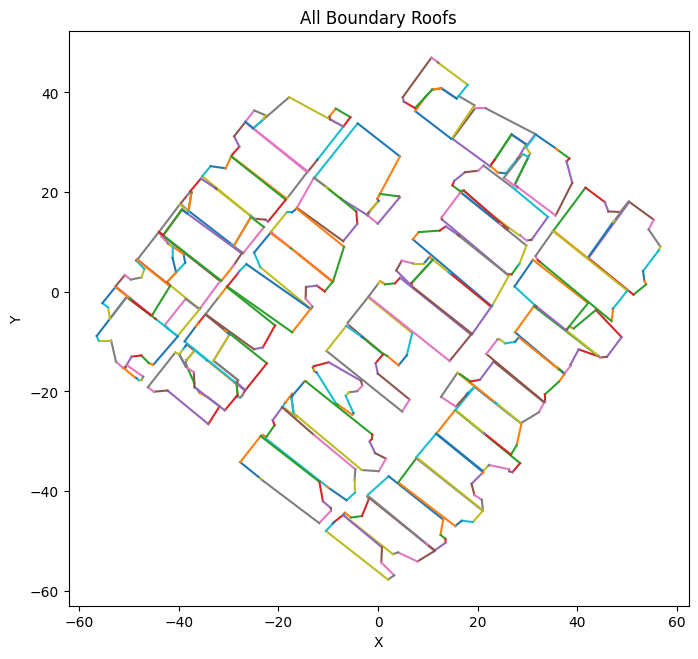

In [27]:
fig, ax = plt.subplots(figsize=(8, 8))
cmap = cm.get_cmap("tab10")
color_i = 0

for i, persil in enumerate(boundaryroof_clean_all):
    for j, seg_list in enumerate(persil):
        if seg_list is None:
            continue

        for seg in seg_list:
            if not isinstance(seg, LineString):
                continue

            x, y = seg.xy
            color = cmap((color_i % 10) / 10)
            ax.plot(x, y, linewidth=1.5, color=color)
            color_i += 1

ax.set_aspect("equal", adjustable="box")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_title("All Boundary Roofs")
plt.show()

ubah format menjadi titik-titik poligon

In [28]:
from shapely.geometry import LineString

def _is_close_xy(a, b, tol=1e-6):
    return abs(a[0] - b[0]) <= tol and abs(a[1] - b[1]) <= tol

def boundaryroof_to_all_polygons_vertices(boundaryroof_clean_all, tol=1e-6, drop_closing=True):
    """
    Input:
      boundaryroof_clean_all[persil][atap] -> list of LineString (sudah berurutan)
    Output:
      all_polygons_vertices[persil][atap] -> list of (x,y) vertex (urut)
    """
    all_polygons_vertices = []

    for persil in boundaryroof_clean_all:
        persil_vertices = []

        for roof_lines in persil:
            # roof_lines = list(LineString)
            lines = [ln for ln in roof_lines if isinstance(ln, LineString) and len(ln.coords) >= 2]

            if not lines:
                persil_vertices.append([])
                continue

            vertices = []

            # titik awal segmen pertama
            first_start = tuple(lines[0].coords[0])
            vertices.append(first_start)

            # titik akhir setiap segmen (pakai coords[-1], bukan coords[1])
            for ln in lines:
                vertices.append(tuple(ln.coords[-1]))

            # hilangkan duplicate berurutan (misal ada segmen nol panjang)
            cleaned = [vertices[0]]
            for p in vertices[1:]:
                if not _is_close_xy(p, cleaned[-1], tol=tol):
                    cleaned.append(p)

            # opsional: buang titik penutup kalau sama dengan titik awal
            if drop_closing and len(cleaned) >= 2 and _is_close_xy(cleaned[0], cleaned[-1], tol=tol):
                cleaned = cleaned[:-1]

            persil_vertices.append(cleaned)

        all_polygons_vertices.append(persil_vertices)

    return all_polygons_vertices

In [29]:
all_polygons_vertices = boundaryroof_to_all_polygons_vertices(boundaryroof_clean_all, tol=1e-6)

In [30]:
all_polygons_vertices

[[[(-18.265547112212516, 18.755603978410363),
   (-18.46754711214453, 18.755603978410363),
   (-29.406546112149954, 27.204604977741838),
   (-29.20454611221794, 27.540603978559375),
   (-27.82454511220567, 29.088603977113962),
   (-28.868548112222925, 31.175601977854967),
   (-26.64654811215587, 34.00360497832298),
   (-14.226546112215146, 23.972602978348732),
   (-18.063547112164088, 18.95760397799313)]],
 [[(-8.37054711219389, -22.50839602202177),
   (-12.308546112151816, -16.21439602226019),
   (-12.779547112178989, -15.945396022871137),
   (-13.082545112236403, -15.238396022468805),
   (-12.880545112187974, -14.935396021232009),
   (-9.885546112200245, -14.161396022886038),
   (-3.4225491122342646, -17.863396022468805),
   (-3.153544112225063, -18.83939602226019),
   (-4.196543112164363, -19.950396021828055),
   (-5.846545112202875, -20.18639602139592),
   (-6.485544112161733, -20.893396021798253),
   (-4.93754811224062, -24.359396021813154),
   (-5.139544112142175, -24.69639602117

In [31]:
import numpy as np
from rasterio.windows import Window

def sample_dtm_z(dataset, x, y, xtrans, ytrans, ztrans, max_ring_px=6):
    """
    Sample DTM pada (x,y) dengan translasi world xtrans/ytrans dan koreksi ztrans.
    Jika titik utama invalid/NoData, cari nilai valid terdekat via ring search.
    Return: z_local (float) atau None.
    """

    # Terapkan translasi SEKALI di sini
    xs = x + xtrans
    ys = y + ytrans

    nodata = dataset.nodata
    height, width = dataset.height, dataset.width

    def _is_valid(val):
        if val is None:
            return False
        # masked?
        try:
            if np.ma.is_masked(val):
                return False
        except Exception:
            pass
        # nan?
        try:
            if np.isnan(val):
                return False
        except Exception:
            pass
        # nodata?
        if nodata is not None:
            try:
                if np.isclose(val, nodata):
                    return False
            except Exception:
                if val == nodata:
                    return False
        return True

    # 1) Coba sample tepat di koordinat (xs, ys)
    try:
        v0 = next(dataset.sample([(xs, ys)]))[0]
        if _is_valid(v0):
            return float(v0) - ztrans
    except Exception:
        pass

    # 2) Dapatkan index pixel dari koordinat yang sama (xs, ys)
    try:
        row0, col0 = dataset.index(xs, ys)
    except Exception:
        return None

    best = None
    best_d2 = None

    # 3) Ring search
    for r in range(1, int(max_ring_px) + 1):
        rmin, rmax = row0 - r, row0 + r
        cmin, cmax = col0 - r, col0 + r

        # top & bottom
        for cc in range(cmin, cmax + 1):
            for rr in (rmin, rmax):
                if rr < 0 or rr >= height or cc < 0 or cc >= width:
                    continue
                try:
                    val = dataset.read(1, window=Window(cc, rr, 1, 1), masked=True)[0, 0]
                except Exception:
                    continue
                if not _is_valid(val):
                    continue
                d2 = (rr - row0) ** 2 + (cc - col0) ** 2
                if best is None or d2 < best_d2:
                    best = float(val)
                    best_d2 = d2

        # left & right (tanpa corner biar ga dobel)
        for rr in range(rmin + 1, rmax):
            for cc in (cmin, cmax):
                if rr < 0 or rr >= height or cc < 0 or cc >= width:
                    continue
                try:
                    val = dataset.read(1, window=Window(cc, rr, 1, 1), masked=True)[0, 0]
                except Exception:
                    continue
                if not _is_valid(val):
                    continue
                d2 = (rr - row0) ** 2 + (cc - col0) ** 2
                if best is None or d2 < best_d2:
                    best = float(val)
                    best_d2 = d2

        if best is not None:
            return best - ztrans

    return None

## 3. Pengolahan Fasad

a. membuat line fasad

In [32]:
def build_fasad_lines_from_vertices(
    vertices_xy_local,
    zroof_max,
    dataset,
    xtrans, ytrans, ztrans,
    tol_xy=1e-6,
    drop_closing=True
):
    z_top = float(zroof_max)

    # opsional: buang titik terakhir kalau sama dengan titik awal (ring closing)
    verts = list(vertices_xy_local)
    if drop_closing and len(verts) >= 2:
        x0, y0 = verts[0]
        xN, yN = verts[-1]
        if abs(x0 - xN) <= tol_xy and abs(y0 - yN) <= tol_xy:
            verts = verts[:-1]

    fasad_lines = []
    for k, (xl, yl) in enumerate(verts):
        z_bottom = sample_dtm_z(dataset, xl, yl, xtrans, ytrans, ztrans)
        if z_bottom is None:
            # kalau kamu butuh poligon 3D utuh, lebih baik JANGAN skip,
            # tapi ini mengikuti prinsip kamu sebelumnya (skip kalau gagal).
            continue

        z_bottom = float(z_bottom)

        p0 = np.array([xl, yl, z_bottom], dtype=float)
        p1 = np.array([xl, yl, z_top], dtype=float)
        v  = p1 - p0

        fasad_lines.append({
            "id": k,
            "xy_local": (float(xl), float(yl)),
            "z_bottom": z_bottom,
            "z_top": z_top,
            "p0": p0,
            "p1": p1,
            "line_eq": {
                "type": "parametric_3d",
                "p0": p0,
                "v": v,
                "t_range": (0.0, 1.0),
            }
        })

    return fasad_lines

In [33]:
l_facadelines = []

for ip, persil_vertices in enumerate(all_polygons_vertices):
    persil_fasad = []

    for ir, roof_vertices in enumerate(persil_vertices):
        z_top = l_zmax[ip][ir]  # pastikan struktur l_zmax sama: [persil][atap]
        fasad = build_fasad_lines_from_vertices(
            vertices_xy_local=roof_vertices,
            zroof_max=z_top,
            dataset=dataset,
            xtrans=x0, ytrans=y0, ztrans=z0,
            tol_xy=1e-6,
            drop_closing=True
        )
        persil_fasad.append(fasad)

    l_facadelines.append(persil_fasad)

## 4. Pengolahan Perpotongan Atap

a. Membuat komponen atap dari RG

In [ ]:
# Define a function to calculate normals and curves of point cloud
def normalsEstimation(pointcloud, nn_global, VP=[0,0,0]):
    ViewPoint = np.array(VP)
    normals = np.empty((np.shape(pointcloud)))
    curv = np.empty((len(pointcloud),1))
    for index in range(len(pointcloud)):
        nn_loc = pointcloud[nn_global[index]]
        COV = np.cov(nn_loc,rowvar=False)
        eigval, eigvec = np.linalg.eig(COV)
        idx = np.argsort(eigval)
        nor = eigvec[:,idx][:,0]
        if nor.dot((ViewPoint-pointcloud[index,:])) > 0:
            normals[index] = nor
        else:
            normals[index] = - nor
        curv[index] = eigval[idx][0] / np.sum(eigval)
    return normals, curv

# Define a region growing function
def regionGrowing(pointcloud, nn_glob, VPin, theta_th = 'auto', cur_th = 'auto'):
    print('Starting region growing')
    start = time.time()
    normals, curvature = normalsEstimation(pointcloud,nn_global=nn_glob, VP=VPin)
    order = curvature[:,0].argsort().tolist() 
    region = []
    if theta_th == 'auto':
        theta_th = 15.0 / 180.0 * math.pi 
    if cur_th == 'auto':
        cur_th = np.percentile(curvature, 90)
        print(cur_th)
    while len(order) > 0:
        region_cur = []
        seed_cur = [] 
        poi_min = order[0] 
        region_cur.append(poi_min) 
        seedval = 0
        seed_cur.append(poi_min)
        order.remove(poi_min) 
        while seedval < len(seed_cur): 
            nn_loc = nn_glob[seed_cur[seedval]] 
            for j in range(len(nn_loc)):
                nn_cur = nn_loc[j]
                if all([nn_cur in order, np.arccos(np.abs(np.dot(normals[seed_cur[seedval]],normals[nn_cur])))<theta_th]):
                    region_cur.append(nn_cur)
                    order.remove(nn_cur)
                    if curvature[nn_cur] < cur_th:
                        seed_cur.append(nn_cur)
            seedval+=1
        if len(region_cur) > 100:
            region.append(region_cur)
            print('Region {}, point cloud count {}'.format((len(region)-1), len(region_cur)))
    end = time.time()
    MinutesTook = (end-start)/60
    print('Region growing finished, took: {} minutes'.format(MinutesTook))
    return region

In [ ]:
l_roofcomp = []
for lpcd in pcdRG1:
    roofcomp = []
    for pcds in lpcd:
        tree = KDTree(pcds, leaf_size=2)
        dist, nnInd = tree.query(pcds[:len(pcds)], k=20)
        regionGrew = regionGrowing(pcds, nnInd, VPin=[x0, y0, z0], theta_th = 5.0 / 180.0 * math.pi , cur_th = 'auto')
        comp = []
        for region in regionGrew:
            coord = np.zeros((len(region), 3))
            for n, indices in enumerate(region):
                coord[n] = pcds[indices]
            comp.append(coord)
        roofcomp.append(comp)
    l_roofcomp.append(roofcomp)

In [ ]:
l_roofcomp[0][0]

In [ ]:
for i, lll in enumerate (l_roofcomp):
    for j, ll in enumerate (lll):
        for k, ccc in enumerate(ll):
            coordtrans = ccc + [x0,y0,z0]
            pcdply = o3d.geometry.PointCloud()
            pcdply.points = o3d.utility.Vector3dVector(np.asarray(coordtrans))
            filenamereg = ("D:/PENELITIAN/2025/MATCHMAKING/HASIL/RG2_300_50/roofcomp_persil_"+str(i)+"_roof_"+str(j)+"_comp_"+str(k)+".ply")
            o3d.io.write_point_cloud(filenamereg, pcdply)

JIKA SUDAH ADA RG2 ROOF COMPONENT

In [34]:
# =========================================================
# LOAD SEMUA PLY ROOF COMPONENT -> l_roofcomp (LOKAL)
# =========================================================

# GANTI PATH KALAU PERLU
PLY_DIR = r"D:/PENELITIAN/2025/MATCHMAKING/HASIL/RG2_300_50"

# pastikan x0,y0,z0 SUDAH ADA (JANGAN DIUBAH)
# x0 = ...
# y0 = ...
# z0 = ...

pattern = re.compile(
    r"roofcomp_persil_(\d+)_roof_(\d+)_comp_(\d+)\.ply"
)

# penampung sementara
_tmp = defaultdict(lambda: defaultdict(dict))

for fname in os.listdir(PLY_DIR):
    m = pattern.match(fname)
    if m is None:
        continue

    i = int(m.group(1))
    j = int(m.group(2))
    k = int(m.group(3))

    fpath = os.path.join(PLY_DIR, fname)
    pcd = o3d.io.read_point_cloud(fpath)
    pts = np.asarray(pcd.points)

    if pts.size == 0:
        continue

    # BALIK KE KOORDINAT LOKAL
    pts_local = pts - np.array([x0, y0, z0], float)

    _tmp[i][j][k] = pts_local

# susun ke struktur FINAL
l_roofcomp = []

for i in sorted(_tmp.keys()):
    roof_list = []
    for j in sorted(_tmp[i].keys()):
        comp_list = []
        for k in sorted(_tmp[i][j].keys()):
            comp_list.append(_tmp[i][j][k])
        roof_list.append(comp_list)
    l_roofcomp.append(roof_list)

# =========================================================
# QUICK CHECK (AMAN)
# =========================================================
print("LOAD SELESAI")
print("Jumlah persil      :", len(l_roofcomp))
if len(l_roofcomp) > 0:
    print("Roof persil 0      :", len(l_roofcomp[0]))
    if len(l_roofcomp[0]) > 0:
        print("Comp persil0 roof0 :", len(l_roofcomp[0][0]))
        if len(l_roofcomp[0][0]) > 0:
            print("Shape contoh       :", l_roofcomp[0][0][0].shape)


LOAD SELESAI
Jumlah persil      : 44
Roof persil 0      : 1
Comp persil0 roof0 : 5
Shape contoh       : (3529, 3)


In [35]:
import numpy as np
import plotly.graph_objects as go
import plotly.colors as pc
import plotly.io as pio

pio.renderers.default = "vscode"   # kalau masih blank: "browser"

# ===== PILIH INDEX =====
i_sel = 12
j_sel = 0

roof_j = l_roofcomp[i_sel][j_sel]   # <-- INI list of np.array(N,3)

colors = pc.qualitative.Dark24
ncol = len(colors)

fig = go.Figure()
trace_i = 0

for s, G in enumerate(roof_j):
    if G is None:
        continue

    G = np.asarray(G)
    if G.ndim != 2 or G.shape[0] == 0 or G.shape[1] < 3:
        continue

    G = G[:, :3]
    color_s = colors[s % ncol]

    fig.add_trace(go.Scatter3d(
        x=G[:, 0],
        y=G[:, 1],
        z=G[:, 2],
        mode="markers",
        marker=dict(size=2, color=color_s),
        showlegend=False  # legend ribuan item bikin berat
    ))
    trace_i += 1

fig.update_layout(
    scene=dict(xaxis_title="X", yaxis_title="Y", zaxis_title="Z", aspectmode="data"),
    width=900, height=650,
    margin=dict(l=0, r=0, b=0, t=30),
    title=f"i={i_sel}, j={j_sel} | sets plotted={trace_i}"
)

fig.show()
print("Jumlah set diplot:", trace_i)

Jumlah set diplot: 3


b. membuat persamaan bidang roof comp

In [57]:
import numpy as np

def fit_plane_svd(points):
    P = np.asarray(points, dtype=float)
    centroid = P.mean(axis=0)
    Q = P - centroid
    _, _, Vt = np.linalg.svd(Q, full_matrices=False)
    n = Vt[-1]
    n = n / (np.linalg.norm(n) + 1e-15)
    a, b, c = n
    d = -n.dot(centroid)
    return (a, b, c, d), centroid, n

def plane_basis_from_normal(n):
    n = np.asarray(n, dtype=float)
    n = n / (np.linalg.norm(n) + 1e-15)
    ref = np.array([1.0, 0.0, 0.0]) if abs(n[0]) < 0.9 else np.array([0.0, 1.0, 0.0])
    u = np.cross(n, ref); u = u / (np.linalg.norm(u) + 1e-15)
    v = np.cross(n, u);   v = v / (np.linalg.norm(v) + 1e-15)
    return u, v

def project_points_to_plane(P, centroid, n):
    """Project points P ke bidang lewat centroid dengan normal n."""
    Q = P - centroid
    dist = Q @ n                    # signed distance (N,)
    Pp = P - dist[:, None] * n      # projected points
    return Pp, dist

def build_plane_patch(points,
                      pad_ratio=0.15,
                      pad_abs=0.0,
                      project_for_boundary=True,
                      robust_quantile=None):
    """
    robust_quantile:
      - None: pakai min/max asli (mengakomodir semua)
      - mis. (0.01, 0.99): pakai quantile untuk buang outlier ekstrem
    """
    P = np.asarray(points, dtype=float)
    if P.ndim != 2 or P.shape[0] < 3 or P.shape[1] < 3:
        raise ValueError("points harus (N,3) dan N>=3")

    plane, c0, n = fit_plane_svd(P)
    u, v = plane_basis_from_normal(n)

    # proyeksi ke bidang (disarankan untuk bikin boundary yang "mengakomodir")
    if project_for_boundary:
        P_use, dist = project_points_to_plane(P, c0, n)
    else:
        P_use = P
        dist = (P - c0) @ n

    # koordinat uv dari titik yang dipakai
    Q = P_use - c0
    uv = np.column_stack([Q @ u, Q @ v])  # (N,2)

    # PCA di 2D untuk oriented box
    mu = uv.mean(axis=0)
    X = uv - mu
    C = (X.T @ X) / max(len(X) - 1, 1)
    evals, evecs = np.linalg.eigh(C)
    R = evecs[:, np.argsort(evals)[::-1]]

    Xr = X @ R

    if robust_quantile is None:
        xmin, ymin = Xr.min(axis=0)
        xmax, ymax = Xr.max(axis=0)
    else:
        qlo, qhi = robust_quantile
        xmin, ymin = np.quantile(Xr, qlo, axis=0)
        xmax, ymax = np.quantile(Xr, qhi, axis=0)

    # padding: gabungan ratio + absolute
    dx = xmax - xmin
    dy = ymax - ymin
    padx = pad_ratio * dx + pad_abs
    pady = pad_ratio * dy + pad_abs

    xmin -= padx; ymin -= pady
    xmax += padx; ymax += pady

    quad_r = np.array([[xmin, ymin],
                       [xmax, ymin],
                       [xmax, ymax],
                       [xmin, ymax]], dtype=float)

    quad2d = quad_r @ R.T + mu
    quad3d = c0 + quad2d[:, [0]] * u + quad2d[:, [1]] * v

    # untuk debug: seberapa jauh titik asli dari bidang
    dist_abs = np.abs(dist)
    stats = {
        "dist_abs_mean": float(dist_abs.mean()),
        "dist_abs_p95": float(np.quantile(dist_abs, 0.95)),
        "dist_abs_max": float(dist_abs.max()),
    }

    return {
        "plane": plane,
        "centroid": c0,
        "normal": n,
        "u": u,
        "v": v,
        "boundary2d": quad2d,
        "boundary3d": quad3d,
        "n_points": int(P.shape[0]),
        "plane_fit_stats": stats,
        # opsional: simpan projected points biar kalau diplot "nempel" bidang
        "points_proj": P_use,
    }

In [83]:
patches = []
for lroof in l_roofcomp:  # i
    persil_list = []
    for roof in lroof:    # j
        roof_list = []
        for k, group in enumerate(roof):  # k
            G = np.asarray(group, dtype=float)
            roof_list.append(build_plane_patch(
                G,
                pad_ratio=0.10,          # longgar
                pad_abs=0.0,
                project_for_boundary=True,
                robust_quantile=None     # include all
            ))
        persil_list.append(roof_list)
    patches.append(persil_list)

In [84]:
patches_segment = []
for lroof in l_roofcomp:  # i
    persil_list = []
    for roof in lroof:    # j
        roof_list = []
        for k, group in enumerate(roof):  # k
            G = np.asarray(group, dtype=float)
            roof_list.append(build_plane_patch(
                G,
                pad_ratio=0.50,          # longgar
                pad_abs=0.0,
                project_for_boundary=True,
                robust_quantile=None     # include all
            ))
        persil_list.append(roof_list)
    patches_segment.append(persil_list)

In [85]:
import numpy as np
import plotly.graph_objects as go
import plotly.colors as pc

def _stack_group_points(group):
    """Terima array (N,3) atau list-of-array, keluarkan array (M,3) atau None."""
    if group is None:
        return None

    g = np.asarray(group)
    # kasus 1: sudah array (N,3)
    if g.ndim == 2 and g.shape[1] >= 3 and g.shape[0] > 0:
        return g[:, :3].astype(float)

    # kasus 2: list-of-array
    pts = []
    if isinstance(group, (list, tuple)):
        for part in group:
            if part is None:
                continue
            p = np.asarray(part)
            if p.ndim == 2 and p.shape[1] >= 3 and p.shape[0] > 0:
                pts.append(p[:, :3].astype(float))
    if pts:
        return np.vstack(pts)

    return None

def plot_roof_planes_plotly(patches, l_roofcomp, i_sel=0, j_sel=0,
                            show_points=True, point_size=2,
                            show_edges=True, opacity=0.35):
    colors = pc.qualitative.Dark24
    ncol = len(colors)

    roof_patches = patches[i_sel][j_sel]     # list patch per k
    roof_groups  = l_roofcomp[i_sel][j_sel]  # list group per k

    fig = go.Figure()
    n_plane = 0
    n_pts = 0

    # safety: kalau panjang beda, tetap iterasi yang tersedia
    K = min(len(roof_patches), len(roof_groups))

    for k in range(K):
        patch = roof_patches[k]
        if patch is None:
            continue

        # boundary3d
        quad = np.asarray(patch.get("boundary3d", None), dtype=float)
        if quad is None or quad.shape[0] < 3:
            continue

        color_k = colors[k % ncol]

        # kalau boundary kamu quad (4 titik), bikin 2 segitiga
        if quad.shape[0] == 4:
            fig.add_trace(go.Mesh3d(
                x=quad[:, 0], y=quad[:, 1], z=quad[:, 2],
                i=[0, 0], j=[1, 2], k=[2, 3],
                opacity=opacity,
                color=color_k,
                name=f"plane k={k}",
                hovertext=f"i={i_sel}, j={j_sel}, k={k}",
                hoverinfo="text"
            ))
        else:
            # fallback: kalau polygon >4 (kalau nanti kamu ganti boundary)
            fig.add_trace(go.Scatter3d(
                x=quad[:, 0], y=quad[:, 1], z=quad[:, 2],
                mode="lines",
                line=dict(width=6, color=color_k),
                name=f"boundary k={k}",
            ))
        n_plane += 1

        # garis tepi
        if show_edges:
            edge = np.vstack([quad, quad[0]])
            fig.add_trace(go.Scatter3d(
                x=edge[:, 0], y=edge[:, 1], z=edge[:, 2],
                mode="lines",
                line=dict(width=4, color=color_k),
                showlegend=False
            ))

        # titik asli
        if show_points:
            G = _stack_group_points(roof_groups[k])
            if G is not None:
                fig.add_trace(go.Scatter3d(
                    x=G[:, 0], y=G[:, 1], z=G[:, 2],
                    mode="markers",
                    marker=dict(size=point_size, color=color_k),
                    name=f"pts k={k}",
                    showlegend=False
                ))
                n_pts += 1

    fig.update_layout(
        title=f"Bidang komponen dalam 1 atap | persil i={i_sel}, atap j={j_sel}",
        scene=dict(
            xaxis_title="X",
            yaxis_title="Y",
            zaxis_title="Z",
            aspectmode="data"
        ),
        legend_title_text="Komponen (k)",
        width=950,
        height=700,
        margin=dict(l=0, r=0, b=0, t=40)
    )
    fig.show()

    print(f"Komponen terplot bidang: {n_plane} | komponen ada titik: {n_pts} | total komponen dicek: {K}")

In [61]:
plot_roof_planes_plotly(patches, l_roofcomp, i_sel=12, j_sel=0, show_points=True)

Komponen terplot bidang: 3 | komponen ada titik: 3 | total komponen dicek: 3


c. Proses Mesh Atap

membuat perpotongan garis fasad pada bidang atap

In [86]:
import numpy as np
from shapely.geometry import Polygon, Point, LineString

# ============================================================
# 1) Intersect z untuk garis vertikal dengan plane: ax+by+cz+d=0
# ============================================================
def z_intersect_vertical_plane(plane_eq, x, y, eps=1e-12):
    """Menghitung nilai Z pada bidang untuk koordinat X,Y tertentu."""
    a, b, c, d = plane_eq
    if abs(c) < eps:
        return None
    return - (a * x + b * y + d) / c

# ============================================================
# 2) Build polygon XY dengan referensi Segmen/Sisi (Edge)
# ============================================================
def build_roof_polygons_xy_from_patches(roof_patches, eps=0.0):
    """Membangun poligon atap dan menyimpan LineString sisinya untuk fallback."""
    out = []
    for k, patch in enumerate(roof_patches):
        if patch is None: continue
        quad = patch.get("boundary3d", None)
        plane_eq = patch.get("plane", None)
        if plane_eq is None or quad is None: continue

        quad = np.asarray(quad, float)
        if quad.ndim != 2 or quad.shape[0] < 3: continue

        # Ring koordinat XY
        coords_xy = [(quad[t, 0], quad[t, 1]) for t in range(len(quad))]
        poly_xy = Polygon(coords_xy)
        
        # Simpan rangka/tepi (edges) untuk hitung jarak horizontal ke segmen quad
        edges_xy = LineString(coords_xy + [coords_xy[0]])

        if eps != 0.0:
            poly_xy = poly_xy.buffer(eps)

        out.append({
            "seg_index": k,
            "poly_xy": poly_xy,
            "edges_xy": edges_xy, # Digunakan untuk logika fallback jarak terdekat
            "plane_eq": plane_eq,
            "patch": patch
        })
    return out

# ============================================================
# 3) Intersect fasad ke patches: Prioritas jarak ke segmen quad
# ============================================================
def intersect_fasad_lines_with_patches_lowest_z(
    fasad_lines, roof_patches, z_top, dtm_dataset,
    xtrans, ytrans, ztrans, fallback_z_bottom=None,
    inside_eps=1e-6, fallback_mode="nearest_polygon",
    eps_z=1e-6, max_fallback_checks=None
):
    """
    Mencari titik potong dinding dengan atap.
    Jika di luar atap (fallback), pilih bidang yang segmen/tepinya paling dekat secara horizontal.
    """
    roofs = build_roof_polygons_xy_from_patches(roof_patches, eps=inside_eps)
    z_top = float(z_top)

    def z_bottom_at(x, y):
        # sample_dtm_z harus tersedia di lingkungan Anda
        zb = sample_dtm_z(dtm_dataset, x, y, xtrans, ytrans, ztrans)
        if zb is None:
            return float(fallback_z_bottom) if fallback_z_bottom is not None else None
        return float(zb)

    def z_ok(z, x, y):
        if z is None: return False
        z = float(z)
        if z > z_top + eps_z: return False
        zb = z_bottom_at(x, y)
        if zb is not None and z < zb - eps_z: return False
        return True

    results = []

    for line in fasad_lines:
        # Ambil koordinat XY lokal
        x, y = line.get("xy_local") if "xy_local" in line else line.get("xy")
        x, y = float(x), float(y)
        pt = Point(x, y)

        # 1) LOGIKA INSIDE: Cek jika titik berada di dalam poligon patch
        inside_cands = []
        for rb in roofs:
            poly = rb["poly_xy"]
            if poly.is_empty or not poly.is_valid: continue
            if poly.contains(pt) or poly.touches(pt):
                z = z_intersect_vertical_plane(rb["plane_eq"], x, y)
                if z_ok(z, x, y):
                    inside_cands.append((rb, float(z)))

        if inside_cands:
            # Jika ada beberapa, pilih yang Z-nya terendah
            rb_best, z_best = min(inside_cands, key=lambda t: t[1])
            results.append({
                "fasad_id": line.get("id"), "xy": (x, y),
                "hit_point": np.array([x, y, z_best], float),
                "seg_index_used": rb_best["seg_index"],
                "plane_eq_used": rb_best["plane_eq"],
                "inside": True, "fallback_used": False,
                "z_bottom_used": z_bottom_at(x, y), "z_top_used": z_top
            })
            continue

        # 2) LOGIKA FALLBACK: Cari bidang dengan segmen quad terdekat (Horizontal)
        if fallback_mode == "nearest_polygon":
            dist_list = []
            for rb in roofs:
                edges = rb["edges_xy"]
                # Hitung jarak horizontal ke rangka/sisi atap
                dist_to_segment = float(edges.distance(pt))
                dist_list.append((dist_to_segment, rb))

            if not dist_list:
                results.append({
                    "fasad_id": line.get("id"), "xy": (x, y), "hit_point": None, 
                    "inside": False, "fallback_used": True, "reason": "no_roofs"
                })
                continue

            # Urutkan berdasarkan jarak horizontal terkecil ke tepi atap
            dist_list.sort(key=lambda t: t[0])
            limit = max_fallback_checks or len(dist_list)

            chosen = None
            tried = 0
            for dist, rb in dist_list:
                if tried >= limit: break
                tried += 1
                z = z_intersect_vertical_plane(rb["plane_eq"], x, y)
                if z_ok(z, x, y):
                    chosen = (dist, rb, float(z))
                    break

            if chosen:
                dist, rb_best, z_best = chosen
                results.append({
                    "fasad_id": line.get("id"), "xy": (x, y),
                    "hit_point": np.array([x, y, z_best], float),
                    "seg_index_used": rb_best["seg_index"],
                    "plane_eq_used": rb_best["plane_eq"],
                    "inside": False, "fallback_used": True,
                    "nearest_distance": dist,
                    "z_bottom_used": z_bottom_at(x, y), "z_top_used": z_top
                })
            else:
                results.append({
                    "fasad_id": line.get("id"), "xy": (x, y), "hit_point": None, 
                    "inside": False, "fallback_used": True, "reason": "invalid_z"
                })

    return results

# ============================================================
# 4) hits -> polygonboundary3D
# ============================================================
def hits_to_polygon3d(hits, close=True, drop_none=True, tol_xy=1e-6):
    """Menyusun titik potong menjadi poligon 3D."""
    pts = []
    for h in hits:
        hp = h.get("hit_point", None)
        if hp is None:
            if not drop_none: pts.append(None)
            continue
        pts.append(np.asarray(hp, float))

    if not pts or any(p is None for p in pts): return None

    poly = np.vstack(pts)
    if close and len(poly) >= 2:
        if np.linalg.norm(poly[0] - poly[-1]) > tol_xy:
            poly = np.vstack([poly, poly[0]])
    return poly

# ============================================================
# 5) Build Pipeline Utama
# ============================================================
def build_list_hits_and_polygonboundary3d(
    l_facadelines, patches_nested, l_zmax, dataset,
    xtrans, ytrans, ztrans, inside_eps=1e-6, eps_z=1e-6
):
    """Mengolah seluruh data persil menjadi hit points dan poligon 3D."""
    list_hits = []
    polygonboundary3D = []

    for ip, persil_fasad in enumerate(l_facadelines):
        persil_hits = []
        persil_poly3d = []

        for ir, fasad_lines in enumerate(persil_fasad):
            roof_patches = patches_nested[ip][ir]
            z_top = l_zmax[ip][ir]

            # Proses perpotongan dengan logika fallback jarak segmen
            hits = intersect_fasad_lines_with_patches_lowest_z(
                fasad_lines, roof_patches, z_top, dataset,
                xtrans, ytrans, ztrans, inside_eps=inside_eps, eps_z=eps_z
            )
            persil_hits.append(hits)

            # Konversi menjadi poligon
            poly3d = hits_to_polygon3d(hits, close=True)
            persil_poly3d.append(poly3d)

        list_hits.append(persil_hits)
        polygonboundary3D.append(persil_poly3d)

    return list_hits, polygonboundary3D

# ============================================================
# 6) Plot semua atap (semua persil) dalam 1 canvas
# ============================================================

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

def plot_all_polygonboundary2D_from_polygonboundary3D(
    polygonboundary3D,
    title="All Roof Boundaries (XY)",
    show_points=False
):
    """
    Plot semua atap dalam 1 canvas, tapi hanya XY (abaikan Z).
    polygonboundary3D: nested [persil][atap] -> np.ndarray (N,3) atau None
    show_points: kalau True, tampilkan marker titik vertex
    """
    fig, ax = plt.subplots()

    any_plotted = False

    for persil in polygonboundary3D:
        for poly3d in persil:
            if poly3d is None:
                continue

            poly3d = np.asarray(poly3d, float)
            if poly3d.ndim != 2 or poly3d.shape[1] != 3 or poly3d.shape[0] < 2:
                continue

            x = poly3d[:, 0]
            y = poly3d[:, 1]

            if show_points:
                ax.plot(x, y, marker="o")
            else:
                ax.plot(x, y)

            any_plotted = True

    if not any_plotted:
        print("Tidak ada polygonboundary3D valid untuk diplot (XY).")
        return

    ax.set_title(title)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_aspect("equal", adjustable="box")
    ax.grid(True, linewidth=0.5, alpha=0.5)

    plt.show()

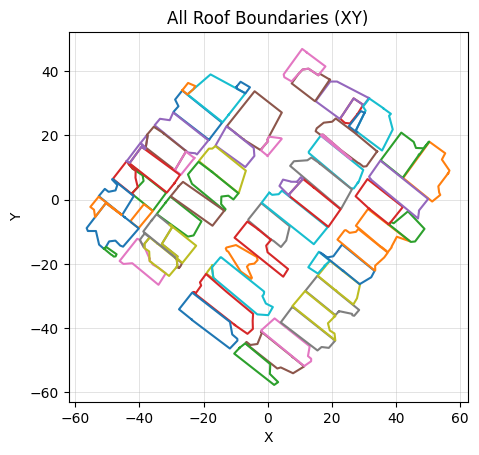

In [87]:
list_hits, polygonboundary3D = build_list_hits_and_polygonboundary3d(
    l_facadelines=l_facadelines,
    patches_nested=patches,
    l_zmax=l_zmax,
    dataset=dataset,
    xtrans=x0, ytrans=y0, ztrans=z0
)

plot_all_polygonboundary2D_from_polygonboundary3D(polygonboundary3D)

In [98]:
import numpy as np
import plotly.graph_objects as go

# ==========================
# PILIH INDEX
# ==========================
i_sel = 12   # persil
j_sel = 0   # roof

fig = go.Figure()

# ==========================
# Helper: polygon → Mesh3D (fan triangulation)
# ==========================
def add_patch(fig, poly3d, name=None, showlegend=False,
              face_color="lightblue", face_opacity=0.35,
              edge_color="blue", edge_width=4):

    V = np.asarray(poly3d, float)
    if V.shape[0] < 3:
        return

    x, y, z = V[:, 0], V[:, 1], V[:, 2]
    n = len(V)

    # triangulasi fan
    I, J, K = [], [], []
    for i in range(1, n - 1):
        I.append(0)
        J.append(i)
        K.append(i + 1)

    fig.add_trace(go.Mesh3d(
        x=x, y=y, z=z,
        i=I, j=J, k=K,
        color=face_color,
        opacity=face_opacity,
        showscale=False,
        name=name,
        showlegend=showlegend
    ))

    # outline
    outline = np.vstack([V, V[0]])
    fig.add_trace(go.Scatter3d(
        x=outline[:, 0],
        y=outline[:, 1],
        z=outline[:, 2],
        mode="lines",
        line=dict(color=edge_color, width=edge_width),
        showlegend=False
    ))

# ==========================
# 1) ROOF PATCHES (boundary3d > quad)
# ==========================
planeviz = patches[i_sel][j_sel]

for k, item in enumerate(planeviz):

    if "boundary3d" in item and item["boundary3d"] is not None:
        poly = item["boundary3d"]
    elif "quad" in item and item["quad"] is not None:
        poly = item["quad"]
    else:
        continue

    add_patch(
        fig,
        poly,
        name="Roof patches" if k == 0 else None,
        showlegend=(k == 0)
    )

# ==========================
# 2) FASAD LINES
# ==========================
fline = l_facadelines[i_sel][j_sel]

for idx, line in enumerate(fline):
    if "p0" in line and "p1" in line:
        P = np.vstack([line["p0"], line["p1"]])
    elif "xy" in line and "z_range" in line:
        x, y = line["xy"]
        zb, zt = line["z_range"]
        P = np.array([[x, y, zb], [x, y, zt]])
    else:
        continue

    fig.add_trace(go.Scatter3d(
        x=P[:, 0],
        y=P[:, 1],
        z=P[:, 2],
        mode="lines",
        line=dict(color="green", width=4),
        name="Fasad lines" if idx == 0 else None,
        showlegend=(idx == 0)
    ))

# ==========================
# 3) HIT POINTS
# ==========================
hits = list_hits[i_sel][j_sel]
inside_pts, fallback_pts = [], []

for h in hits:
    if h.get("hit_point") is None:
        continue
    (inside_pts if h.get("inside", False) else fallback_pts).append(h["hit_point"])

if inside_pts:
    P = np.vstack(inside_pts)
    fig.add_trace(go.Scatter3d(
        x=P[:, 0], y=P[:, 1], z=P[:, 2],
        mode="markers",
        marker=dict(size=6, color="orange"),
        name="Hit points (inside)"
    ))

if fallback_pts:
    P = np.vstack(fallback_pts)
    fig.add_trace(go.Scatter3d(
        x=P[:, 0], y=P[:, 1], z=P[:, 2],
        mode="markers",
        marker=dict(size=6, color="cyan"),
        name="Hit points (fallback)"
    ))

# ==========================
# LAYOUT
# ==========================
fig.update_layout(
    scene=dict(
        xaxis=dict(
            title=dict(text="X", font=dict(size=18)), # Judul Sumbu X
            tickfont=dict(size=14)                    # Angka Sumbu X
        ),
        yaxis=dict(
            title=dict(text="Y", font=dict(size=18)), # Judul Sumbu Y
            tickfont=dict(size=14)                    # Angka Sumbu Y
        ),
        zaxis=dict(
            title=dict(text="Z", font=dict(size=18)), # Judul Sumbu Z
            tickfont=dict(size=14)                    # Angka Sumbu Z
        ),
        aspectmode="data"
    ),
    width=1000,
    height=750,
    margin=dict(l=0, r=0, b=0, t=50),
    
    # Konfigurasi Legenda
    legend=dict(
        font=dict(size=16),          # Ukuran tulisan item legenda
        title=dict(
            text=f"Persil {i_sel}, Roof {j_sel}", 
            font=dict(size=18)       # Ukuran judul legenda
        ),
        itemsizing="constant"
    ),
    
    # Font global untuk teks lainnya
    font=dict(size=14)
)

fig.show()

membuat garis antar bidang potong komponen atap: patches

In [89]:
import numpy as np

# ==========================
# CONFIG
# ==========================
pad_aabb = 0.25          # broad-phase inflate AABB (kalau miss, naikin; kalau noise, turunin)
eps_parallel = 1e-10     # threshold paralel (cross product kecil)
eps_denom = 1e-14        # threshold denom clipping

# ==========================
# HELPERS
# ==========================
def get_quad3d(item):
    # kamu bilang sekarang pakai quad, tapi tetap fallback boundary3d
    if "quad" in item and item["quad"] is not None:
        return np.asarray(item["quad"], float)
    if "boundary3d" in item and item["boundary3d"] is not None:
        return np.asarray(item["boundary3d"], float)
    return None

def aabb_of_poly(P):
    return P.min(axis=0), P.max(axis=0)

def aabb_overlap(mn1, mx1, mn2, mx2, pad=0.0):
    return np.all((mn1 - pad) <= (mx2 + pad)) and np.all((mn2 - pad) <= (mx1 + pad))

def plane_from_item(item):
    # plane: a x + b y + c z + d = 0  => n·x + d = 0
    a, b, c, d = [float(x) for x in item["plane"]]
    n = np.array([a, b, c], float)
    return n, float(d)

def line_of_intersection(n1, d1, n2, d2):
    """
    Return (P0, vdir_unit) for intersection line of two planes, or (None,None) if parallel.
    We compute P0 robustly by solving:
        n1·x = -d1
        n2·x = -d2
        v ·x = 0    (choose the point on the line closest to origin in direction v)
    """
    v = np.cross(n1, n2)
    nv = np.linalg.norm(v)
    if nv < eps_parallel:
        return None, None
    vdir = v / nv

    A = np.vstack([n1, n2, vdir])
    b = np.array([-d1, -d2, 0.0], float)

    # Solve 3x3 (should be well-posed when not parallel)
    try:
        P0 = np.linalg.solve(A, b)
    except np.linalg.LinAlgError:
        # fallback least squares
        P0 = np.linalg.lstsq(A, b, rcond=None)[0]

    return P0, vdir

def project_uv(P3, origin, u, v):
    d = P3 - origin
    return np.array([d @ u, d @ v], float)

def ensure_ccw(poly_uv):
    # signed area
    x = poly_uv[:, 0]
    y = poly_uv[:, 1]
    area2 = np.sum(x * np.roll(y, -1) - np.roll(x, -1) * y)
    if area2 < 0:
        return poly_uv[::-1].copy()
    return poly_uv

def clip_line_to_convex_polygon_uv(P0, vdir, poly3d, u, v):
    """
    Cyrus–Beck clipping of 3D line x(t)=P0+t*vdir to convex polygon poly3d.
    Works in UV of that polygon's plane.
    Returns interval (tE, tL) or None.
    """
    poly3d = np.asarray(poly3d, float)
    N = poly3d.shape[0]
    if N < 3:
        return None

    origin = poly3d.mean(axis=0)
    p0_uv = project_uv(P0, origin, u, v)
    v_uv = np.array([vdir @ u, vdir @ v], float)

    # if direction almost zero in UV (should be rare)
    if np.linalg.norm(v_uv) < 1e-15:
        return None

    poly_uv = np.stack([project_uv(poly3d[k], origin, u, v) for k in range(N)], axis=0)
    poly_uv = ensure_ccw(poly_uv)

    tE = -np.inf
    tL =  np.inf

    for k in range(N):
        a = poly_uv[k]
        b = poly_uv[(k + 1) % N]
        e = b - a

        # inward normal for CCW polygon = left normal of edge
        n_in = np.array([-e[1], e[0]], float)

        f = np.dot(p0_uv - a, n_in)
        g = np.dot(v_uv, n_in)

        if abs(g) < eps_denom:
            # line parallel to this edge half-plane boundary
            if f < 0:
                return None  # outside
            else:
                continue     # inside, no constraint
        t_hit = -f / g

        if g > 0:
            # inequality f + t g >= 0 => t >= t_hit
            if t_hit > tE:
                tE = t_hit
        else:
            # g < 0 => t <= t_hit
            if t_hit < tL:
                tL = t_hit

        if tE > tL:
            return None

    if not np.isfinite(tE) or not np.isfinite(tL):
        return None
    if tL <= tE:
        return None

    return float(tE), float(tL)

def intersect_intervals(A, B):
    t0 = max(A[0], B[0])
    t1 = min(A[1], B[1])
    if t1 <= t0:
        return None
    return t0, t1

# ==========================
# MAIN: compute segments for ALL roofs (nested list like patches)
# ==========================
segments_roof = []  # [persil][roof] -> list of segments

for i in range(len(patches_segment)):
    seg_row = []
    for j in range(len(patches_segment[i])):
        pl = patches_segment[i][j]
        npatch = len(pl)

        polys = [get_quad3d(item) for item in pl]
        aabbs = [aabb_of_poly(P) if P is not None else None for P in polys]
        planes = [plane_from_item(item) for item in pl]

        segs_here = []
        for a in range(npatch):
            Pa = polys[a]
            if Pa is None:
                continue
            mn_a, mx_a = aabbs[a]
            n1, d1 = planes[a]
            u1 = np.asarray(pl[a]["u"], float)
            v1 = np.asarray(pl[a]["v"], float)

            for b in range(a + 1, npatch):
                Pb = polys[b]
                if Pb is None:
                    continue
                mn_b, mx_b = aabbs[b]

                # broad-phase: AABB overlap
                if not aabb_overlap(mn_a, mx_a, mn_b, mx_b, pad=pad_aabb):
                    continue

                n2, d2 = planes[b]
                P0, vdir = line_of_intersection(n1, d1, n2, d2)
                if P0 is None:
                    continue

                # clip to quad a (UV-a)
                ta = clip_line_to_convex_polygon_uv(P0, vdir, Pa, u1, v1)
                if ta is None:
                    continue

                # clip to quad b (UV-b)
                u2 = np.asarray(pl[b]["u"], float)
                v2 = np.asarray(pl[b]["v"], float)
                tb = clip_line_to_convex_polygon_uv(P0, vdir, Pb, u2, v2)
                if tb is None:
                    continue

                tab = intersect_intervals(ta, tb)
                if tab is None:
                    continue

                t0, t1 = tab
                Q0 = P0 + t0 * vdir
                Q1 = P0 + t1 * vdir
                seg_len = float(np.linalg.norm(Q1 - Q0))

                segs_here.append({
                    "patch_i": a,
                    "patch_j": b,
                    "p0": Q0,
                    "p1": Q1,
                    "len": seg_len
                })

        seg_row.append(segs_here)
    segments_roof.append(seg_row)

print("Done. segments_roof dibuat.")
print("Contoh segmen (0,0):", len(segments_roof[0][0]) if len(segments_roof)>0 and len(segments_roof[0])>0 else None)

Done. segments_roof dibuat.
Contoh segmen (0,0): 8


In [102]:
import plotly.graph_objects as go
import numpy as np

# ==========================
# PILIH INDEX
# ==========================
i_sel = 0
j_sel = 0

pl = patches[i_sel][j_sel]
segs = segments_roof[i_sel][j_sel]

def get_quad3d(item):
    if "quad" in item and item["quad"] is not None:
        return np.asarray(item["quad"], float)
    if "boundary3d" in item and item["boundary3d"] is not None:
        return np.asarray(item["boundary3d"], float)
    return None

fig = go.Figure()

# 1) Plot Roof Patches (Biru)
for k, item in enumerate(pl):
    poly = get_quad3d(item)
    if poly is None:
        continue
    out = np.vstack([poly, poly[0]])
    fig.add_trace(go.Scatter3d(
        x=out[:,0], y=out[:,1], z=out[:,2],
        mode="lines",
        line=dict(color="blue", width=3),
        name="Roof patches" if k == 0 else None,
        showlegend=(k == 0)
    ))

# 2) Plot Intersection Segments (Merah)
for idx, s in enumerate(segs):
    P = np.vstack([s["p0"], s["p1"]])
    fig.add_trace(go.Scatter3d(
        x=P[:,0], y=P[:,1], z=P[:,2],
        mode="lines",
        line=dict(color="red", width=8), 
        name="Intersection segments" if idx == 0 else None,
        showlegend=(idx == 0)
    ))

# ==========================
# LAYOUT (TULISAN BESAR, TANPA BORDER LEGENDA)
# ==========================
fig.update_layout(
    scene=dict(
        xaxis=dict(
            title=dict(text="<b>X (m)</b>", font=dict(size=22)),
            tickfont=dict(size=16, color="black")
        ),
        yaxis=dict(
            title=dict(text="<b>Y (m)</b>", font=dict(size=22)),
            tickfont=dict(size=16, color="black")
        ),
        zaxis=dict(
            title=dict(text="<b>Z (m)</b>", font=dict(size=22)),
            tickfont=dict(size=16, color="black")
        ),
        aspectmode="data"
    ),
    width=1100, 
    height=800,
    margin=dict(l=0, r=0, b=0, t=60),
    
    # Pengaturan Legenda (Tanpa Border)
    legend=dict(
        font=dict(size=18),
        title=dict(
            text=f"<b>Persil {i_sel}, Roof {j_sel} | segmen={len(segs)}</b>", 
            font=dict(size=20)
        ),
        itemsizing="constant",
        bgcolor="rgba(255, 255, 255, 0.5)", # Background sangat transparan
        borderwidth=0 # Menghapus garis luar legenda
    ),
    
    font=dict(family="Arial, sans-serif")
)

fig.show()

Membuat titik-titik di tengah atap dari garis perpotongan atap: segments_roof

In [91]:
import numpy as np

# ==========================
# CONFIG
# ==========================
# Toleransi jarak antara dua garis di ruang 3D (Logika A)
tolerance_3d = 0.05 

# Syarat diperlonggar: Titik valid meski hanya masuk di 1 patch
min_hit_patch = 1    

# Jarak minimal antar titik untuk digabung (Deduplikasi)
eps_merge_xyz = 0.20 

# ==========================
# CORE LOGIC FROM A: 3D INTERSECTION
# ==========================
def find_intersection_3d(s1_p0, s1_p1, s2_p0, s2_p1, tolerance=0.01):
    """Mencari titik terdekat antara dua garis di ruang 3D."""
    da = s1_p1 - s1_p0
    db = s2_p1 - s2_p0
    dc = s2_p0 - s1_p0

    cross_abc = np.cross(da, db)
    denom = np.sum(cross_abc**2)

    if denom < 1e-9: # Garis sejajar
        return None

    # Menggunakan determinan untuk mencari parameter t dan u
    t = np.linalg.det([dc, db, cross_abc]) / denom
    u = np.linalg.det([dc, da, cross_abc]) / denom

    # Cek apakah titik berada di DALAM rentang segmen (0 <= t, u <= 1)
    if 0 <= t <= 1 and 0 <= u <= 1:
        point_a = s1_p0 + t * da
        point_b = s2_p0 + u * db
        distance = np.linalg.norm(point_a - point_b)
        
        # Hanya kembalikan jika jarak antar garis di bawah toleransi
        if distance < tolerance:
            return (point_a + point_b) / 2
            
    return None

# ==========================
# HELPERS FROM B: VALIDASI PATCH
# ==========================
def plane_params(item):
    """Mengambil parameter bidang."""
    return [float(x) for x in item["plane"]]

def point_plane_signed_dist(n, d, P):
    """Jarak titik ke bidang."""
    nn = np.linalg.norm(n)
    return (np.dot(n, P) + d) / nn if nn > 1e-14 else np.inf

def get_quad3d(item):
    """Mengambil koordinat poligon."""
    if "quad" in item and item["quad"] is not None:
        return np.asarray(item["quad"], float)
    return np.asarray(item.get("boundary3d"), float) if item.get("boundary3d") is not None else None

def is_point_inside_patch(P, item, tol_dist=0.05):
    """Cek apakah titik P berada di dalam bidang dan batas poligon (2D Cross Product)."""
    quad = get_quad3d(item)
    if quad is None: return False
    
    a, b, c, d = plane_params(item)
    n = np.array([a, b, c])
    
    # 1. Cek jarak vertikal ke bidang
    if abs(point_plane_signed_dist(n, d, P)) > tol_dist:
        return False
    
    # 2. Cek apakah titik di dalam batas poligon (XY Projection)
    N = len(quad)
    for i in range(N):
        v1 = quad[i][:2] - P[:2]
        v2 = quad[(i+1)%N][:2] - P[:2]
        # Mengasumsikan urutan titik poligon konsisten (CCW)
        if (v1[0]*v2[1] - v1[1]*v2[0]) < -1e-10: 
            return False
    return True

def merge_points_3d(points, eps=0.2):
    """Menggabungkan titik-titik yang jaraknya sangat dekat."""
    if not points: return []
    pts = []
    for p in points:
        p = np.asarray(p, float)
        found = False
        for k in range(len(pts)):
            if np.linalg.norm(p - pts[k]) <= eps:
                pts[k] = (pts[k] + p) / 2
                found = True
                break
        if not found: pts.append(p)
    return pts

# ==========================
# MAIN EXECUTION
# ==========================
roof_vertices = []

for i in range(len(segments_roof)):
    row = []
    for j in range(len(segments_roof[i])):
        segs = segments_roof[i][j] # Input segmen merah
        pl = patches_segment[i][j]         # Input patch biru
        
        if not segs or len(segs) < 2:
            row.append([])
            continue

        # 1. Cari semua perpotongan antar pasangan segmen
        cand_xyz = []
        for a in range(len(segs)):
            p0_a, p1_a = np.array(segs[a]['p0']), np.array(segs[a]['p1'])
            for b in range(a + 1, len(segs)):
                p0_b, p1_b = np.array(segs[b]['p0']), np.array(segs[b]['p1'])
                
                res = find_intersection_3d(p0_a, p1_a, p0_b, p1_b, tolerance=tolerance_3d)
                if res is not None:
                    cand_xyz.append(res)

        if not cand_xyz:
            row.append([])
            continue

        # 2. Gabungkan kandidat yang bertumpuk
        cand_xyz_merged = merge_points_3d(cand_xyz, eps=eps_merge_xyz)

        # 3. Validasi terhadap patch (Syarat: Minimal 1 patch)
        valid_xyz = []
        for P in cand_xyz_merged:
            hit_count = 0
            for item in pl:
                if is_point_inside_patch(P, item):
                    hit_count += 1
            
            # Perbaikan: minimal 1 patch agar titik di area tunggal tetap muncul
            if hit_count >= min_hit_patch:
                valid_xyz.append(P.tolist())

        row.append(valid_xyz)
    roof_vertices.append(row)

print("Proses selesai. roof_vertices diperbarui dengan min_hit_patch = 1.")

Proses selesai. roof_vertices diperbarui dengan min_hit_patch = 1.


In [99]:
import plotly.graph_objects as go
import numpy as np

# ==========================
# PILIH INDEX
# ==========================
i_sel = 0
j_sel = 0

pl = patches_segment[i_sel][j_sel]
segs = segments_roof[i_sel][j_sel]
pts = roof_vertices[i_sel][j_sel]

def get_quad3d(item):
    if "quad" in item and item["quad"] is not None:
        return np.asarray(item["quad"], float)
    if "boundary3d" in item and item["boundary3d"] is not None:
        return np.asarray(item["boundary3d"], float)
    return None

fig = go.Figure()

# 1. Plot Patches (Biru)
for k, item in enumerate(pl):
    quad = get_quad3d(item)
    if quad is None: continue
    out = np.vstack([quad, quad[0]])
    fig.add_trace(go.Scatter3d(
        x=out[:,0], y=out[:,1], z=out[:,2],
        mode="lines",
        line=dict(color="blue", width=2),
        name="Roof patches" if k == 0 else None,
        showlegend=(k == 0)
    ))

# 2. Plot Segmen Merah (Intersection)
for idx, s in enumerate(segs):
    P = np.vstack([s["p0"], s["p1"]])
    fig.add_trace(go.Scatter3d(
        x=P[:,0], y=P[:,1], z=P[:,2],
        mode="lines",
        line=dict(color="red", width=6),
        name="Intersection segments" if idx == 0 else None,
        showlegend=(idx == 0)
    ))

# 3. Plot Titik Potong (Oranye)
if len(pts) > 0:
    P = np.asarray(pts, float)
    fig.add_trace(go.Scatter3d(
        x=P[:,0], y=P[:,1], z=P[:,2],
        mode="markers",
        marker=dict(size=8, color="orange", line=dict(width=1, color="black")),
        name=f"Roof vertices (n={len(pts)})"
    ))

# ==========================
# LAYOUT (UKURAN TULISAN DIPERBESAR)
# ==========================
fig.update_layout(
    scene=dict(
        xaxis=dict(
            title=dict(text="X", font=dict(size=20)), # Judul Sumbu X
            tickfont=dict(size=14)                    # Angka Sumbu X
        ),
        yaxis=dict(
            title=dict(text="Y", font=dict(size=20)), # Judul Sumbu Y
            tickfont=dict(size=14)                    # Angka Sumbu Y
        ),
        zaxis=dict(
            title=dict(text="Z", font=dict(size=20)), # Judul Sumbu Z
            tickfont=dict(size=14)                    # Angka Sumbu Z
        ),
        aspectmode="data"
    ),
    width=1100,  # Lebar kanvas sedikit ditambah
    height=800,  # Tinggi kanvas sedikit ditambah
    margin=dict(l=0, r=0, b=0, t=50),
    
    # Pengaturan Legenda diperbesar
    legend=dict(
        font=dict(size=18),          # Ukuran teks item legenda
        title=dict(
            text=f"<b>Persil {i_sel}, Roof {j_sel}</b>", 
            font=dict(size=20)       # Ukuran judul legenda
        ),
        itemsizing="constant",
        yanchor="top", y=0.99,
        xanchor="left", x=0.01
    ),
    
    # Pengaturan Font Global
    font=dict(family="Arial, sans-serif", size=14)
)

fig.show()

In [93]:
roof_vertices[0][0]

[[-25.080963120232852, 26.74712202672885, -0.723843704227061],
 [-25.479706356072008, 27.207250259062686, -0.6199553700073162],
 [-25.965849650371993, 30.964544306848637, -2.661949651339267]]

membuat titik potong pinggir

In [94]:
import numpy as np

# ==========================
# CONFIG & HELPERS
# ==========================
EPS_XY = 0.05  # Toleransi 5cm untuk pengecekan kesamaan koordinat XY

def seg_intersect_2d(A, B, P, Q, eps=1e-12):
    """Mencari titik potong 2D antara edge boundary (AB) dan segmen atap (PQ)."""
    A_xy, B_xy = A[:2], B[:2]
    P_xy, Q_xy = P[:2], Q[:2]
    r, s = B_xy - A_xy, Q_xy - P_xy
    
    def cross2(u, v): return u[0]*v[1] - u[1]*v[0]
    
    denom = cross2(r, s)
    if abs(denom) < eps: return None 
    
    t = cross2(P_xy - A_xy, s) / denom
    u = cross2(P_xy - A_xy, r) / denom
    
    if t < -eps or t > 1 + eps or u < -eps or u > 1 + eps: 
        return None
        
    return float(t), float(u)

def open_poly(poly):
    poly = np.asarray(poly, float).reshape(-1, 3)
    if len(poly) >= 2 and np.linalg.norm(poly[0] - poly[-1]) < 1e-6:
        return poly[:-1].copy()
    return poly.copy()

def close_poly(poly):
    if len(poly) == 0: return poly
    return np.vstack([poly, poly[0]])

# ==========================================
# MAIN LOGIC: DUAL-HIT VALIDATION
# ==========================================
def build_new_listpolygons_optimized_z(list_polygons, segments_roof, patches):
    """
    Menyisipkan titik potong ke boundary hanya jika segmen memotong di DUA titik.
    Logika Z:
    1. Jika XY dekat vertex asli -> Pakai Z Boundary.
    2. Jika XY di tengah edge -> Pakai Z Garis.
    """
    new_listpolygons = []

    for i in range(len(list_polygons)):
        row = []
        for j in range(len(list_polygons[i])):
            poly3 = list_polygons[i][j]
            segs = segments_roof[i][j] if (i < len(segments_roof) and j < len(segments_roof[i])) else []

            if poly3 is None or len(poly3) < 3:
                row.append(poly3); continue

            poly3_open = open_poly(poly3)
            N = poly3_open.shape[0]
            
            if not segs:
                row.append(close_poly(poly3_open)); continue

            # Kontainer untuk menyimpan hits per segmen garis atap
            # Kita hanya akan memproses segmen yang menghasilkan tepat 2 hits pada boundary
            valid_hits_to_insert = [[] for _ in range(N)]

            for s in segs:
                P3, Q3 = np.asarray(s["p0"]), np.asarray(s["p1"])
                segment_hits = [] # Simpan (index_edge, t_edge, X3)

                # Cek perpotongan segmen s terhadap SEMUA edge boundary
                for k in range(N):
                    A3, B3 = poly3_open[k], poly3_open[(k+1) % N]
                    hit = seg_intersect_2d(A3, B3, P3, Q3)
                    
                    if hit:
                        t_edge, u_seg = hit
                        X_xy = A3[:2] + t_edge * (B3[:2] - A3[:2])
                        
                        # --- ANALISIS Z ---
                        dist_to_A_xy = np.linalg.norm(X_xy - A3[:2])
                        dist_to_B_xy = np.linalg.norm(X_xy - B3[:2])

                        if dist_to_A_xy < EPS_XY:
                            X3 = A3.copy()
                        elif dist_to_B_xy < EPS_XY:
                            X3 = B3.copy()
                        else:
                            z_line = P3[2] + u_seg * (Q3[2] - P3[2])
                            X3 = np.array([X_xy[0], X_xy[1], z_line])
                        
                        segment_hits.append((k, t_edge, X3, dist_to_A_xy, dist_to_B_xy))

                # --- VALIDASI 2 TITIK ---
                # Hanya ambil segmen yang memotong boundary di dua tempat (masuk dan keluar)
                if len(segment_hits) == 2:
                    for k_idx, t_e, x3_val, d_A, d_B in segment_hits:
                        # Hindari duplikasi vertex A/B yang sudah ada di loop rekonstruksi
                        if d_A > 1e-4 and d_B > 1e-4:
                            valid_hits_to_insert[k_idx].append((t_e, x3_val))

            # Rekonstruksi poligon
            new_pts = []
            for k in range(N):
                new_pts.append(poly3_open[k])
                hits = valid_hits_to_insert[k]
                if hits:
                    # Urutkan berdasarkan posisi di edge agar tidak zigzag
                    hits.sort(key=lambda x: x[0]) 
                    for _, X3 in hits:
                        if np.linalg.norm(X3 - new_pts[-1]) > 1e-5:
                            new_pts.append(X3)
                            
            row.append(close_poly(np.asarray(new_pts)))
        new_listpolygons.append(row)
    return new_listpolygons

In [95]:
new_listpolygons = build_new_listpolygons_optimized_z(
    list_polygons=polygonboundary3D, 
    segments_roof=segments_roof, 
    patches=patches
)

In [100]:
import plotly.graph_objects as go
import numpy as np

def visualize_roof_intersections(i_sel, j_sel, polygonboundary3D, new_listpolygons, segments_roof, patches):
    """
    Visualisasi 3D dengan font besar dan tampilan zoom untuk perbandingan poligon atap.
    """
    fig = go.Figure()

    # 1. VALIDASI DATA
    try:
        old_data = polygonboundary3D[i_sel][j_sel]
        new_data = new_listpolygons[i_sel][j_sel]
        segs_data = segments_roof[i_sel][j_sel]
        patch_data = patches[i_sel][j_sel]
    except IndexError:
        print(f"Error: Indeks [{i_sel}][{j_sel}] tidak ditemukan.")
        return

    # 2. OLD POLYGON (BIRU)
    if old_data is not None:
        poly_old = np.asarray(old_data)
        fig.add_trace(go.Scatter3d(
            x=poly_old[:,0], y=poly_old[:,1], z=poly_old[:,2],
            mode="lines+markers",
            line=dict(color="blue", width=5, dash="dot"),
            marker=dict(size=4, opacity=0.6),
            name="Old Polygon (Original)"
        ))

    # 3. ROOF PATCHES (TRANSPARAN)
    for k, item in enumerate(patch_data):
        v = item.get("boundary3d")
        if v is not None:
            v_plot = np.vstack([v, v[0]])
            fig.add_trace(go.Scatter3d(
                x=v_plot[:,0], y=v_plot[:,1], z=v_plot[:,2],
                mode="lines",
                line=dict(color="lightblue", width=2),
                surfaceaxis=2,
                opacity=0.25,
                name=f"Roof Patch {k}",
                showlegend=False
            ))

    # 4. NEW POLYGON (HIJAU)
    if new_data is not None:
        poly_new = np.asarray(new_data)
        fig.add_trace(go.Scatter3d(
            x=poly_new[:,0], y=poly_new[:,1], z=poly_new[:,2],
            mode="lines+markers",
            line=dict(color="green", width=9), # Lebih tebal
            marker=dict(size=7, symbol="diamond", color="yellow", 
                        line=dict(width=1.5, color="black")),
            name="New Polygon (Optimized Z)"
        ))

    # 5. INTERSECTION SEGMENTS (MERAH)
    for idx, seg in enumerate(segs_data):
        p0 = np.asarray(seg["p0"])
        p1 = np.asarray(seg["p1"])
        
        fig.add_trace(go.Scatter3d(
            x=[p0[0], p1[0]],
            y=[p0[1], p1[1]],
            z=[p0[2], p1[2]],
            mode="lines+markers",
            line=dict(color="red", width=8),
            marker=dict(size=4, color="red"),
            name="Intersection Segment" if idx == 0 else None,
            showlegend=True if idx == 0 else False
        ))

    # 6. LAYOUT SETTINGS (FONT DIPERBESAR)
    fig.update_layout(
        title=dict(
            text=f"<b>Roof Visualization {i_sel}, {j_sel}</b>",
            x=0.5, y=0.95,
            font=dict(size=24) # Font Judul Besar
        ),
        width=1100,
        height=850,
        scene=dict(
            xaxis=dict(
                title=dict(text="<b>X (m)</b>", font=dict(size=20)),
                tickfont=dict(size=16)
            ),
            yaxis=dict(
                title=dict(text="<b>Y (m)</b>", font=dict(size=20)),
                tickfont=dict(size=16)
            ),
            zaxis=dict(
                title=dict(text="<b>Z (m)</b>", font=dict(size=20)),
                tickfont=dict(size=16)
            ),
            aspectmode="data",
            camera=dict(
                eye=dict(x=1.1, y=1.1, z=1.1), # Zoom Close-up
                center=dict(x=0, y=0, z=-0.1)
            )
        ),
        margin=dict(l=0, r=0, b=0, t=80),
        legend=dict(
            font=dict(size=18), # Font Legenda Besar
            yanchor="top", y=0.95, 
            xanchor="left", x=0.01,
            bgcolor="rgba(255, 255, 255, 0.5)"
        )
    )

    fig.show()

# Jalankan fungsi
visualize_roof_intersections(0, 0, polygonboundary3D, new_listpolygons, segments_roof, patches)

Membuat titik-titik untuk mesh

In [103]:
import numpy as np

def _to_nx3(arr):
    """
    Paksa input jadi numpy array shape (N,3).
    Menerima:
      - None / kosong -> (0,3)
      - (3,) -> (1,3)
      - (2,) -> (1,3) dengan z=0
      - (N,3) -> (N,3)
      - (N,2) -> (N,3) tambah z=0
    """
    if arr is None:
        return np.empty((0, 3), dtype=float)

    a = np.asarray(arr, dtype=float)

    if a.size == 0:
        return np.empty((0, 3), dtype=float)

    if a.ndim == 1:
        if a.shape[0] == 3:
            return a.reshape(1, 3)
        if a.shape[0] == 2:
            return np.array([[a[0], a[1], 0.0]], dtype=float)
        raise ValueError(f"_to_nx3: 1D harus panjang 2 atau 3, dapat {a.shape}")

    if a.ndim == 2:
        if a.shape[1] == 3:
            return a
        if a.shape[1] == 2:
            z = np.zeros((a.shape[0], 1), dtype=float)
            return np.hstack([a, z])
        raise ValueError(f"_to_nx3: 2D harus punya 2 atau 3 kolom, dapat {a.shape}")

    raise ValueError(f"_to_nx3: dimensi tidak didukung: {a.ndim}")

def _cluster_unionfind(P, radius=0.9):
    """
    Cluster titik-titik P (N,3) dengan aturan:
      dua titik satu cluster kalau jarak euclidean <= radius
    Output: list of clusters, masing-masing cluster berisi list indeks.
    """
    P = np.asarray(P, float)
    n = len(P)
    if n == 0:
        return []

    r2 = float(radius) ** 2

    parent = np.arange(n, dtype=int)
    rank = np.zeros(n, dtype=int)

    def find(a):
        while parent[a] != a:
            parent[a] = parent[parent[a]]
            a = parent[a]
        return a

    def union(a, b):
        ra, rb = find(a), find(b)
        if ra == rb:
            return
        if rank[ra] < rank[rb]:
            parent[ra] = rb
        elif rank[ra] > rank[rb]:
            parent[rb] = ra
        else:
            parent[rb] = ra
            rank[ra] += 1

    # union jika jarak <= radius
    for i in range(n):
        pi = P[i]
        for j in range(i + 1, n):
            d = pi - P[j]
            if (d[0]*d[0] + d[1]*d[1] + d[2]*d[2]) <= r2:
                union(i, j)

    # kumpulkan cluster
    buckets = {}
    for i in range(n):
        r = find(i)
        buckets.setdefault(r, []).append(i)

    return list(buckets.values())

def build_merged_ij_only(
    new_listpolygons,
    roof_vertices,
    radius=0.9,
):
    """
    Output:
      merged_ij[i][j] : titik hasil cluster gabungan (poly + roof)

    Aturan cluster:
      - Jika cluster ada titik NEW -> rep = mean(titik NEW)
      - Jika tidak ada titik NEW  -> rep = mean(semua titik)
    """

    I = max(len(new_listpolygons), len(roof_vertices))
    merged_ij = []

    for i in range(I):
        J = max(
            len(new_listpolygons[i]) if i < len(new_listpolygons) else 0,
            len(roof_vertices[i]) if i < len(roof_vertices) else 0
        )

        row_merged = []

        for j in range(J):
            poly = _to_nx3(new_listpolygons[i][j]) if (i < len(new_listpolygons) and j < len(new_listpolygons[i])) else np.empty((0,3))
            roof = _to_nx3(roof_vertices[i][j])     if (i < len(roof_vertices) and j < len(roof_vertices[i]))     else np.empty((0,3))

            if len(poly) == 0 and len(roof) == 0:
                row_merged.append(np.empty((0,3)))
                continue

            # === gabung semua titik ===
            P_all = np.vstack([poly, roof]) if len(roof) else poly.copy()
            is_new = np.r_[np.ones(len(poly), dtype=bool),
                           np.zeros(len(roof), dtype=bool)] if len(roof) else np.ones(len(poly), dtype=bool)

            clusters = _cluster_unionfind(P_all, radius=radius)

            reps = []
            for cl in clusters:
                cl = np.asarray(cl, int)
                clP = P_all[cl]
                clNew = is_new[cl]

                if np.any(clNew):
                    rep = clP[clNew].mean(axis=0)
                else:
                    rep = clP.mean(axis=0)

                reps.append(rep)

            row_merged.append(np.asarray(reps, float))

        merged_ij.append(row_merged)

    return merged_ij

In [104]:
merged_ij = build_merged_ij_only(
    new_listpolygons,
    roof_vertices,
    radius=0.9
)

In [105]:
def plot_merged_ij(merged_ij, i, j, size=5):
    M = _to_nx3(merged_ij[i][j])

    fig = go.Figure()
    if len(M):
        fig.add_trace(go.Scatter3d(
            x=M[:,0], y=M[:,1], z=M[:,2],
            mode="markers",
            marker=dict(size=size, color="red"),
            name=f"merged_ij[{i}][{j}] (n={len(M)})"
        ))

    fig.update_layout(
        title=f"Merged vertices | i={i}, j={j}",
        scene=dict(aspectmode="data")
    )
    fig.show()

In [106]:
i = 0   # indeks persil
j = 0   # indeks atap

plot_merged_ij(merged_ij, i, j)

bikin mesh

In [107]:
import numpy as np
import matplotlib.tri as mtri
from matplotlib.path import Path
import plotly.graph_objects as go

def _to_nx3(arr):
    if arr is None:
        return np.empty((0,3), float)
    A = np.asarray(arr, float)
    if A.size == 0:
        return np.empty((0,3), float)
    return A.reshape(-1,3)

def _open_boundary_xy(boundary_xyz, eps=1e-9):
    """Return boundary XY (N,2) tanpa titik terakhir yg sama dg pertama."""
    B = _to_nx3(boundary_xyz)
    if len(B) == 0:
        return np.empty((0,2), float)
    if len(B) >= 2 and np.linalg.norm(B[0] - B[-1]) < eps:
        B = B[:-1]
    return B[:, :2]

def build_mesh_xy_from_points(points_xyz):
    """Delaunay triangulation di XY untuk points_xyz -> (V,F)."""
    V = _to_nx3(points_xyz)
    if len(V) < 3:
        return V, np.empty((0,3), int)
    tri = mtri.Triangulation(V[:,0], V[:,1])
    F = np.asarray(tri.triangles, dtype=int)
    return V, F

def clip_faces_by_boundary_xy(V, F, boundary_xy):
    """
    Buang segitiga yang centroid XY-nya di luar boundary polygon.
    V: (N,3), F: (M,3), boundary_xy: (K,2) urut.
    """
    if len(F) == 0 or len(boundary_xy) < 3:
        return F

    path = Path(boundary_xy)
    cent = V[F][:, :, :2].mean(axis=1)  # (M,2) centroid XY
    inside = path.contains_points(cent, radius=-1e-9)
    return F[inside]

def build_mesh_ij_clipped(merged_ij, new_listpolygons):
    """
    merged_ij: nested ragged [I][J] -> (N,3) titik gabungan per atap
    new_listpolygons: nested ragged [I][J] -> boundary polygon urut (Nb,3)
    Return:
      mesh_ij: nested ragged [I][J] -> {"vertices": V, "faces": F}
    """
    I = len(merged_ij)
    mesh_ij = []

    for i in range(I):
        row = []
        for j in range(len(merged_ij[i])):
            pts = merged_ij[i][j]
            V, F = build_mesh_xy_from_points(pts)

            # boundary untuk clipping (ambil dari new_listpolygons[i][j])
            boundary_xy = np.empty((0,2), float)
            if i < len(new_listpolygons) and j < len(new_listpolygons[i]):
                boundary_xy = _open_boundary_xy(new_listpolygons[i][j])

            # clip faces
            F2 = clip_faces_by_boundary_xy(V, F, boundary_xy)

            row.append({"vertices": V, "faces": F2})
        mesh_ij.append(row)

    return mesh_ij

def plot_mesh_ij_pretty(mesh_ij, i, j,
                        title=None,
                        mesh_opacity=0.45,
                        edge_width=1,
                        edge_alpha=0.25,   # makin kecil makin halus
                        show_points=True,
                        point_size=3):
    mesh = mesh_ij[i][j]
    V, F = mesh["vertices"], mesh["faces"]

    if title is None:
        title = f"Pretty Mesh | i={i}, j={j}"

    if V is None or np.asarray(V).size == 0:
        print(f"(i={i}, j={j}) tidak ada vertex.")
        return

    V = np.asarray(V, float).reshape(-1,3)
    F = np.asarray(F, int).reshape(-1,3) if np.asarray(F).size else np.empty((0,3), int)

    fig = go.Figure()

    # --- Surface shading ---
    if len(F) > 0:
        fig.add_trace(go.Mesh3d(
            x=V[:,0], y=V[:,1], z=V[:,2],
            i=F[:,0], j=F[:,1], k=F[:,2],
            color="lightblue",
            opacity=mesh_opacity,
            flatshading=True,          # bikin efek facet/shading
            name="surface"
        ))

        # --- Soft edges (wireframe halus) ---
        xe, ye, ze = [], [], []
        for a, b, c in F:
            for u, v in ((a,b), (b,c), (c,a)):
                xe += [V[u,0], V[v,0], None]
                ye += [V[u,1], V[v,1], None]
                ze += [V[u,2], V[v,2], None]

        fig.add_trace(go.Scatter3d(
            x=xe, y=ye, z=ze,
            mode="lines",
            line=dict(color=f"rgba(50,50,50,{edge_alpha})", width=edge_width),
            name="edges"
        ))
    else:
        print(f"(i={i}, j={j}) faces kosong (titik < 3 / triangulasi gagal).")

    # --- Points (optional) ---
    if show_points:
        fig.add_trace(go.Scatter3d(
            x=V[:,0], y=V[:,1], z=V[:,2],
            mode="markers",
            marker=dict(size=point_size, color="black", opacity=0.7),
            name="points"
        ))

    fig.update_layout(
        title=title,
        scene=dict(aspectmode="data"),
        width=1000, height=650,
        margin=dict(l=0, r=0, b=0, t=40),
        showlegend=True
    )
    fig.show()

In [108]:
# ===== RUN SEKALI: bangun mesh_ij yang sudah di-clip oleh boundary new_listpolygons =====
mesh_ij = build_mesh_ij_clipped(merged_ij, new_listpolygons)

In [110]:
plot_mesh_ij_pretty(mesh_ij, 0, 0)

bikin boundary final mesh

In [111]:
import numpy as np
from collections import Counter, defaultdict

def _boundary_edges_from_faces(faces: np.ndarray) -> np.ndarray:
    """
    faces: (M,3) int
    return: (K,2) int boundary edges (undirected: min,max)
    """
    F = np.asarray(faces, dtype=int)
    if F.size == 0:
        return np.empty((0, 2), dtype=int)

    edges = np.vstack([F[:, [0, 1]], F[:, [1, 2]], F[:, [2, 0]]])
    edges = np.sort(edges, axis=1)  # undirected

    c = Counter(map(tuple, edges))
    bedges = np.array([e for e, cnt in c.items() if cnt == 1], dtype=int)
    return bedges


def _signed_area_xy(poly_xyz: np.ndarray) -> float:
    """Shoelace area pada bidang XY. poly tidak perlu tertutup."""
    if len(poly_xyz) < 3:
        return 0.0
    x = poly_xyz[:, 0]
    y = poly_xyz[:, 1]
    return 0.5 * float(np.dot(x, np.roll(y, -1)) - np.dot(y, np.roll(x, -1)))


def _build_all_boundary_loops(boundary_edges: np.ndarray, vertices: np.ndarray) -> list[list[int]]:
    """
    boundary_edges: (K,2) undirected (min,max)
    vertices: (N,3) float (dipakai untuk tie-break arah/angle)
    return: list of loops, tiap loop = list idx vertex (tanpa duplikasi start di akhir)
    Catatan: TIDAK ada simplifikasi segaris (collinear).
    """
    if boundary_edges.size == 0:
        return []

    V = np.asarray(vertices, dtype=float)

    # adjacency undirected
    adj = defaultdict(list)
    for a, b in map(tuple, boundary_edges):
        adj[a].append(b)
        adj[b].append(a)

    # semua edge yang belum dipakai (undirected)
    unused = set(map(tuple, map(tuple, boundary_edges)))

    def edge_key(u, v):
        return (u, v) if u < v else (v, u)

    def choose_next(prev, cur, candidates):
        """
        Pilih kandidat yang 'paling lurus' relatif arah prev->cur.
        Kalau prev None: pilih kandidat indeks terkecil (deterministik).
        """
        if not candidates:
            return None
        if prev is None:
            return min(candidates)

        p = V[prev]
        c = V[cur]
        v1 = c - p
        n1 = np.linalg.norm(v1)
        if n1 == 0:
            return min(candidates)

        best = None
        best_score = None
        for nb in candidates:
            v2 = V[nb] - c
            n2 = np.linalg.norm(v2)
            if n2 == 0:
                score = -1.0
            else:
                # maximize cos(theta) -> makin lurus makin besar
                score = float(np.dot(v1, v2) / (n1 * n2))

            # tie-break deterministik dengan indeks vertex
            if (best is None) or (score > best_score) or (score == best_score and nb < best):
                best = nb
                best_score = score
        return best

    loops = []

    while unused:
        # ambil edge deterministik
        a, b = min(unused)
        start = a
        prev = None
        cur = start

        loop = [start]

        # untuk mulai, kita butuh "next" yang benar:
        # kandidat = neighbor yang edge-nya masih unused
        first_candidates = []
        for nb in adj[cur]:
            ek = edge_key(cur, nb)
            if ek in unused:
                first_candidates.append(nb)
        nxt = choose_next(prev, cur, first_candidates)
        if nxt is None:
            # edge putus / data aneh; buang edge seed biar gak infinite
            unused.discard(edge_key(a, b))
            continue

        # pakai edge pertama
        unused.discard(edge_key(cur, nxt))
        loop.append(nxt)
        prev, cur = loop[-2], loop[-1]

        # jalan sampai balik ke start atau mentok
        safety = 0
        while True:
            safety += 1
            if safety > len(boundary_edges) + 10:
                break

            # kandidat dari cur yang masih unused
            candidates = []
            for nb in adj[cur]:
                ek = edge_key(cur, nb)
                if ek in unused:
                    candidates.append(nb)

            if not candidates:
                # mentok (open boundary / non-manifold)
                break

            nxt = choose_next(prev, cur, candidates)
            if nxt is None:
                break

            unused.discard(edge_key(cur, nxt))

            if nxt == start:
                # tutup loop (tanpa nambah start di akhir)
                break

            loop.append(nxt)
            prev, cur = cur, nxt

        # kalau loop valid minimal 3 titik dan kembali ke sekitar start (secara topologi)
        # (kita anggap valid kalau punya >=3 vertex unik)
        if len(loop) >= 3:
            loops.append(loop)

    return loops


def boundary_polygon_from_mesh(mesh: dict, outer_only: bool = True) -> np.ndarray:
    """
    mesh: {'vertices': (N,3), 'faces': (M,3)}
    outer_only=True: ambil loop terluar (area |max|) di XY
    return:
      - kalau outer_only: (L+1,3) polygon tertutup
      - kalau outer_only=False: list polygon tertutup (tiap loop)
    """
    V = np.asarray(mesh.get("vertices", []), dtype=float)
    F = np.asarray(mesh.get("faces", []), dtype=int)

    if V.size == 0 or F.size == 0:
        return np.empty((0, 3), dtype=float)

    bedges = _boundary_edges_from_faces(F)
    loops = _build_all_boundary_loops(bedges, V)

    if not loops:
        return np.empty((0, 3), dtype=float)

    # buat polygon (tanpa simplifikasi collinear)
    polys = []
    for idxs in loops:
        poly = V[np.asarray(idxs, dtype=int)]
        poly_closed = np.vstack([poly, poly[0]])
        polys.append(poly_closed)

    if not outer_only:
        return polys  # list[np.ndarray]

    # pilih loop terluar berdasarkan |area| terbesar di XY
    areas = [abs(_signed_area_xy(p[:-1])) for p in polys]  # p[:-1] biar tidak double
    outer_poly = polys[int(np.argmax(areas))]
    return outer_poly

In [112]:
# =========================
# INPUT: mesh_ij (nested)
# list pertama  : beberapa persil
# list kedua    : beberapa atap
# tiap elemen   : dict {'vertices','faces'}
# =========================

meshboundaryroof = []
for persil in mesh_ij:
    roof_list = []
    for roof_mesh in persil:
        # roof_mesh biasanya dict; kalau ada kasus None/empty, tetap aman
        if roof_mesh is None:
            roof_list.append(np.empty((0, 3), dtype=float))
        else:
            roof_list.append(boundary_polygon_from_mesh(roof_mesh))
    meshboundaryroof.append(roof_list)

# meshboundaryroof sekarang formatnya mirip new_listpolygons:
# [[array([[x,y,z],...,[x,y,z]]), array(...), ...],  # persil 1
#  [...]]                                           # persil 2

In [113]:
import numpy as np
import matplotlib.pyplot as plt

def plot_all_roofs_2d_from_new_listpolygons(new_listpolygons, title="All Roofs (new_listpolygons)"):
    """
    Plot semua atap dalam 1 canvas (2D XY) dari new_listpolygons.
    Support struktur:
      - new_listpolygons = [poly, poly, ...]  (poly: Nx2/Nx3)
      - new_listpolygons = [[poly, poly, ...], ...]  (nested)
      - new_listpolygons = [[[poly...]]] (lebih nested juga aman)
    """
    fig, ax = plt.subplots()
    any_plotted = False

    def _iter_polys(obj):
        # generator untuk mencari semua array/list titik di struktur nested
        if obj is None:
            return
        # kalau numpy array/list of points
        if isinstance(obj, np.ndarray):
            yield obj
            return
        if isinstance(obj, (list, tuple)):
            # kalau list kosong
            if len(obj) == 0:
                return
            # kalau isinya angka (rare) -> skip
            # kalau isinya list/array lain -> recurse
            for it in obj:
                yield from _iter_polys(it)
            return
        # selain itu (dict, int, str) -> skip
        return

    for poly in _iter_polys(new_listpolygons):
        P = np.asarray(poly, float)
        if P.size == 0:
            continue
        if P.ndim != 2 or P.shape[0] < 2:
            continue
        if P.shape[1] < 2:
            continue

        x = P[:, 0]
        y = P[:, 1]

        ax.plot(x, y)
        any_plotted = True

    if not any_plotted:
        print("Tidak ada polygon valid di new_listpolygons untuk diplot.")
        return

    ax.set_title(title)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_aspect("equal", adjustable="box")
    ax.grid(True, linewidth=0.5, alpha=0.5)
    plt.show()

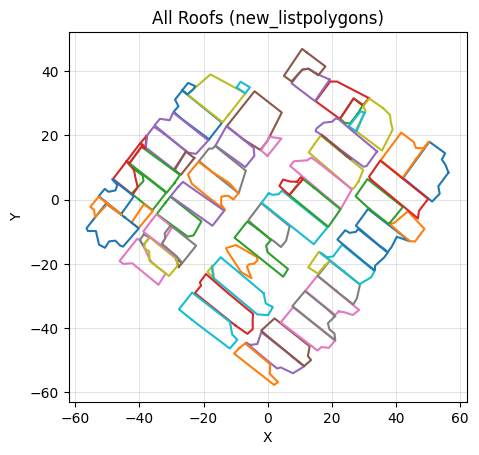

In [114]:
plot_all_roofs_2d_from_new_listpolygons(meshboundaryroof)

## 5. Pengolahan Badan Bangunan

a. adjust body building ke real fasad

In [115]:
import numpy as np
import math
from shapely.geometry import LineString, Polygon, MultiLineString, GeometryCollection, Point
from shapely.ops import unary_union

# ----------------------------
# Helpers untuk polygon 3D -> ring XY open + Z
# ----------------------------
def _to_nx3(arr):
    if arr is None:
        return np.empty((0,3), float)
    A = np.asarray(arr, float)
    if A.size == 0:
        return np.empty((0,3), float)
    # aman untuk (3,) atau (N,3)
    A = A.reshape(-1, A.shape[-1]) if A.ndim > 1 else A.reshape(1, -1)
    if A.shape[1] == 2:
        return np.hstack([A, np.zeros((len(A),1), float)])
    if A.shape[1] != 3:
        raise ValueError(f"_to_nx3: butuh 2/3 kolom, dapat {A.shape}")
    return A.astype(float, copy=False)

def _unique_open_ring_xy(poly3, eps=1e-9):
    """Return open ring XY (tanpa titik terakhir duplikat), remove consecutive duplicates."""
    P = _to_nx3(poly3)
    if len(P) < 3:
        return np.empty((0,2), float), np.empty((0,), float)

    closed = np.linalg.norm(P[0] - P[-1]) <= eps
    P_open = P[:-1] if closed else P

    out = []
    for p in P_open:
        if len(out) == 0 or np.linalg.norm(p - out[-1]) > eps:
            out.append(p)
    P_open = np.asarray(out, float).reshape(-1, 3)
    return P_open[:, :2], P_open[:, 2]

# ----------------------------
# Geometry helpers (sesuai logika kamu)
# ----------------------------
def get_coordinate_line(line: LineString):
    coords = list(line.coords)
    x1, y1 = coords[0]
    x2, y2 = coords[-1]
    vtx_1 = np.array([x1, y1], float)
    vtx_2 = np.array([x2, y2], float)
    return vtx_1, vtx_2

def are_parallel(line1: LineString, line2: LineString, tol_slope):
    c1 = list(line1.coords)
    x1, y1 = c1[0]
    x2, y2 = c1[-1]
    c2 = list(line2.coords)
    x3, y3 = c2[0]
    x4, y4 = c2[-1]

    slope1 = (y2 - y1) / (x2 - x1) if (x2 - x1) != 0 else float('inf')
    slope2 = (y4 - y3) / (x4 - x3) if (x4 - x3) != 0 else float('inf')
    return math.isclose(slope1, slope2, abs_tol=tol_slope)

def perpendicular_distance(line1: LineString, line2: LineString):
    c1 = list(line1.coords)
    x1, y1 = c1[0]
    x2, y2 = c1[1] if len(c1) > 1 else c1[-1]

    c2 = list(line2.coords)
    x3, y3 = c2[0]

    v1x = x2 - x1
    v1y = y2 - y1

    dx = x3 - x1
    dy = y3 - y1

    cross_product = dx * v1y - dy * v1x
    mag = math.sqrt(v1x**2 + v1y**2)
    if mag == 0:
        return float('inf')
    return abs(cross_product) / mag

def shift_line_by_perpendicular_distance(line1: LineString, line2: LineString, distance: float):
    c1 = list(line1.coords)
    x1, y1 = c1[0]
    x2, y2 = c1[1] if len(c1) > 1 else c1[-1]

    c2 = list(line2.coords)
    x3, y3 = c2[0]
    x4, y4 = c2[-1]

    v_ref_x = x4 - x3
    v_ref_y = y4 - y3

    perp_dx = -v_ref_y
    perp_dy = v_ref_x

    mag = math.sqrt(perp_dx**2 + perp_dy**2)
    if mag == 0:
        return line1

    ux = perp_dx / mag
    uy = perp_dy / mag

    def make_line(sign):
        new_x1 = x1 + sign * ux * distance
        new_y1 = y1 + sign * uy * distance
        new_x2 = x2 + sign * ux * distance
        new_y2 = y2 + sign * uy * distance
        return LineString([(new_x1, new_y1), (new_x2, new_y2)])

    cand_plus = make_line(+1.0)
    cand_minus = make_line(-1.0)

    if cand_plus.distance(line2) <= cand_minus.distance(line2):
        return cand_plus
    return cand_minus

def find_intersection(line1: LineString, line2: LineString, tol: float):
    c1 = list(line1.coords)
    x1, y1 = c1[0]
    x2, y2 = c1[-1]
    c2 = list(line2.coords)
    x3, y3 = c2[0]
    x4, y4 = c2[-1]

    dx1 = x2 - x1
    dy1 = y2 - y1
    dx2 = x4 - x3
    dy2 = y4 - y3

    denom = dx1 * dy2 - dy1 * dx2
    if math.isclose(denom, 0.0, abs_tol=tol):
        cekdenom = 0
        intersection_x = (x2 + x3) / 2
        intersection_y = (y2 + y3) / 2
    else:
        cekdenom = 1
        t = ((x3 - x1) * dy2 - (y3 - y1) * dx2) / denom
        intersection_x = x1 + t * dx1
        intersection_y = y1 + t * dy1

    return intersection_x, intersection_y, cekdenom

def extend_line(line: LineString, xmin, xmax, ymin, ymax):
    dxpoly = xmax - xmin
    dypoly = ymax - ymin

    vtx1, vtx2 = get_coordinate_line(line)
    xvtx1, yvtx1 = vtx1
    xvtx2, yvtx2 = vtx2

    dxline = abs(xvtx2 - xvtx1)
    dyline = abs(yvtx2 - yvtx1)

    if dxline == 0 and dyline == 0:
        return line

    xlength_extend = dxpoly / dxline if dxline != 0 else 1e6
    ylength_extend = dypoly / dyline if dyline != 0 else 1e6

    x0 = xvtx1 - (dxline * xlength_extend)
    y0 = yvtx1 - (dyline * ylength_extend)
    x2 = xvtx1 + (dxline * xlength_extend)
    y2 = yvtx1 + (dyline * ylength_extend)

    return LineString([(x0, y0), (x2, y2)])

def _nearest_z_for_xy(xy_new, xy_old, z_old):
    if len(xy_old) == 0:
        return np.zeros((len(xy_new),), float)
    outz = np.zeros((len(xy_new),), float)
    for k, p in enumerate(xy_new):
        d2 = np.sum((xy_old - p)**2, axis=1)
        outz[k] = z_old[int(np.argmin(d2))]
    return outz

# ----------------------------
# NEW small helpers for join/colinear handling
# ----------------------------
def line_distance(lineA: LineString, lineB: LineString) -> float:
    return float(lineA.distance(lineB))

def project_point_to_line_xy(line: LineString, xy):
    p = Point(float(xy[0]), float(xy[1]))
    t = line.project(p)
    q = line.interpolate(t)
    return np.array([q.x, q.y], float)

# ----------------------------
# Inti: adjust polygon atap dengan referensi fasad
# ----------------------------
def adjust_roof_polygon_with_facade(
    poly3,
    fasad_multilinestrings,
    *,
    radius,                 # NEW: radius cari calon pasangan segmen (prefilter)
    rad_par,                # radius keputusan geser / tidak
    tol_angle_deg=10/60,    # masih dipakai sebagai tol_slope (sesuai punyamu)
    clip_buffer=0.0,
    colinear_eps=1e-3,
):
    tol_slope = tol_angle_deg

    xy, z = _unique_open_ring_xy(poly3)
    n = len(xy)
    if n < 3:
        return {"poly_xy_new": np.empty((0,2), float),
                "poly_xyz_new": np.empty((0,3), float),
                "used_facade_lines": [],
                "shifted_edges": []}

    if isinstance(fasad_multilinestrings, MultiLineString):
        facade_lines = list(fasad_multilinestrings.geoms)
    else:
        facade_lines = list(fasad_multilinestrings) if fasad_multilinestrings is not None else []

    segs_orig = []
    for i in range(n):
        p1 = xy[i]
        p2 = xy[(i+1) % n]
        segs_orig.append(LineString([p1, p2]))

    segs_new = []
    used_facade_lines = []
    shifted_edges = []

    for si, line1 in enumerate(segs_orig):
        dists = []
        idxs = []

        for j, line2 in enumerate(facade_lines):

            # NEW: radius untuk "nyari calon pasangan segmen"
            # kandidat yang jauh dari line1 tidak dipertimbangkan sama sekali
            if line1.distance(line2) > radius:
                continue

            if are_parallel(line1, line2, tol_slope):
                dist_cp = perpendicular_distance(line1, line2)
                dists.append(dist_cp)
                idxs.append(j)

        if len(dists) == 0:
            segs_new.append(line1)
            shifted_edges.append(False)
            continue

        minval = min(dists)

        # rad_par: radius untuk MEMUTUSKAN digeser atau tidak
        if minval <= rad_par:
            j_pick = idxs[int(dists.index(minval))]
            line2_p = facade_lines[j_pick]
            line1_trans = shift_line_by_perpendicular_distance(line1, line2_p, minval)

            prev_orig = segs_orig[(si - 1) % n]
            next_orig = segs_orig[(si + 1) % n]

            colinear_prev = are_parallel(line1_trans, prev_orig, tol_slope) and (line_distance(line1_trans, prev_orig) <= colinear_eps)
            colinear_next = are_parallel(line1_trans, next_orig, tol_slope) and (line_distance(line1_trans, next_orig) <= colinear_eps)

            if colinear_prev or colinear_next:
                segs_new.append(line1)
                shifted_edges.append(False)
            else:
                segs_new.append(line1_trans)
                used_facade_lines.append(j_pick)
                shifted_edges.append(True)
        else:
            segs_new.append(line1)
            shifted_edges.append(False)

    # 3) rekonstruksi vertex:
    #    - normal: intersection (extend jika perlu)
    #    - jika segmen berurutan PARALLEL -> BEVEL JOIN (tambah 2 titik) membentuk segmen penghubung
    coords_list = []

    for j in range(len(segs_new)):
        lineA = segs_new[j]
        lineB = segs_new[(j + 1) % len(segs_new)]

        # corner hint dari polygon asli
        corner_hint = xy[(j + 1) % n]

        # PARALLEL: bevel join
        if are_parallel(lineA, lineB, tol_slope):
            pa = project_point_to_line_xy(lineA, corner_hint)
            pb = project_point_to_line_xy(lineB, corner_hint)

            if np.linalg.norm(pa - pb) <= colinear_eps:
                # hampir kolinear => cukup satu titik
                coords_list.append(pa)
            else:
                # bevel => dua titik (nanti otomatis tersambung jadi segmen penghubung)
                coords_list.append(pa)
                coords_list.append(pb)
            continue

        # NOT PARALLEL: intersection (langsung/extend)
        if lineA.intersects(lineB):
            xnew, ynew, ident = find_intersection(lineA, lineB, tol_slope)
            if ident == 1:
                coords_list.append(np.array([xnew, ynew], float))
            else:
                # fallback: proyeksi corner_hint
                coords_list.append(project_point_to_line_xy(lineA, corner_hint))
        else:
            v1, v2 = get_coordinate_line(lineA)
            v3, v4 = get_coordinate_line(lineB)
            bound = np.vstack((v1, v2, v3, v4))
            xmin, xmax = np.min(bound[:,0]), np.max(bound[:,0])
            ymin, ymax = np.min(bound[:,1]), np.max(bound[:,1])

            lineA_e = extend_line(lineA, xmin, xmax, ymin, ymax)
            lineB_e = extend_line(lineB, xmin, xmax, ymin, ymax)
            xnew, ynew, ident = find_intersection(lineA_e, lineB_e, tol_slope)

            if ident == 1:
                coords_list.append(np.array([xnew, ynew], float))
            else:
                coords_list.append(project_point_to_line_xy(lineA, corner_hint))

    coords_new = np.asarray(coords_list, float)

    # remove consecutive duplicates (karena bevel bisa bikin titik kembar)
    if len(coords_new) > 0:
        cleaned = [coords_new[0]]
        for p in coords_new[1:]:
            if np.linalg.norm(p - cleaned[-1]) > 1e-9:
                cleaned.append(p)
        coords_new = np.asarray(cleaned, float)

    # optional clip/buffer smoothing
    if clip_buffer and clip_buffer != 0.0:
        poly_tmp = Polygon(coords_new)
        if not poly_tmp.is_empty:
            poly_tmp = poly_tmp.buffer(-clip_buffer).buffer(+clip_buffer)
        if poly_tmp.is_empty:
            poly_xy_new = np.empty((0,2), float)
        else:
            poly_xy_new = np.asarray(poly_tmp.exterior.coords, float)
    else:
        poly_xy_new = coords_new

    # close ring
    if len(poly_xy_new) >= 3:
        if not np.allclose(poly_xy_new[0], poly_xy_new[-1]):
            poly_xy_new = np.vstack([poly_xy_new, poly_xy_new[0]])

    # z nearest original
    if len(poly_xy_new) == 0:
        poly_xyz_new = np.empty((0,3), float)
    else:
        z_new = _nearest_z_for_xy(poly_xy_new, xy, z)
        poly_xyz_new = np.hstack([poly_xy_new, z_new.reshape(-1,1)])

    return {
        "poly_xy_new": poly_xy_new,
        "poly_xyz_new": poly_xyz_new,
        "used_facade_lines": used_facade_lines,
        "shifted_edges": shifted_edges,
    }

# ----------------------------
# Clip fasad ALL -> kandidat per (persil, atap)
# ----------------------------
def build_fasad_candidates_nested(
    new_listpolygons,
    fasad_multilinestrings_all,
    *,
    min_length,
    fix_invalid=True,
    use_bbox=False,     # False = pakai polygon asli; True = pakai bbox polygon
):
    if fasad_multilinestrings_all is None:
        return [[MultiLineString([]) for _ in roofs] for roofs in new_listpolygons]

    candidates = []

    for roofs in new_listpolygons:
        row = []
        for poly3 in roofs:
            P = np.asarray(poly3, float)
            if P.size == 0 or P.ndim != 2 or P.shape[0] < 3 or P.shape[1] < 2:
                row.append(MultiLineString([]))
                continue

            xy = P[:, :2]

            # close ring jika belum
            if not np.allclose(xy[0], xy[-1]):
                xy = np.vstack([xy, xy[0]])

            poly_xy = Polygon(xy)
            if fix_invalid and (not poly_xy.is_valid):
                poly_xy = poly_xy.buffer(0)

            if poly_xy.is_empty:
                row.append(MultiLineString([]))
                continue

            roi = poly_xy.envelope if use_bbox else poly_xy

            clipped = fasad_multilinestrings_all.intersection(roi)
            if clipped.is_empty:
                row.append(MultiLineString([]))
                continue

            lines = []
            if isinstance(clipped, MultiLineString):
                lines = list(clipped.geoms)
            elif clipped.geom_type == "LineString":
                lines = [clipped]
            elif isinstance(clipped, GeometryCollection):
                for g in clipped.geoms:
                    if g.geom_type == "LineString":
                        lines.append(g)
                    elif g.geom_type == "MultiLineString":
                        lines.extend(list(g.geoms))

            lines = [ln for ln in lines if ln.length >= min_length]

            row.append(MultiLineString(lines) if lines else MultiLineString([]))

        candidates.append(row)

    return candidates

# ----------------------------
# Build boundary_body nested [persil][atap] -> XY ring
# ----------------------------
def build_boundary_body(
    new_listpolygons,
    fasad_lines_nested,
    *,
    radius,
    rad_par=None,          # NEW: boleh beda; kalau None -> sama dengan radius
    tol_angle_deg,
    clip_buffer=0.0,
    colinear_eps=1e-3,
):
    if rad_par is None:
        rad_par = radius

    boundary_body = []
    for i in range(len(new_listpolygons)):
        row_out = []
        roofs_i = new_listpolygons[i]
        fasad_i = fasad_lines_nested[i] if i < len(fasad_lines_nested) else []

        for j in range(len(roofs_i)):
            poly3 = roofs_i[j]
            fasad = fasad_i[j] if (j < len(fasad_i)) else MultiLineString([])

            res = adjust_roof_polygon_with_facade(
                poly3=poly3,
                fasad_multilinestrings=fasad,
                radius=radius,          # pairing radius
                rad_par=rad_par,        # decision radius
                tol_angle_deg=tol_angle_deg,
                clip_buffer=clip_buffer,
                colinear_eps=colinear_eps,
            )

            poly_xy_new = res.get("poly_xy_new", None)
            if poly_xy_new is None:
                row_out.append(np.empty((0, 2), float))
            else:
                poly_xy_new = np.asarray(poly_xy_new, float)
                row_out.append(poly_xy_new[:, :2] if (poly_xy_new.ndim == 2 and poly_xy_new.shape[1] >= 2)
                               else np.empty((0,2), float))

        boundary_body.append(row_out)
    return boundary_body

In [116]:
fasad_candidates = build_fasad_candidates_nested(
    meshboundaryroof,
    fasad_multilinestrings,  # ALL fasad
    min_length=0.1,
    fix_invalid=True,
    use_bbox=False           # pakai boundary asli
)

boundary_body = build_boundary_body(
    meshboundaryroof,
    fasad_lines_nested=fasad_candidates,
    radius=2,
    rad_par=2,     # cuma geser kalau jarak tegak lurus <= 2m
    tol_angle_deg=40/60,
    clip_buffer=0.0,
    colinear_eps=1e-3,
)

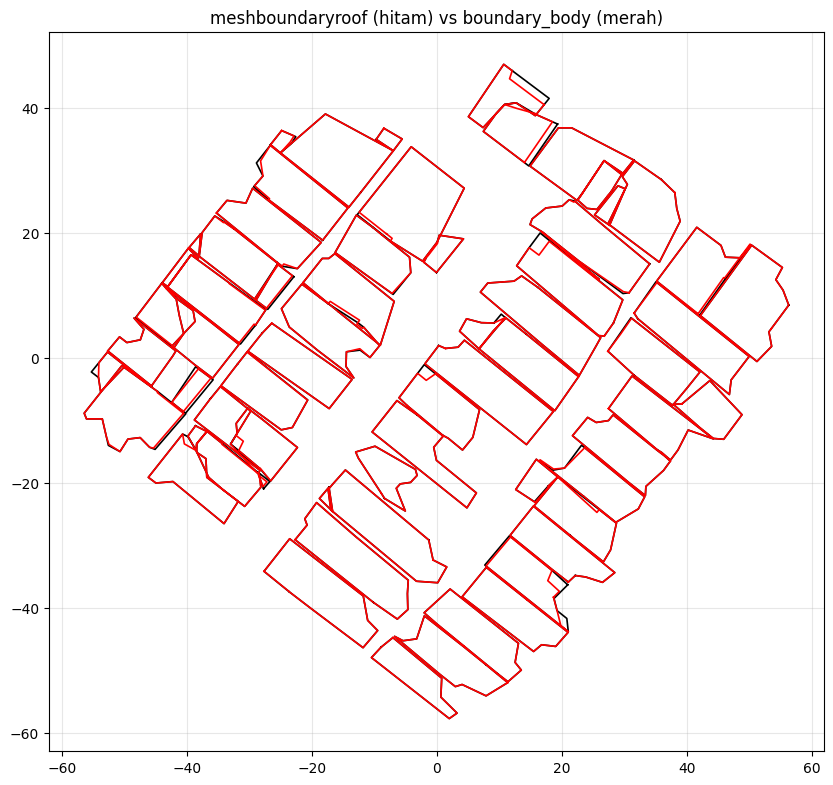

In [117]:
import numpy as np
import matplotlib.pyplot as plt

def _as_xy_ring(poly):
    """Ambil XY dari polygon ring (Nx2 / Nx3). Return (N,2) atau None kalau invalid."""
    if poly is None:
        return None
    A = np.asarray(poly, float)
    if A.size == 0 or A.ndim != 2 or A.shape[0] < 2:
        return None
    if A.shape[1] < 2:
        return None
    xy = A[:, :2]
    return xy

def _plot_ring(ax, xy, color="k", lw=1.0, alpha=1.0):
    """Plot ring polyline; kalau belum closed, akan terlihat tetap."""
    if xy is None or len(xy) < 2:
        return
    ax.plot(xy[:, 0], xy[:, 1], color=color, lw=lw, alpha=alpha)

def plot_roofs_overlay(meshboundaryroof, boundary_body,
                       color_mesh="k", color_boundary="r",
                       lw_mesh=1.2, lw_boundary=1.2,
                       alpha_mesh=1.0, alpha_boundary=1.0):
    fig, ax = plt.subplots(figsize=(10, 10))

    # meshboundaryroof (hitam)
    for roofs in meshboundaryroof:
        for poly in roofs:
            xy = _as_xy_ring(poly)
            _plot_ring(ax, xy, color=color_mesh, lw=lw_mesh, alpha=alpha_mesh)

    # boundary_body (merah) - biasanya sudah Nx2
    for roofs in boundary_body:
        for poly_xy in roofs:
            xy = _as_xy_ring(poly_xy)
            _plot_ring(ax, xy, color=color_boundary, lw=lw_boundary, alpha=alpha_boundary)

    ax.set_aspect("equal", adjustable="box")
    ax.grid(True, alpha=0.3)
    ax.set_title("meshboundaryroof (hitam) vs boundary_body (merah)")
    plt.show()

# Panggil:
plot_roofs_overlay(meshboundaryroof, boundary_body)

In [118]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def plot_boundary_body_and_meshboundaryroof_vertices(
    boundary_body,
    meshboundaryroof,
    title="boundary_body (polygon+vertices) vs meshboundaryroof vertices",
    s_body=18,      # merah (lebih besar)
    s_roof=8,       # hitam (lebih kecil, tapi terlihat karena ada outline)
    lw_body=1.2,
):
    """
    1 canvas:
    - boundary_body polygon line
    - boundary_body vertices merah (lebih besar) DI ATAS
    - meshboundaryroof vertices hitam (lebih kecil) DI BAWAH tapi dikasih outline putih agar tetap terlihat
    """

    fig, ax = plt.subplots(figsize=(9, 9))
    any_plotted = False

    # --------------------------
    # 1) meshboundaryroof (hitam) - bawah, tapi pakai OUTLINE putih
    # --------------------------
    if meshboundaryroof is not None:
        for persil in meshboundaryroof:
            for poly in persil:
                if poly is None:
                    continue
                P = np.asarray(poly, float)
                if P.size == 0 or P.ndim != 2 or P.shape[1] < 2:
                    continue

                xy = P[:, :2]
                if xy.shape[0] >= 2 and np.allclose(xy[0], xy[-1]):
                    xy = xy[:-1]

                ax.scatter(
                    xy[:, 0], xy[:, 1],
                    s=s_roof,
                    c="black",
                    alpha=1.0,
                    edgecolors="white",   # <-- kunci biar kelihatan
                    linewidths=0.6,
                    zorder=1
                )
                any_plotted = True

    # --------------------------
    # 2) boundary_body line (tengah)
    # --------------------------
    if boundary_body is not None:
        for persil in boundary_body:
            for poly in persil:
                if poly is None:
                    continue
                P = np.asarray(poly, float)
                if P.size == 0 or P.ndim != 2 or P.shape[1] < 2:
                    continue

                xy = P[:, :2]
                ax.plot(
                    xy[:, 0], xy[:, 1],
                    linewidth=lw_body,
                    alpha=0.9,
                    zorder=2
                )
                any_plotted = True

    # --------------------------
    # 3) boundary_body vertices merah (atas)
    # --------------------------
    if boundary_body is not None:
        for persil in boundary_body:
            for poly in persil:
                if poly is None:
                    continue
                P = np.asarray(poly, float)
                if P.size == 0 or P.ndim != 2 or P.shape[1] < 2:
                    continue

                xy = P[:, :2]
                ax.scatter(
                    xy[:, 0], xy[:, 1],
                    s=s_body,
                    c="red",
                    alpha=0.95,
                    edgecolors="none",
                    zorder=3
                )
                any_plotted = True

    if not any_plotted:
        print("Tidak ada data valid untuk diplot.")
        return

    ax.set_title(title)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_aspect("equal", adjustable="box")
    ax.grid(True, linewidth=0.5, alpha=0.5)

    legend_elems = [
        Line2D([0], [0], marker='o', color='w',
               markerfacecolor='red', markersize=np.sqrt(s_body),
               label='boundary_body vertices'),
        Line2D([0], [0], marker='o', color='w',
               markerfacecolor='black', markeredgecolor='white',
               markeredgewidth=0.6, markersize=np.sqrt(s_roof),
               label='meshboundaryroof vertices'),
        Line2D([0], [0], color='C0', lw=lw_body,
               label='boundary_body polygon'),
    ]
    ax.legend(handles=legend_elems, loc="best")

    plt.show()

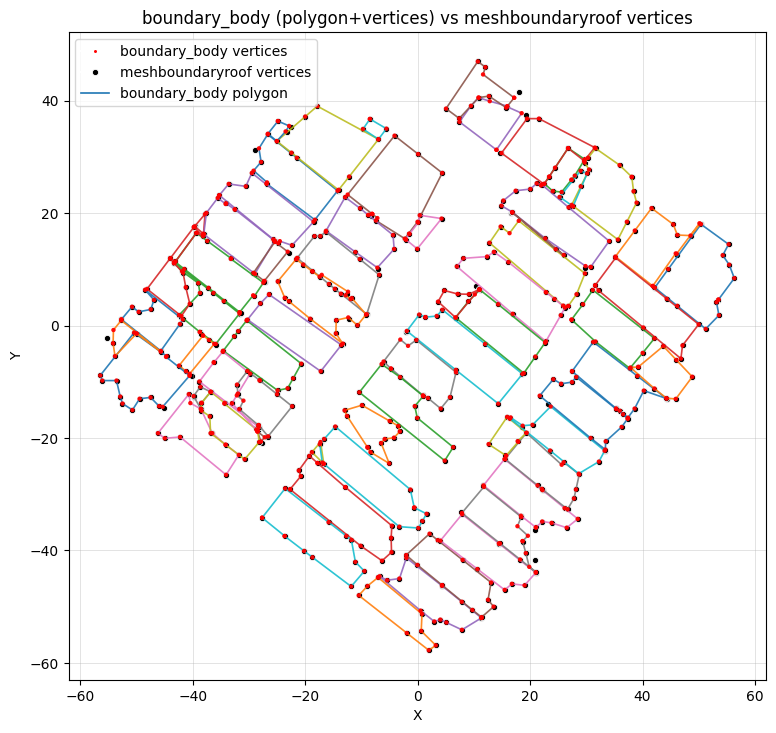

In [119]:
plot_boundary_body_and_meshboundaryroof_vertices(
    boundary_body=boundary_body,
    meshboundaryroof=meshboundaryroof,
    s_body=10,   # merah
    s_roof=20     # hitam
)

b. sesuaikan overlap gap body building yang berhimpit

In [120]:
import numpy as np
from shapely.geometry import LineString, MultiLineString, Polygon
from shapely.ops import unary_union, polygonize_full, snap

def _ring_xy_to_segments(poly_xy, eps=1e-9):
    """poly_xy: (N,2) closed/open -> list[LineString] edge-edge"""
    P = np.asarray(poly_xy, float)
    if P.size == 0 or P.ndim != 2 or P.shape[0] < 3 or P.shape[1] < 2:
        return []

    xy = P[:, :2]

    # close ring
    if not np.allclose(xy[0], xy[-1]):
        xy = np.vstack([xy, xy[0]])

    segs = []
    for k in range(len(xy) - 1):
        a = xy[k]
        b = xy[k + 1]
        if np.hypot(b[0]-a[0], b[1]-a[1]) <= eps:
            continue
        segs.append(LineString([tuple(a), tuple(b)]))
    return segs


def _segments_to_ring_xy(segs, eps=1e-6, nested_eps=0.02, remove_collinear=False):
    """
    list[LineString] -> exterior ring (Nx2) closed

    Perubahan:
    - remove_collinear default False (jangan buang titik segaris)
    - Prioritas: coba susun ring dari segmen input (preserve vertex),
      kalau gagal baru fallback polygonize (topology rebuild).
    """
    if not segs:
        return np.empty((0, 2), float)

    # ambil koordinat segmen, jangan buang vertex segaris
    lines = [ls for ls in segs if (ls is not None) and (not ls.is_empty) and (ls.length > eps)]
    if not lines:
        return np.empty((0, 2), float)

    # ----------------------------
    # A) Coba: reconstruct ring dari segmen input (preserve vertices)
    # ----------------------------
    # ambil edge sebagai pasangan titik (rounded key)
    def _key(p):
        return (round(float(p[0]) / eps) * eps, round(float(p[1]) / eps) * eps)

    edges = []
    for ls in lines:
        c = list(ls.coords)
        if len(c) < 2:
            continue
        a = np.array(c[0], float)
        b = np.array(c[-1], float)
        if np.hypot(b[0]-a[0], b[1]-a[1]) <= eps:
            continue
        edges.append((a, b))

    # adjacency (undirected) untuk cari loop
    from collections import defaultdict
    adj = defaultdict(list)
    pts = {}  # key -> representative point
    for a, b in edges:
        ka = _key(a); kb = _key(b)
        pts.setdefault(ka, a)
        pts.setdefault(kb, b)
        adj[ka].append(kb)
        adj[kb].append(ka)

    # pilih node start yang derajatnya 2 (boundary normal)
    loop = None
    if len(adj) >= 3:
        start = min(adj.keys())
        # walk sampai balik ke start
        cur = start
        prev = None
        path = [cur]
        ok = True
        for _ in range(len(adj) + 5):
            nbs = adj[cur]
            if not nbs:
                ok = False
                break
            if prev is None:
                nxt = nbs[0]
            else:
                if len(nbs) == 1:
                    nxt = nbs[0]
                else:
                    nxt = nbs[0] if nbs[0] != prev else nbs[1]
            if nxt == start:
                # closed
                path.append(start)
                break
            path.append(nxt)
            prev, cur = cur, nxt
        else:
            ok = False

        if ok and len(path) >= 4 and path[0] == path[-1]:
            ring_xy = np.array([pts[k] for k in path], float)

            # validasi sederhana: polygon tidak kosong & area > 0
            poly_test = Polygon(ring_xy)
            if (not poly_test.is_empty) and poly_test.is_valid and poly_test.area > 0:
                loop = ring_xy[:, :2]

    if loop is not None:
        # pastikan closed
        if len(loop) >= 3 and (not np.allclose(loop[0], loop[-1])):
            loop = np.vstack([loop, loop[0]])
        return loop[:, :2]

    # ----------------------------
    # B) Fallback: polygonize (bisa ubah vertex, tapi ini untuk kasus sulit)
    # ----------------------------
    ml = MultiLineString(lines)
    base = unary_union(ml)

    snapped = snap(base, base, nested_eps)
    noded = unary_union(snapped)

    polys, dangles, cuts, invalids = polygonize_full(noded)

    poly_list = []
    if polys is not None and (not polys.is_empty):
        if polys.geom_type == "Polygon":
            poly_list = [polys]
        elif polys.geom_type == "MultiPolygon":
            poly_list = list(polys.geoms)
        elif hasattr(polys, "geoms"):
            poly_list = [g for g in polys.geoms if g.geom_type == "Polygon"]

    if not poly_list:
        return np.empty((0, 2), float)

    p = max(poly_list, key=lambda g: g.area).buffer(0)
    if p.is_empty or p.geom_type != "Polygon":
        return np.empty((0, 2), float)

    # no holes
    p = Polygon(p.exterior).buffer(0)
    if p.is_empty:
        return np.empty((0, 2), float)

    ring = np.asarray(p.exterior.coords, float)

    # IMPORTANT: jangan hapus collinear (biar vertex segaris tetap ada)
    # (remove_collinear sengaja diabaikan / dipaksa False)

    if len(ring) >= 3 and (not np.allclose(ring[0], ring[-1])):
        ring = np.vstack([ring, ring[0]])

    return ring[:, :2]


def clean_boundary_body_all_persil(
    boundary_body,
    l_zmax,
    *,
    gap_tol=1,
    snap_tol=1,
    min_area=0.0,
    skip_if_single_polygon=True,
    nested_eps=0.02,
    include_holes=False,
    dissolve_area_tol=3,
    eps=1e-6,
    remove_collinear=False,   # <-- default False: jangan buang segaris
    debug=False,
    spike_angle_deg=2.0,
    spike_max_iter=20,
    z_eps=1e-9,
):
    """
    boundary_body: [persil][atap] -> (N,2) ring
    l_zmax:        [persil][atap] -> float

    Return:
      boundary_body_clean: [persil][atap] -> (M,2) ring
    """

    if len(boundary_body) != len(l_zmax):
        raise ValueError("len(boundary_body) != len(l_zmax)")

    boundary_body_clean = []

    for i in range(len(boundary_body)):
        roofs_xy = boundary_body[i]
        zvals = l_zmax[i]

        if len(roofs_xy) != len(zvals):
            raise ValueError(f"persil {i}: len(roofs_xy) != len(l_zmax_i)")

        # (1) ring -> segmen
        boundaryroof_i = []
        for j in range(len(roofs_xy)):
            segs = _ring_xy_to_segments(roofs_xy[j], eps=eps)
            boundaryroof_i.append(segs)

        # (2) pakai fungsi kamu (WAJIB sudah ada di notebook)
        out_segs_nested = clean_boundaryroof_polygon_first_topology(
            boundaryroof_i=boundaryroof_i,
            l_zmax_i=zvals,
            gap_tol=gap_tol,
            snap_tol=snap_tol,
            min_area=min_area,
            skip_if_single_polygon=skip_if_single_polygon,
            nested_eps=nested_eps,
            include_holes=include_holes,
            dissolve_area_tol=dissolve_area_tol,
            eps=eps,
            remove_collinear=remove_collinear,  # biarkan lewat, tapi kita preserve di ring builder
            debug=debug,
            spike_angle_deg=spike_angle_deg,
            spike_max_iter=spike_max_iter,
            z_eps=z_eps,
        )

        # (3) segmen -> ring XY lagi (preserve collinear)
        row_clean = []
        for j in range(len(out_segs_nested)):
            ring_xy = _segments_to_ring_xy(
                out_segs_nested[j],
                eps=eps,
                nested_eps=nested_eps,
                remove_collinear=False  # <-- paksa False agar segaris tidak hilang
            )
            row_clean.append(ring_xy)

        boundary_body_clean.append(row_clean)

    return boundary_body_clean

In [121]:
boundary_body_clean = clean_boundary_body_all_persil(
    boundary_body=boundary_body,
    l_zmax=l_zmax,   # nested sama persil/atap
    # default sudah sesuai permintaan kamu, jadi tidak perlu isi apa-apa lagi
)

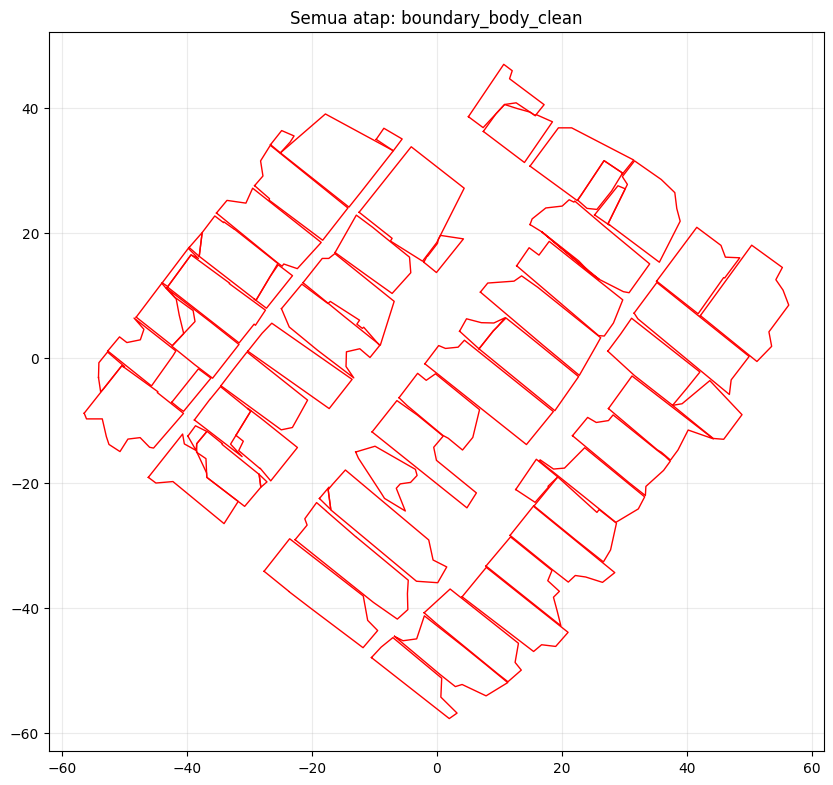

In [122]:
import numpy as np
import matplotlib.pyplot as plt

def plot_all_roofs(boundary_body_clean, *, color="red", lw=1.0):
    fig, ax = plt.subplots(figsize=(10, 10))

    for i, roofs in enumerate(boundary_body_clean):
        for j, poly in enumerate(roofs):
            A = np.asarray(poly, float)
            if A.size == 0 or A.ndim != 2 or A.shape[0] < 2:
                continue

            # ambil XY (kalau ternyata (N,3) juga aman)
            xy = A[:, :2]
            ax.plot(xy[:, 0], xy[:, 1], color=color, lw=lw)

    ax.set_aspect("equal", adjustable="box")
    ax.grid(True, alpha=0.25)
    ax.set_title("Semua atap: boundary_body_clean")
    plt.show()

# panggil
plot_all_roofs(boundary_body_clean, color="red", lw=1.0)

c. Membuat body building: face dan vertices DTM dan perpotongan dengan mesh_roof

In [123]:
import numpy as np
import matplotlib.tri as mtri

def _plane_from_3pts(p0, p1, p2, eps=1e-12):
    """
    Return plane ax+by+cz+d=0 from 3 points in 3D.
    """
    v1 = p1 - p0
    v2 = p2 - p0
    n = np.cross(v1, v2)
    nn = np.linalg.norm(n)
    if nn < eps:
        return None  # degenerate
    a, b, c = n
    d = -np.dot(n, p0)
    return float(a), float(b), float(c), float(d)

def _barycentric_xy(p, a, b, c, eps=1e-12):
    """
    Barycentric weights for point p in triangle (a,b,c) in 2D.
    Return (w0,w1,w2) or None if degenerate.
    """
    v0 = b - a
    v1 = c - a
    v2 = p - a
    den = v0[0]*v1[1] - v0[1]*v1[0]
    if abs(den) < eps:
        return None
    w1 = (v2[0]*v1[1] - v2[1]*v1[0]) / den
    w2 = (v0[0]*v2[1] - v0[1]*v2[0]) / den
    w0 = 1.0 - w1 - w2
    return float(w0), float(w1), float(w2)

import numpy as np
import matplotlib.tri as mtri

def _plane_from_3pts(p0, p1, p2, eps=1e-12):
    v1 = p1 - p0
    v2 = p2 - p0
    n = np.cross(v1, v2)
    nn = np.linalg.norm(n)
    if nn < eps: return None
    a, b, c = n
    d = -np.dot(n, p0)
    return float(a), float(b), float(c), float(d)

def _barycentric_xy(p, a, b, c, eps=1e-12):
    v0 = b - a
    v1 = c - a
    v2 = p - a
    den = v0[0]*v1[1] - v0[1]*v1[0]
    if abs(den) < eps: return None
    w1 = (v2[0]*v1[1] - v2[1]*v1[0]) / den
    w2 = (v0[0]*v2[1] - v0[1]*v2[0]) / den
    w0 = 1.0 - w1 - w2
    return float(w0), float(w1), float(w2)

def make_roof_z_interpolator(Vroof, Froof):
    Vroof = np.asarray(Vroof, float).reshape(-1, 3)
    Froof = np.asarray(Froof, int).reshape(-1, 3)

    if len(Vroof) < 3 or len(Froof) == 0:
        return lambda xy_query: np.zeros((len(np.asarray(xy_query).reshape(-1,2)),), float)

    # --- TAHAP PERBAIKAN: Cleaning Data ---
    # 1. Hapus duplikat titik di XY agar triangulasi valid
    # Gunakan rounding kecil untuk mengatasi floating point error
    _, unique_idx, inverse_idx = np.unique(np.round(Vroof[:, :2], 8), axis=0, return_index=True, return_inverse=True)
    V_clean = Vroof[unique_idx]
    F_clean = inverse_idx[Froof]

    # 2. Hapus face degenerate (segitiga yang punya index sama / luas 0)
    valid_faces = (F_clean[:, 0] != F_clean[:, 1]) & \
                  (F_clean[:, 1] != F_clean[:, 2]) & \
                  (F_clean[:, 2] != F_clean[:, 0])
    F_clean = F_clean[valid_faces]

    if len(F_clean) == 0:
        # Fallback jika tidak ada face valid
        return lambda xy_query: np.full((len(xy_query),), np.mean(Vroof[:, 2]))

    # --- PROSES TRIANGULASI ---
    x_c = V_clean[:, 0]
    y_c = V_clean[:, 1]

    try:
        tri = mtri.Triangulation(x_c, y_c, triangles=F_clean)
        trifinder = tri.get_trifinder()
    except RuntimeError:
        # Fallback terakhir jika triangulasi masih gagal (misal: semua titik segaris)
        def nearest_fallback(xy_query):
            from scipy.interpolate import NearestNDInterpolator
            interp = NearestNDInterpolator(V_clean[:, :2], V_clean[:, 2])
            return interp(xy_query)
        return nearest_fallback

    # Precompute planes dari V_clean & F_clean
    P0_c = V_clean[F_clean[:, 0]]
    P1_c = V_clean[F_clean[:, 1]]
    P2_c = V_clean[F_clean[:, 2]]
    cent_xy = (P0_c[:, :2] + P1_c[:, :2] + P2_c[:, :2]) / 3.0

    planes = []
    for k in range(len(F_clean)):
        pl = _plane_from_3pts(P0_c[k], P1_c[k], P2_c[k])
        planes.append(pl if pl is not None else (0.0, 0.0, 1.0, -P0_c[k, 2]))
    planes = np.asarray(planes, float)

    def z_of_xy(xy_query, *, inside_tol=-1e-9):
        xy_query = np.asarray(xy_query, float).reshape(-1, 2)
        out = np.zeros((len(xy_query),), float)
        t_idx = trifinder(xy_query[:, 0], xy_query[:, 1])

        for i, pxy in enumerate(xy_query):
            ti = int(t_idx[i])
            if ti >= 0:
                ia, ib, ic = F_clean[ti]
                a, b, c = V_clean[ia, :2], V_clean[ib, :2], V_clean[ic, :2]
                w = _barycentric_xy(pxy, a, b, c)
                if w is not None and all(wi >= inside_tol for wi in w):
                    out[i] = w[0]*V_clean[ia, 2] + w[1]*V_clean[ib, 2] + w[2]*V_clean[ic, 2]
                    continue
                # Fallback ke plane segitiga tersebut
                a_, b_, c_, d_ = planes[ti]
                out[i] = -(a_*pxy[0] + b_*pxy[1] + d_) / c_ if abs(c_) > 1e-12 else P0_c[ti, 2]
            else:
                # Outside: nearest triangle centroid
                d2 = np.sum((cent_xy - pxy)**2, axis=1)
                ti2 = int(np.argmin(d2))
                a_, b_, c_, d_ = planes[ti2]
                out[i] = -(a_*pxy[0] + b_*pxy[1] + d_) / c_ if abs(c_) > 1e-12 else P0_c[ti2, 2]
        return out
    
    return z_of_xy

In [124]:
import numpy as np

def _drop_last_if_closed_xy(xy, eps=1e-12):
    xy = np.asarray(xy, float).reshape(-1, 2)
    if len(xy) >= 2 and np.allclose(xy[0], xy[-1], atol=eps, rtol=0):
        return xy[:-1]
    return xy

def boundary_xyz_from_boundary_xy_and_mesh(boundary_body_clean, mesh_ij):
    """
    boundary_body_clean: [persil][atap] -> (N,2) ring (closed or open)
    mesh_ij:             [persil][atap] -> {'vertices','faces'}
    Return:
      boundary_roof_xyz: [persil][atap] -> (N,3) ring closed (xy + z interpolated)
      boundary_old_xy:   [persil][atap] -> (M,2) old mesh boundary (closed)
    """
    boundary_roof_xyz = []
    boundary_old_xy = []

    # helper: old boundary outer from mesh
    def _boundary_polygon_from_mesh_xy(mesh):
        # pakai fungsi kamu boundary_polygon_from_mesh kalau sudah ada
        poly3 = boundary_polygon_from_mesh(mesh, outer_only=True)
        if poly3 is None or len(poly3) == 0:
            return np.empty((0,2), float)
        P = np.asarray(poly3, float)
        return P[:, :2]

    for i, roofs in enumerate(boundary_body_clean):
        row_xyz = []
        row_old = []
        roofs_mesh = mesh_ij[i] if i < len(mesh_ij) else []

        for j, ring_xy in enumerate(roofs):
            ring_xy = np.asarray(ring_xy, float)
            if ring_xy.ndim != 2 or ring_xy.shape[0] < 3:
                row_xyz.append(np.empty((0,3), float))
                row_old.append(np.empty((0,2), float))
                continue

            mesh = roofs_mesh[j] if j < len(roofs_mesh) else None
            if not isinstance(mesh, dict):
                row_xyz.append(np.empty((0,3), float))
                row_old.append(np.empty((0,2), float))
                continue

            Vroof = np.asarray(mesh.get("vertices", []), float).reshape(-1, 3)
            Froof = np.asarray(mesh.get("faces", []), int).reshape(-1, 3)

            # old boundary
            old_xy = _boundary_polygon_from_mesh_xy(mesh)
            row_old.append(old_xy)

            # new boundary loop (open for interpolation)
            loop_xy = _drop_last_if_closed_xy(ring_xy[:, :2])
            if len(loop_xy) < 3:
                row_xyz.append(np.empty((0,3), float))
                continue

            z_of_xy = make_roof_z_interpolator(Vroof, Froof)
            z_top = z_of_xy(loop_xy)

            poly_xyz = np.column_stack([loop_xy, z_top]).astype(float)

            # close ring
            poly_xyz = np.vstack([poly_xyz, poly_xyz[0]])

            row_xyz.append(poly_xyz)

        boundary_roof_xyz.append(row_xyz)
        boundary_old_xy.append(row_old)

    return boundary_roof_xyz, boundary_old_xy

In [125]:
import numpy as np
from shapely.geometry import Polygon, Point
from shapely.ops import triangulate
import matplotlib.tri as mtri

def _empty_mesh():
    return {"vertices": np.empty((0, 3), float), "faces": np.empty((0, 3), int)}

def _as_tris(A):
    A = np.asarray(A, int)
    if A.size == 0:
        return np.empty((0, 3), int)
    return A.reshape(-1, 3)

def _drop_last_if_closed_xyz(xyz, eps=1e-12):
    P = np.asarray(xyz, float).reshape(-1, 3)
    if len(P) >= 2 and np.allclose(P[0, :2], P[-1, :2], atol=eps, rtol=0):
        return P[:-1]
    return P

def _delaunay_tris_in_poly(xy, poly):
    """
    xy: (N,2) points
    poly: shapely Polygon
    return triangles indices into xy
    """
    xy = np.asarray(xy, float).reshape(-1, 2)
    if len(xy) < 3 or poly.is_empty:
        return np.empty((0, 3), int)
    tri = mtri.Triangulation(xy[:, 0], xy[:, 1])
    keep = []
    for t in tri.triangles:
        c = xy[t].mean(axis=0)
        pt = Point(float(c[0]), float(c[1]))
        if poly.contains(pt) or poly.touches(pt):
            keep.append(t)
    return _as_tris(keep)

def _polygon_from_closed_ring_xy(ring_xy):
    ring_xy = np.asarray(ring_xy, float).reshape(-1, 2)
    if len(ring_xy) < 3:
        return Polygon()
    if not np.allclose(ring_xy[0], ring_xy[-1]):
        ring_xy = np.vstack([ring_xy, ring_xy[0]])
    poly = Polygon(ring_xy)
    if (not poly.is_valid) and (not poly.is_empty):
        poly = poly.buffer(0)
    return poly

def _triangulate_region_to_faces(region_poly, xy_to_vid, z_of_xy, V_out, base_vertex_offset=0):
    """
    region_poly: shapely Polygon or MultiPolygon
    xy_to_vid: dict[(rounded_x,rounded_y)] -> vertex id (in V_out)
    z_of_xy: interpolator function
    V_out: list to append vertices (as python list of [x,y,z])
    Return faces list (each face as [i0,i1,i2]) referencing V_out indices.
    """
    faces = []

    if region_poly.is_empty:
        return faces

    # triangulate returns list of Polygons (triangles)
    tris = triangulate(region_poly)
    if not tris:
        return faces

    def key_xy(x, y, eps=1e-9):
        return (round(float(x)/eps)*eps, round(float(y)/eps)*eps)

    for tpoly in tris:
        if tpoly.is_empty or tpoly.geom_type != "Polygon":
            continue
        coords = np.asarray(tpoly.exterior.coords, float)
        if len(coords) < 4:
            continue
        # triangle polygon repeats first point -> take first 3 unique
        pts = coords[:3, :2]

        vids = []
        for x, y in pts:
            k = key_xy(x, y)
            if k in xy_to_vid:
                vids.append(xy_to_vid[k])
            else:
                z = float(z_of_xy(np.array([[x, y]], float))[0])
                vid = base_vertex_offset + len(V_out)
                V_out.append([float(x), float(y), float(z)])
                xy_to_vid[k] = vid
                vids.append(vid)

        faces.append(vids)

    return faces

def build_volume_mesh_with_ceiling_extension(
    boundary_roof_xyz,
    boundary_old_xy,
    mesh_ij,
    dataset,
    xtrans, ytrans, ztrans,
    *,
    include_touches=True,
    debug=False,
    area_tol_outset=1e-6,
):
    """
    boundary_roof_xyz: [persil][atap] -> (N,3) closed boundary baru (xy+z interpolated)
    boundary_old_xy:   [persil][atap] -> (M,2) old boundary dari mesh_ij (closed)
    mesh_ij:           [persil][atap] -> {'vertices','faces'}
    Return:
      volume_mesh_ij, ceiling_faces_ij, floor_faces_ij, wall_faces_ij
    """
    volume_mesh_ij = []
    ceiling_faces_ij = []
    floor_faces_ij = []
    wall_faces_ij = []

    for i, roofs in enumerate(boundary_roof_xyz):
        vol_i, ceil_i, floor_i, wall_i = [], [], [], []
        roofs_mesh = mesh_ij[i] if i < len(mesh_ij) else []
        roofs_old = boundary_old_xy[i] if i < len(boundary_old_xy) else []

        for j, ring_xyz in enumerate(roofs):
            ring_xyz = np.asarray(ring_xyz, float)
            if ring_xyz.ndim != 2 or ring_xyz.shape[0] < 4 or ring_xyz.shape[1] != 3:
                vol_i.append(_empty_mesh()); ceil_i.append(np.empty((0,), int))
                floor_i.append(np.empty((0,), int)); wall_i.append(np.empty((0,), int))
                continue

            mesh = roofs_mesh[j] if j < len(roofs_mesh) else None
            if not isinstance(mesh, dict):
                vol_i.append(_empty_mesh()); ceil_i.append(np.empty((0,), int))
                floor_i.append(np.empty((0,), int)); wall_i.append(np.empty((0,), int))
                continue

            Vroof = np.asarray(mesh.get("vertices", []), float).reshape(-1, 3)
            Froof = np.asarray(mesh.get("faces", []), int).reshape(-1, 3)
            Nr = len(Vroof)

            # boundary baru (open)
            loop_xyz = _drop_last_if_closed_xyz(ring_xyz)
            Nb = len(loop_xyz)
            if Nb < 3:
                vol_i.append(_empty_mesh()); ceil_i.append(np.empty((0,), int))
                floor_i.append(np.empty((0,), int)); wall_i.append(np.empty((0,), int))
                continue

            loop_xy = loop_xyz[:, :2]
            z_top = loop_xyz[:, 2]

            # Polygon baru & lama
            P_new = _polygon_from_closed_ring_xy(loop_xy)
            old_xy = np.asarray(roofs_old[j], float) if j < len(roofs_old) else np.empty((0,2), float)
            P_old = _polygon_from_closed_ring_xy(old_xy) if len(old_xy) >= 3 else Polygon()

            if P_new.is_empty:
                vol_i.append(_empty_mesh()); ceil_i.append(np.empty((0,), int))
                floor_i.append(np.empty((0,), int)); wall_i.append(np.empty((0,), int))
                continue

            # interpolator z dari mesh roof (untuk extension vertices bila perlu)
            z_of_xy = make_roof_z_interpolator(Vroof, Froof)

            # -----------------------------
            # TOP boundary vertices (baru)
            # -----------------------------
            top_boundary = np.column_stack([loop_xy, z_top]).astype(float)

            # -----------------------------
            # BOTTOM boundary vertices (DTM)
            # -----------------------------
            bottom_boundary = np.zeros((Nb, 3), float)
            ok_bottom = True
            for k in range(Nb):
                x, y = float(loop_xy[k, 0]), float(loop_xy[k, 1])
                zb = sample_dtm_z(dataset, x, y, xtrans, ytrans, ztrans)
                if zb is None:
                    ok_bottom = False
                    if debug:
                        print(f"[WARN] DTM None: persil={i}, atap={j}, k={k}, x={x}, y={y}")
                    break
                bottom_boundary[k] = [x, y, float(zb)]
            if not ok_bottom:
                vol_i.append(_empty_mesh()); ceil_i.append(np.empty((0,), int))
                floor_i.append(np.empty((0,), int)); wall_i.append(np.empty((0,), int))
                continue

            # Vertex pool (index-based):
            # [0..Nb-1] bottom boundary
            # [Nb..2Nb-1] top boundary (baru)
            # [2Nb..2Nb+Nr-1] vertices roof original (tidak diubah)
            V_out_list = []
            V_out_list.extend(bottom_boundary.tolist())
            V_out_list.extend(top_boundary.tolist())
            if Nr > 0:
                V_out_list.extend(Vroof.tolist())

            # -----------------------------
            # WALL faces (pakai boundary baru)
            # -----------------------------
            wall_tris = []
            for k in range(Nb):
                k2 = (k + 1) % Nb
                b0, b1 = k, k2
                t0, t1 = Nb + k, Nb + k2
                wall_tris.append([b0, b1, t1])
                wall_tris.append([b0, t1, t0])
            wall_tris = _as_tris(wall_tris)

            # -----------------------------
            # FLOOR patch (triangulasi domain P_new di boundary)
            # -----------------------------
            patch_local = _delaunay_tris_in_poly(loop_xy, P_new)  # idx 0..Nb-1
            floor_tris = patch_local.astype(int) if len(patch_local) else np.empty((0,3), int)

            # -----------------------------
            # CEILING: 
            # - subset faces roof original yang masuk P_new
            # - plus extension triangulation untuk region P_new - P_old (kalau outset)
            # - plus patch boundary P_new bila ada hole (opsional, tapi aman untuk watertight)
            # -----------------------------
            ceil_mesh = []
            if Nr > 0 and len(Froof) > 0:
                for t in Froof:
                    c = Vroof[t][:, :2].mean(axis=0)  # centroid XY
                    pt = Point(float(c[0]), float(c[1]))
                    if P_new.contains(pt) or (include_touches and P_new.touches(pt)):
                        ceil_mesh.append((t + 2 * Nb).tolist())
            ceil_mesh = _as_tris(ceil_mesh)

            # boundary patch triangulation (ceiling side uses top boundary vertices Nb..2Nb-1)
            patch_ceiling = (Nb + patch_local).astype(int) if len(patch_local) else np.empty((0,3), int)

            # extension region only if P_new extends outside P_old
            ext_faces = []
            if (not P_old.is_empty):
                region_out = P_new.difference(P_old)
                if (not region_out.is_empty) and (region_out.area > area_tol_outset):
                    # map xy->vid for boundary top vertices (already exist)
                    def key_xy(x, y, eps=1e-9):
                        return (round(float(x)/eps)*eps, round(float(y)/eps)*eps)

                    xy_to_vid = {}
                    for k in range(Nb):
                        x, y = loop_xy[k]
                        xy_to_vid[key_xy(x,y)] = Nb + k  # top boundary vertex id

                    # triangulate extension region and add vertices as needed
                    ext_faces = _triangulate_region_to_faces(
                        region_poly=region_out,
                        xy_to_vid=xy_to_vid,
                        z_of_xy=z_of_xy,          # plane-per-triangle nearest inside/outside
                        V_out=V_out_list,
                        base_vertex_offset=0
                    )
                    ext_faces = _as_tris(ext_faces)

                    if debug:
                        print(f"[INFO] persil={i}, atap={j}: OUTSET ext_area={region_out.area:.4f}, ext_tris={len(ext_faces)}")

            # combine ceiling tris
            # default: pakai roof faces original + extension saja
            parts = [ceil_mesh, ext_faces]

            # kalau kamu butuh cap karena ceil_mesh kosong (mis. mesh roof tidak ada / gagal terpilih)
            if len(ceil_mesh) == 0:
                parts.insert(1, patch_ceiling)

            ceiling_tris = (
                np.vstack([p for p in parts if len(p) > 0]).astype(int)
                if any(len(p) > 0 for p in parts)
                else np.empty((0,3), int)
            )

            # -----------------------------
            # Combine all faces
            # -----------------------------
            faces_list = [floor_tris, wall_tris, ceiling_tris]
            F_out = np.vstack([f for f in faces_list if len(f) > 0]).astype(int) if any(len(f) > 0 for f in faces_list) else np.empty((0,3), int)

            # group ids
            base = 0
            floor_ids = np.arange(base, base + len(floor_tris), dtype=int); base += len(floor_tris)
            wall_ids  = np.arange(base, base + len(wall_tris), dtype=int);  base += len(wall_tris)
            ceil_ids  = np.arange(base, base + len(ceiling_tris), dtype=int) if len(ceiling_tris) else np.empty((0,), int)

            V_out = np.asarray(V_out_list, float).reshape(-1, 3)

            vol_i.append({"vertices": V_out, "faces": F_out})
            ceil_i.append(ceil_ids)
            floor_i.append(floor_ids)
            wall_i.append(wall_ids)

        volume_mesh_ij.append(vol_i)
        ceiling_faces_ij.append(ceil_i)
        floor_faces_ij.append(floor_i)
        wall_faces_ij.append(wall_i)

    return volume_mesh_ij, ceiling_faces_ij, floor_faces_ij, wall_faces_ij

In [126]:
# 1) Boundary baru (XY) -> jadi boundary 3D (Z dari interpolasi mesh atap)
boundary_roof_xyz, boundary_old_xy = boundary_xyz_from_boundary_xy_and_mesh(
    boundary_body_clean=boundary_body_clean,
    mesh_ij=mesh_ij
)

# 2) Build volume mesh yang ceiling-nya:
#    - subset mesh_ij di dalam boundary baru
#    - + extension P_new - P_old kalau boundary baru keluar
volume_mesh_ij, ceiling_faces_ij, floor_faces_ij, wall_faces_ij = build_volume_mesh_with_ceiling_extension(
    boundary_roof_xyz=boundary_roof_xyz,
    boundary_old_xy=boundary_old_xy,
    mesh_ij=mesh_ij,
    dataset=dataset,
    xtrans=x0, ytrans=y0, ztrans=z0,
    include_touches=True,
    debug=True,
    area_tol_outset=1e-6
)

[INFO] persil=2, atap=0: OUTSET ext_area=0.0296, ext_tris=4
[INFO] persil=11, atap=0: OUTSET ext_area=0.2382, ext_tris=1
[INFO] persil=15, atap=0: OUTSET ext_area=0.5312, ext_tris=5
[INFO] persil=21, atap=1: OUTSET ext_area=0.0476, ext_tris=2
[INFO] persil=24, atap=1: OUTSET ext_area=0.5007, ext_tris=4
[INFO] persil=25, atap=0: OUTSET ext_area=0.7402, ext_tris=4
[INFO] persil=27, atap=0: OUTSET ext_area=0.5387, ext_tris=1
[INFO] persil=37, atap=0: OUTSET ext_area=2.0923, ext_tris=7
[INFO] persil=41, atap=0: OUTSET ext_area=2.7206, ext_tris=2
[INFO] persil=42, atap=1: OUTSET ext_area=0.0000, ext_tris=1


In [127]:
import numpy as np
import plotly.graph_objects as go

def plot_persil_multi_roof_plotly(
    mesh_ij, volume_mesh_ij, i,
    *,
    roof_opacity=1.0,
    body_opacity=0.25,
    body_mode="wireframe",  # "wireframe" | "mesh" | "points"
    show_roof_edges=False,
    point_stride=1,         # untuk mode "points"
):
    """
    Render yang stabil (anti 'tembus'):
      - roof: Mesh3d solid
      - body:
          - wireframe: garis edges (REKOMENDASI, paling bersih & tidak tembus)
          - mesh: permukaan transparan (bisa artefak)
          - points: titik (stabil, tidak tembus)
    """

    roofs_i = mesh_ij[i]
    bodies_i = volume_mesh_ij[i] if volume_mesh_ij is not None else [None] * len(roofs_i)

    lighting = dict(
        ambient=0.25,
        diffuse=0.85,
        specular=0.35,
        roughness=0.6,
        fresnel=0.2
    )

    def get_body_mesh(body):
        if isinstance(body, dict) and ("vertices" in body):
            Vb = np.asarray(body["vertices"], float)
            Fb = np.asarray(body["faces"], int)
        else:
            Vb = np.asarray((body or {}).get("volume_vertices", []), float)
            Fb = np.asarray((body or {}).get("volume_faces", []), int)
        return Vb, Fb

    def edges(V, F):
        xs, ys, zs = [], [], []
        seen = set()
        for a, b, c in F:
            for u, v in ((a, b), (b, c), (c, a)):
                if u > v:
                    u, v = v, u
                if (u, v) in seen:
                    continue
                seen.add((u, v))
                xs += [V[u, 0], V[v, 0], None]
                ys += [V[u, 1], V[v, 1], None]
                zs += [V[u, 2], V[v, 2], None]
        return xs, ys, zs

    traces = []
    all_xyz_list = []

    # =========================
    # BODY dulu (wireframe/mesh/points)
    # =========================
    body_legend_added = False
    for j in range(len(roofs_i)):
        body = bodies_i[j] if j < len(bodies_i) else {}
        Vb, Fb = get_body_mesh(body)
        has_body = (Vb.size > 0) and (Fb.size > 0)
        if not has_body:
            continue

        all_xyz_list.append(Vb)

        if body_mode == "wireframe":
            xb, yb, zb = edges(Vb, Fb)
            traces.append(
                go.Scatter3d(
                    x=xb, y=yb, z=zb,
                    mode="lines",
                    line=dict(color="rgba(220,100,100,0.9)", width=2),
                    name="volume (wire)",
                    showlegend=not body_legend_added,
                    hoverinfo="skip",
                )
            )
            body_legend_added = True

        elif body_mode == "points":
            # ambil subset titik supaya ringan
            Vp = Vb[::max(1, int(point_stride))]
            traces.append(
                go.Scatter3d(
                    x=Vp[:, 0], y=Vp[:, 1], z=Vp[:, 2],
                    mode="markers",
                    marker=dict(size=2, color="rgba(220,100,100,0.8)"),
                    name="volume (points)",
                    showlegend=not body_legend_added,
                    hoverinfo="skip",
                )
            )
            body_legend_added = True

        elif body_mode == "mesh":
            traces.append(
                go.Mesh3d(
                    x=Vb[:, 0], y=Vb[:, 1], z=Vb[:, 2],
                    i=Fb[:, 0], j=Fb[:, 1], k=Fb[:, 2],
                    name="volume",
                    opacity=body_opacity,
                    color="rgba(220,100,100,1.0)",
                    flatshading=False,
                    lighting=lighting,
                    lightposition=dict(x=-200, y=150, z=300),
                    hoverinfo="skip",
                    showscale=False,
                    showlegend=not body_legend_added,
                )
            )
            body_legend_added = True

        else:
            raise ValueError("body_mode harus: 'wireframe' | 'mesh' | 'points'")

    # =========================
    # ROOF terakhir (solid)
    # =========================
    roof_legend_added = False
    for j in range(len(roofs_i)):
        roof = roofs_i[j]
        Vr = np.asarray(roof["vertices"], float)
        Fr = np.asarray(roof["faces"], int)

        all_xyz_list.append(Vr)

        traces.append(
            go.Mesh3d(
                x=Vr[:, 0], y=Vr[:, 1], z=Vr[:, 2],
                i=Fr[:, 0], j=Fr[:, 1], k=Fr[:, 2],
                name="roof",
                opacity=roof_opacity,
                color="rgba(70,130,200,1.0)",
                flatshading=False,
                lighting=lighting,
                lightposition=dict(x=200, y=200, z=300),
                hoverinfo="skip",
                showscale=False,
                showlegend=not roof_legend_added,
            )
        )
        roof_legend_added = True

        if show_roof_edges:
            xr, yr, zr = edges(Vr, Fr)
            traces.append(
                go.Scatter3d(
                    x=xr, y=yr, z=zr,
                    mode="lines",
                    line=dict(color="rgba(0,0,0,0.35)", width=2),
                    showlegend=False,
                    hoverinfo="skip",
                )
            )

    # =========================
    # AXIS RANGE
    # =========================
    if not all_xyz_list:
        raise ValueError(f"Tidak ada mesh untuk persil i={i}")

    all_xyz = np.vstack(all_xyz_list)
    mn = all_xyz.min(axis=0)
    mx = all_xyz.max(axis=0)

    fig = go.Figure(traces)
    fig.update_layout(
        title=f"Roof + Volume (persil={i}, semua atap) — body_mode={body_mode}",
        margin=dict(l=0, r=0, b=0, t=40),
        scene=dict(
            aspectmode="data",
            xaxis=dict(range=[mn[0], mx[0]]),
            yaxis=dict(range=[mn[1], mx[1]]),
            zaxis=dict(range=[mn[2], mx[2]]),
            camera=dict(eye=dict(x=1.6, y=1.6, z=1.2)),
        ),
        legend=dict(x=0.02, y=0.98),
    )
    fig.show()

In [135]:
plot_persil_multi_roof_plotly(mesh_ij, volume_mesh_ij, i=22, body_mode="wireframe")

In [136]:
volume_mesh_ij

[[{'vertices': array([[-29.1595988 ,  27.54171004,  -5.60967454],
          [-26.77339831,  25.45953374,  -5.79961595],
          [-26.85076627,  25.23058648,  -5.79961595],
          [-18.26554711,  18.80610398,  -6.49688157],
          [-14.22654611,  23.97260298,  -6.49633226],
          [-21.48115457,  29.83178013,  -5.76073655],
          [-26.64654811,  34.00360498,  -5.74602708],
          [-28.20508217,  31.50749518,  -5.84789476],
          [-27.82454511,  29.08860398,  -5.5368596 ],
          [-29.1595988 ,  27.54171004,  -2.49671847],
          [-26.77339831,  25.45953374,  -1.05485811],
          [-26.85076627,  25.23058648,  -1.03023833],
          [-18.26554711,  18.80610398,  -2.51600378],
          [-14.22654611,  23.97260298,  -1.44894541],
          [-21.48115457,  29.83178013,  -0.10063203],
          [-26.64654811,  34.00360498,  -2.94132905],
          [-28.20508217,  31.50749518,  -2.92058868],
          [-27.82454511,  29.08860398,  -2.71411535],
          [-18.2

In [137]:
ceiling_faces_ij

[[array([25, 26, 27, 28, 29, 30, 31, 32, 33, 34])],
 [array([34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45])],
 [array([28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]),
  array([22, 23, 24, 25, 26])],
 [array([25, 26, 27, 28, 29, 30, 31, 32, 33, 34])],
 [array([28, 29, 30, 31, 32, 33, 34, 35]), array([22, 23, 24, 25])],
 [array([28, 29, 30, 31, 32, 33, 34])],
 [array([13]),
  array([28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43]),
  array([], dtype=int64)],
 [array([25, 26, 27, 28, 29, 30, 31]), array([16, 17, 18, 19])],
 [array([22, 23, 24, 25, 26, 27])],
 [array([37, 38, 39, 40, 41, 42, 43, 44, 45])],
 [array([22, 23, 24, 25, 26, 27])],
 [array([10, 11]),
  array([37, 38, 39, 40, 41, 42, 43, 44, 45]),
  array([13, 14, 15]),
  array([28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44])],
 [array([25, 26, 27, 28, 29, 30, 31])],
 [array([40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]),
  array([25, 26, 27]),
  array([], dtype=int64)],
 [ar

In [138]:
floor_faces_ij

[[array([0, 1, 2, 3, 4, 5, 6])],
 [array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])],
 [array([0, 1, 2, 3, 4, 5, 6, 7]), array([0, 1, 2, 3, 4, 5])],
 [array([0, 1, 2, 3, 4, 5, 6])],
 [array([0, 1, 2, 3, 4, 5, 6, 7]), array([0, 1, 2, 3, 4, 5])],
 [array([0, 1, 2, 3, 4, 5, 6, 7])],
 [array([0, 1, 2]), array([0, 1, 2, 3, 4, 5, 6, 7]), array([], dtype=int64)],
 [array([0, 1, 2, 3, 4, 5, 6]), array([0, 1, 2, 3])],
 [array([0, 1, 2, 3, 4, 5])],
 [array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])],
 [array([0, 1, 2, 3, 4, 5])],
 [array([0, 1]),
  array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
  array([0, 1, 2]),
  array([0, 1, 2, 3, 4, 5, 6, 7])],
 [array([0, 1, 2, 3, 4, 5, 6])],
 [array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
  array([0, 1, 2, 3, 4, 5, 6]),
  array([], dtype=int64)],
 [array([0, 1, 2, 3, 4, 5])],
 [array([0]), array([0, 1, 2, 3, 4, 5, 6]), array([0, 1, 2, 3, 4, 5])],
 [array([0, 1, 2, 3, 4]),
  array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])],
 [array([0, 1, 

In [139]:
wall_faces_ij

[[array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
         24])],
 [array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
         27, 28, 29, 30, 31, 32, 33])],
 [array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
         25, 26, 27]),
  array([ 6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21])],
 [array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
         24])],
 [array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
         25, 26, 27]),
  array([ 6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21])],
 [array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
         25, 26, 27])],
 [array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
  array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
         25, 26, 27]),
  array([], dtype=int64)],
 [array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 2

d: menyimpan model hasil akhir

In [129]:
import os
import numpy as np

def save_obj(path, vertices, faces, *, object_name=None):
    """
    vertices: (V,3) float
    faces:    (F,3) int, 0-based indices
    """
    V = np.asarray(vertices, float).reshape(-1, 3)
    F = np.asarray(faces, int).reshape(-1, 3)

    if V.size == 0 or F.size == 0:
        return False

    os.makedirs(os.path.dirname(path), exist_ok=True)

    with open(path, "w", encoding="utf-8") as f:
        if object_name:
            f.write(f"o {object_name}\n")

        # vertices
        for x, y, z in V:
            f.write(f"v {x:.6f} {y:.6f} {z:.6f}\n")

        # faces (OBJ is 1-based)
        for a, b, c in F:
            f.write(f"f {a+1} {b+1} {c+1}\n")

    return True


def export_mesh_ij_and_volume_to_obj(
    mesh_ij,
    volume_mesh_ij,
    out_dir=r"D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4",
    *,
    export_roof=True,
    export_body=True,
    verbose=True
):
    n_roof = 0
    n_body = 0

    P = max(len(mesh_ij) if mesh_ij is not None else 0,
            len(volume_mesh_ij) if volume_mesh_ij is not None else 0)

    for i in range(P):
        # ---------- ROOF ----------
        if export_roof and mesh_ij is not None and i < len(mesh_ij):
            for j, mj in enumerate(mesh_ij[i]):
                if not isinstance(mj, dict):
                    continue
                V = mj.get("vertices", None)
                F = mj.get("faces", None)
                if V is None or F is None:
                    continue

                name = f"roof_persil_{i}_atap_{j}"
                path = os.path.join(out_dir, f"{name}.obj")
                ok = save_obj(path, V, F, object_name=name)
                if ok:
                    n_roof += 1
                    if verbose:
                        print("[OK]", path)

        # ---------- BODY ----------
        if export_body and volume_mesh_ij is not None and i < len(volume_mesh_ij):
            for j, bj in enumerate(volume_mesh_ij[i]):
                if not isinstance(bj, dict):
                    continue
                V = bj.get("vertices", None)
                F = bj.get("faces", None)
                if V is None or F is None:
                    continue

                name = f"body_persil_{i}_atap_{j}"
                path = os.path.join(out_dir, f"{name}.obj")
                ok = save_obj(path, V, F, object_name=name)
                if ok:
                    n_body += 1
                    if verbose:
                        print("[OK]", path)

    if verbose:
        print(f"Done. roof saved: {n_roof}, body saved: {n_body}")


# ========= PANGGIL =========
export_mesh_ij_and_volume_to_obj(
    mesh_ij=mesh_ij,
    volume_mesh_ij=volume_mesh_ij,
    out_dir=r"D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4",
    export_roof=True,
    export_body=True,
    verbose=True
)

[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\roof_persil_0_atap_0.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\body_persil_0_atap_0.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\roof_persil_1_atap_0.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\body_persil_1_atap_0.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\roof_persil_2_atap_0.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\roof_persil_2_atap_1.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\body_persil_2_atap_0.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\body_persil_2_atap_1.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\roof_persil_3_atap_0.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\body_persil_3_atap_0.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\roof_persil_4_atap_0.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASIL\model_code_4\roof_persil_4_atap_1.obj
[OK] D:\PENELITIAN\2025\MATCHMAKING\HASI